In [1]:
import casadi as ca
import numpy as np
import matplotlib
from matplotlib import pyplot as plt
from matplotlib import cm as mplcm
from matplotlib import colors as colors
from matplotlib import font_manager
from matplotlib import dates as mdates
from matplotlib.lines import Line2D
from scipy.integrate import solve_ivp
from scipy import interpolate, optimize, stats
import pypei

In [71]:
###################
# FLAGS
###################
do_profile = False
do_state_uq = True
###################
# %matplotlib widget
%matplotlib inline

In [3]:
dColours = plt.rcParams['axes.prop_cycle'].by_key()['color']
label_font = font_manager.FontProperties(
    family=['cmr10'],
    weight='regular',
    size=16,
)
legend_font = font_manager.FontProperties(
    family=['cmr10'],
    weight='regular',
    size=14,
)
tick_font = font_manager.FontProperties(
    family=['cmr10'],
    weight='regular',
    size=12,
)
pub_font = font_manager.FontProperties(
#     family=['cmr10'],
    family=['cmr10'],
    weight='regular',
    size=16
)
publish = True
if publish:
    matplotlib.rcParams.update(
        {
            'text.usetex': True,
            'font.family': 'cmr10',
#             'font.sans-serif': 'Arial',
            'font.serif': 'cmr10',
            'mathtext.fontset': 'cm',
        }
    )
plt.rcParams['figure.constrained_layout.use'] = True
plt.rcParams['figure.facecolor'] = 'white'
# plt.rcParams['axes.formatter.use_mathtext'] = True

In [4]:
xdate_format = mdates.DateFormatter("%b %Y")
at_months = mdates.MonthLocator()
at_half_month = mdates.DayLocator([15])

def form_xmonths(ax):
    ax.xaxis.set_major_locator(at_months)
    ax.xaxis.set_major_formatter(xdate_format)
    ax.xaxis.set_minor_locator(at_half_month)

In [5]:
np.random.seed(1234271)

In [6]:
def sir_model(t, y, p):
    b, a = p[:2]
    s, i, r = y[:3]
    return [
        -b*s*i/(s+i+r),
        b*s*i/(s+i+r) - a*i,
        a*i,
    ]

In [7]:
t_span = [0, 20]
y0_true = [999, 1, 0]
p_true = [1.3, 0.2]

sol_true = solve_ivp(sir_model, t_span=t_span, y0=y0_true, args=[p_true], dense_output=True)

In [8]:
n_obsv = 13
ts = np.linspace(t_span[0], t_span[1]*0.35, n_obsv)
ys = sol_true.sol(ts)[[0,2],:]
y_noisy = ys + (1 + 2*np.sqrt(ys))*np.random.randn(*ys.shape)
# y_noisy = np.random.poisson(ys)

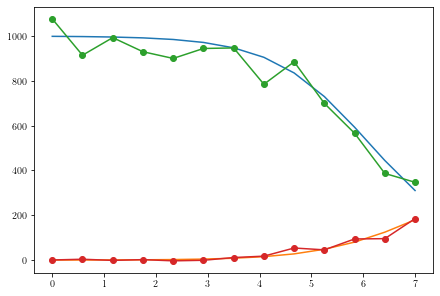

In [9]:
plt.figure()
plt.plot(ts, ys.T, '-')
plt.plot(ts, y_noisy.T, '-o')

In [10]:
model_form = {
    'state': 3,
    'parameters': 2,
}
model_config = {
    'grid_size': 200,
    'basis_number': 42,
    'model_form': model_form,
    'time_span': t_span,
    'model': sir_model,
}
model = pypei.modeller.Model(model_config)

In [12]:
def dt_MODELFIT(model):
    """ Default model fit objective value

    Assuming form ||Dx- f(x,p)||^2, returns Dx-f(x,p)
    """
    return ((model.xdash - model.model(model.observation_times,
                                      *model.cs, *model.ps)
           )*np.sqrt(np.gradient(model.observation_times))
           ).reshape((-1, 1))

def standard_MODELFIT(model):
    return (model.xdash - model.model(model.observation_times,
                                      *model.cs, *model.ps)
           ).reshape((-1, 1))

In [77]:
interpolator = model.all_x_at(model.cs, ts)[:,[0,2]].reshape((-1,1))

objective = pypei.objective.Objective()
objective_config = {
    'Y': [
        {
            'sz': y_noisy.shape,
            'obs_fn': interpolator,
        },
        {
            'sz': model.xs.shape,
            'unitary': True,
            'obs_fn': standard_MODELFIT(model),
        },
    ],
    'L': [
#         {
#             'depx': True,
#             'x': ca.SX.eye(np.prod(y_noisy.shape)),
#             'iden': True,
#         },
#         {
#             'depx': True,
#             'x': ca.SX.eye(np.prod(model.xs.shape)),
#             'iden': True,
#         },
        objective._autoconfig_L(y_noisy,),# auto=True, sigma=ss[0]),
#         objective._autoconfig_L(model.xs,),# auto=True, sigma=ss[1]),
        {
            'n': np.prod(model.xs.shape),
            'iid': True,
            'balance': False,
#             'w': 1/(np.diff(model.observation_times)[0])
        },
        
#         {
#             'n': 0,
#             'balance': False,
#             'depx': True,
#             'x': ca.diag([0.5]),
#             'iden': True,
#         },
    ]
}
objective.make(objective_config)

In [78]:
solver = pypei.irls_fitter.Solver(objective=objective)
solver_config = {
    'x': ca.vcat([*model.cs, *model.ps]),
    'f': objective.log_likelihood,
    'g': model.xs.reshape((-1, 1)),
    'p': ca.vcat(pypei.functions.misc.flat_squash(*objective.y0s, *objective.Ls)),
}# solver_config['o'] = pypei.fitter.ipopt_silent
solver.make(solver_config)

In [79]:
x0 = solver.proto_x0(model)
x0x0 = np.ones(model.K * model.s + len(model.ps))
x0x0[:-2] = np.random.poisson(x0x0[:-2] * 200)

def p(w, y_noisy):
    return [*[i for l in y_noisy for i in l], 0, *w]#0.2]
p_direct = p([], y_noisy)

def huber_weight_function(residuals, n_obsv, bounds):
    
    return np.clip(1/np.sqrt([float(ca.sumsqr(r))/n for r,n in zip(residuals, n_obsv)]),  *zip(*bounds))


weight_args = {'n_obsv': [n_obsv, model_config['grid_size']],
               'bounds': [(5e-2, np.inf), (-np.inf, 2e2)]}

# w0w0 = [2e-2, np.sqrt(1e-1)]
w0w0 = [1, 1]


In [80]:
sol, ws, shist, whist, rshist, ctrlhist = solver.irls(x0x0, p, y=y_noisy, nit=10, w0=w0w0, weight=huber_weight_function,
                                            weight_args=weight_args, lbg=0,
                                            hist=True)

Iteration: 0
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     2268
Number of nonzeros in Lagrangian Hessian.............:     1587

Total number of variables............................:      128
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:      600
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: -3.462815336958394e-14
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 200 -5.9094357e+03 0.00e+00 4.22e-05  -8.6 6.33e-10    -  1.00e+00 1.00e+00h  1 
 250 -5.9094357e+03 0.00e+00 1.44e-06  -8.6 3.04e-10    -  1.00e+00 6.10e-05f 15 
 300 -5.9094357e+03 0.00e+00 8.64e-05  -8.6 5.01e-10    -  1.00e+00 1.00e+00w  1 
 350 -5.9094357e+03 0.00e+00 7.19e-05  -8.6 3.04e-10    -  1.00e+00 1.00e+00w  1 
 400 -5.9094357e+03 0.00e+00 1.44e-06  -8.6 3.04e-10    -  1.00e+00 6.10e-05f 15 
 450 -5.9094357e+03 0.00e+00 1.44e-06  -8.6 3.04e-10    -  1.00e+00 6.10e-05f 15 
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 500 -5.9094357e+03 0.00e+00 1.44e-06  -8.6 3.04e-10    -  1.00e+00 6.10e-05f 15 
 550 -5.9094357e+03 0.00e+00 1.44e-06  -8.6 3.04e-10    -  1.00e+00 6.10e-05f 15 
 600 -5.9094357e+03 0.00e+00 1.44e-06  -8.6 3.72e-10    -  1.00e+00 6.10e-05f 14 w
 650 -5.9094357e+03 0.00e+00 3.14e-05  -8.6 1.63e-10    -  1.00e+00 1.00e+00w  1 
 700 -5.9094357e+03 0.00e+00 1.44e-06  -8.6 3.04e-10    -  1.00e+00 6.10e-05f 15 
 750 -5.9094357e

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 3.7244502735287226e-14
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 250 -5.9094357e+03 0.00e+00 1.67e-05  -8.6 4.80e-10    -  1.00e+00 3.05e-05f 16 
 300 -5.9094357e+03 0.00e+00 5.72e-05  -8.6 1.56e-10    -  1.00e+00 1.25e-01f  4 
 350 -5.9094357e+03 0.00e+00 4.10e-05  -8.6 1.01e-10    -  1.00e+00 3.05e-05f 16 
 400 -5.9094357e+03 0.00e+00 8.97e-05  -8.6 5.06e-10    -  1.00e+00 3.05e-05f 16 F+
 450 -5.9094357e+03 0.00e+00 2.33e-05  -8.6 2.26e-10    -  1.00e+00 1.56e-02f  7 
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 500 -5.9094357e+03 0.00e+00 1.19e-05  -8.6 1.84e-10    -  1.00e+00 1.00e+00h  1 
 550 -5.9094357e+03 0.00e+00 1.23e-04  -8.6 4.07e-10    -  1.00e+00 3.05e-05f 16 
 600 -5.9094357e+03 0.00e+00 1.23e-04  -8.6 4.07e-10    -  1.00e+00 3.05e-05f 16 
 650 -5.9094357e+03 0.00e+00 1.23e-04  -8.6 4.07e-10    -  1.00e+00 3.05e-05f 16 
 700 -5.9094357e+03 0.00e+00 1.23e-04  -8.6 2.47e-10    -  1.00e+00 3.05e-05f 15 w
 750 -5.9094357e+03 0.00e+00 4.77e-05  -8.6 7.36e-10    -  1.00e+00 1.00e+00w  1 
 800 -5.909435

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: -5.848310346863249e-15
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 200 -5.9094357e+03 0.00e+00 3.20e-05  -5.7 1.54e-10    -  1.00e+00 1.00e+00H  1 
Restoration phase is called at point that is almost feasible,
  with constraint violation 2.103906e-11. Abort.

Number of Iterations....: 224

                                   (scaled)                 (unscaled)
Objective...............:  -5.9094356808330922e+03   -5.9094356808330922e+03
Dual infeasibility......:   7.4755385526259488e-06    7.4755385526259488e-06
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035596818799e-09    2.5059035596818799e-09
Overall NLP error.......:   7.4755385526259488e-06    7.4755385526259488e-06


Number of objective function evaluations             = 581
Number of objective gradient evaluations             = 226
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 581
Number of equality constraint Jacobian evaluations   = 0
Number of inequality const

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: -7.110314158554287e-14
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


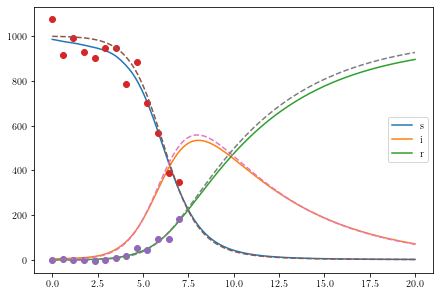

In [82]:
sol_state = solver.get_state(shist[0], model)
# print("WOUT = ", WOUT)
# print("LAMBDA = ", LAMBDA)
plt.figure()
plt.plot(model.observation_times, sol_state)
plt.plot(ts, y_noisy.T, 'o')
plt.plot(model.observation_times, sol_true.sol(model.observation_times).T, '--')
# plt.ylim(-100, 1100)
plt.legend('sir')

In [84]:
invest_idx = 1
print("investigating iteation", invest_idx)
print("variances: ", pypei.irls_fitter._inverse_weight_functions['gaussian'](whist[invest_idx]))
print("(weights: ", whist[invest_idx], ")")
print("pars: ", solver.get_parameters(shist[invest_idx], model))

investigating iteation 1
variances:  [400.           7.88523711]
(weights:  [0.05       0.35611693] )
pars:  (DM(1.21697), DM(0.190503))


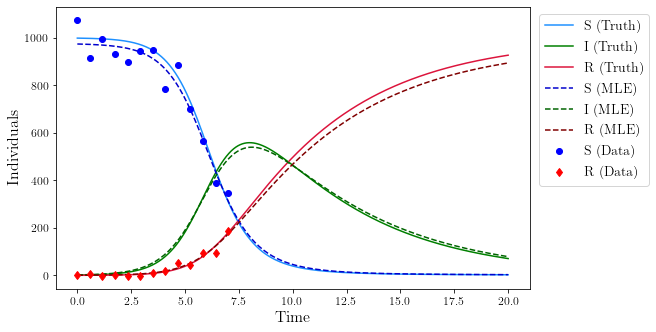

In [90]:
mle_idx = 1
cor_sol = shist[mle_idx]

plt.figure(figsize=[9, 4.5])
#     for y, _ in zip(*rys):
#         plt.plot(ts, y.reshape(y_noisy.shape).T, 'k+', alpha=0.1)
truth_ts = np.linspace(*t_span, 2001)
for tii, c in zip(sol_true.sol(truth_ts), ['dodgerblue', 'green', 'crimson']):
    plt.plot(truth_ts, tii, label="Truth", color=c, zorder=2)
for zii, c in zip(solver.get_state(cor_sol, model).T.toarray(), ['mediumblue', 'darkgreen', 'maroon']):
    plt.plot(model.observation_times, zii, '--', label='MLE', color=c, zorder=2)
for yii, lbl, mk, c in zip(y_noisy, ['S (Data)', 'R (Data)'], ['o', 'd'], ['b', 'r']):
    plt.plot(ts, yii, mk, label=lbl, color=c, zorder=2)

plt.legend(['S (Truth)', 'I (Truth)', 'R (Truth)',
            'S (MLE)', 'I (MLE)', 'R (MLE)',
            'S (Data)', 'R (Data)',],
           prop=legend_font,
           bbox_to_anchor=(1.005, 1), loc='upper left')
plt.xlabel("Time", fontproperties=label_font)
plt.ylabel("Individuals", font_properties=label_font)
plt.xticks(fontproperties=tick_font)
plt.yticks(fontproperties=tick_font);

# plt.savefig("/home/dwu402/REPOS/writing/smb2021/sir_fit.pdf", dpi=360)
# plt.savefig("/home/dwu402/Data/pypei-doc/img/balancedt10_iter9.png")

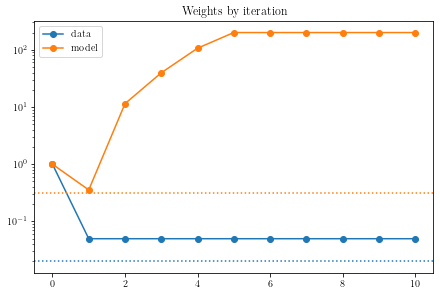

In [86]:
plt.figure()
plt.semilogy(whist, 'o-')
plt.legend(["data", "model"])
plt.title("Weights by iteration")
plt.axhline(2e-2, color=dColours[0], linestyle='dotted')
plt.axhline(np.sqrt(1e-1), color=dColours[1], linestyle='dotted')
# plt.savefig("/home/dwu402/Data/pypei-doc/img/balancedt10_weight.png")

In [21]:
def add_arrow(line, size=15, color=None, loglog=False):
    """
    add an arrow to a line.

    line:       Line2D object
    size:       size of the arrow in fontsize points
    color:      if None, line color is taken.
    loglog:     if True does log transforms
    """
    if color is None:
        color = line.get_color()

    xdata = line.get_xdata()
    ydata = line.get_ydata()

    if loglog:
        xy = (10**np.mean(np.log10(xdata)), 10**np.mean(np.log10(ydata)))
    else:
        xy = (np.mean(xdata), np.mean(ydata))
    
    line.axes.annotate('',
        xytext=(xdata[0], ydata[0]),
        xy=xy,
        arrowprops=dict(arrowstyle="->", color=color),
        size=size
    )

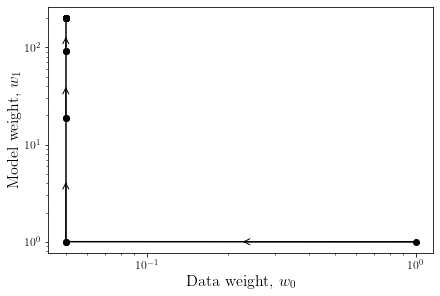

In [22]:
plt.figure(constrained_layout=True)
for w0, w1 in zip(whist[:-1], whist[1:]):
    ls = plt.loglog([w0[0], w1[0]], [w0[1], w1[1]], 'o-k')
    add_arrow(ls[0], loglog=True)
# ls = plt.loglog([w[0] for w in whist], [w[1] for w in whist], 'o-k')

# plt.xscale('log'); plt.yscale('log')
# for w0, w1 in zip(whist[:-1], whist[1:]):
#     plt.arrow(w0[0], w0[1], w1[0]-w0[0], w1[1]-w0[1], color='k', width=0.0005, length_includes_head=True)

plt.xlabel("Data weight, $w_0$", fontproperties=label_font)
plt.ylabel("Model weight, $w_1$", fontproperties=label_font)
plt.xticks(fontproperties=tick_font)
plt.yticks(fontproperties=tick_font);
# plt.savefig("/home/dwu402/Data/writing/samoa/img/sir_weights.pdf", dpi=360)
# plt.savefig("/home/dwu402/Data/pypei-doc/img/balance_Weight_space.png")

In [22]:
from mpl_toolkits import mplot3d
# %matplotlib inline

In [23]:
def znormalise(arr, index=np.max):
    arrmax = index(arr)
    return np.array(arr) - arrmax

In [24]:
zf = znormalise([x['f'] for x in shist], index=np.min)
zf

array([3.64224192e+04, 8.22627029e+03, 5.70279412e+03, 1.65574877e+03,
       3.15499744e+02, 1.36424205e-11, 7.82165444e-11, 0.00000000e+00,
       2.72848411e-11, 6.09361450e-11])

In [25]:
%matplotlib inline

Text(0.5, 0, 'log-likelihood (log10)')

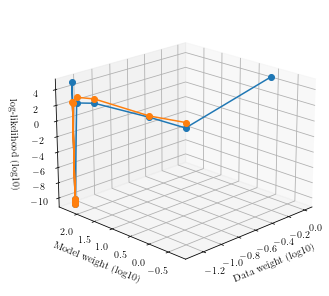

In [26]:
fig = plt.figure()
ax = plt.axes(projection='3d')
ax.plot3D(*np.log10(np.array(whist[:-1])).T, np.log10(zf, where=zf!=0), 'o-')
ax.plot3D(*np.log10(np.array(whist[1:])).T, np.log10(zf, where=zf!=0), 'o-')
ax.view_init(elev=20, azim=-135)
ax.set_xlabel("Data weight (log10)")
ax.set_ylabel("Model weight (log10)")
ax.set_zlabel("log-likelihood (log10)")

Text(0, 0.5, 'Model Error')

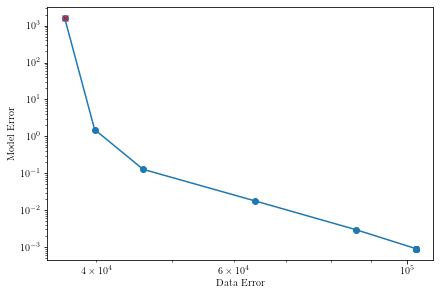

In [91]:
obj_parts = ca.Function("objparts", [solver.decision_vars, solver.parameters], [objective.us_obj_fn(i) for i in range(2)])

obj_parts_real = []
for si, wi in zip(shist, whist):
    obj_parts_real.append(np.squeeze(obj_parts(si['x'], p(wi, y_noisy))))

plt.figure()
plt.loglog(*zip(*obj_parts_real), 'o-')
plt.loglog(*obj_parts_real[0], 'rx')
plt.xlabel("Data Error")
plt.ylabel("Model Error")

Text(0.5, 1.0, 'Log-likelihood by iteration')

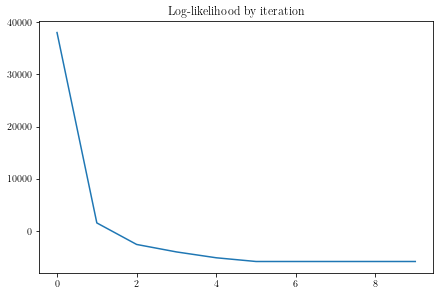

In [92]:
plt.figure()
plt.plot([s['f'] for s in shist])
plt.title("Log-likelihood by iteration")
# plt.legend(["data", "model"])

Text(0.5, 1.0, 'Improvement History')

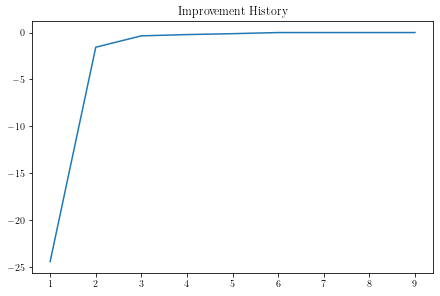

In [93]:
plt.figure()
plt.plot([c[0] for c in ctrlhist])
plt.title("Improvement History")

Text(0.5, 1.0, 'Parameters by iteration')

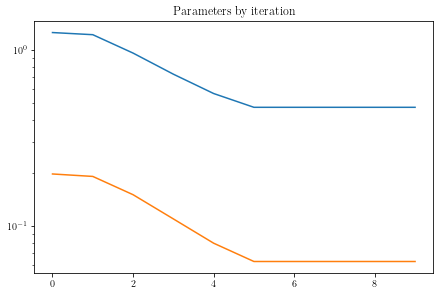

In [94]:
plt.figure()
plt.semilogy([np.squeeze(solver.get_parameters(s, model)) for s in shist])
plt.title("Parameters by iteration")

Text(0.5, 1.0, 'Validation Error by Iteration')

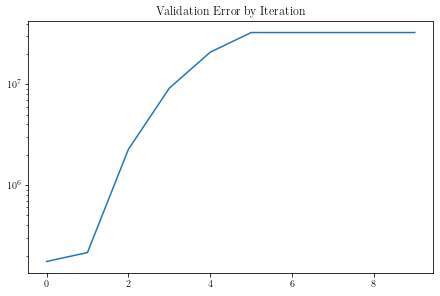

In [95]:
def validation(s):
    return ca.sumsqr(sol_true.sol(model.observation_times).T - solver.get_state(s, model))

plt.figure()
plt.semilogy([np.squeeze(validation(s)) for s in shist])
plt.title("Validation Error by Iteration")

In [33]:
# if do_profile:
prof_config = solver._profiler_configs(model)
solver.make_profilers(prof_config)

# corrected_parameter_mle = {'x': np.concatenate([shist[1]['x'][:-2], p_true])}

explicit_bounds = [
    profiler.symmetric_bound_sets(cor_sol, variance=var) for profiler, var in zip(solver.profilers, [0.25, 0.5])
]

cor_ws = whist[mle_idx]
mean_vals = [float(pflr.p_locator(cor_sol['x'])) for pflr in solver.profilers]

In [40]:
profiles = solver.profile(cor_sol, p=p, w0=cor_ws, y=y_noisy, nit=1, weight_args=weight_args, pbounds=explicit_bounds)

Iteration: 0
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        1
Number of nonzeros in inequality constraint Jacobian.:     2268
Number of nonzeros in Lagrangian Hessian.............:     1587

Total number of variables............................:      128
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        1
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_

In [38]:
# if do_profile:
    # ob1kenob = ca.Function('ob1kenob', [solver.decision_vars, solver.parameters], [objective.obj_fn(0)])

full_ll = ca.Function('lLfn', [solver.decision_vars, solver.parameters], [objective.log_likelihood])
ninefive = np.exp(-1/2 * (stats.chi2.ppf(q=0.95, df=1)))
ninenine = np.exp(-1/2 * stats.chi2.ppf(q=0.99, df=1))

[1.0716046477535492, 1.3729837428287994]
[0.1403207147843495, 0.24972760726583768]


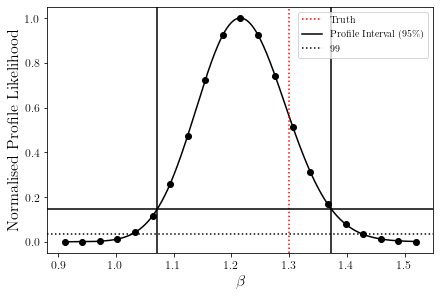

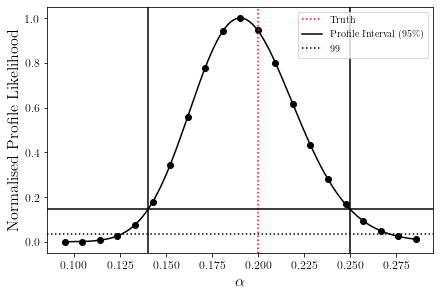

In [41]:
for bnds, pn, mv, pv, (i, profile) in zip(explicit_bounds, ['beta', 'alpha',], mean_vals, p_true, enumerate(profiles)):
#     plt.figure()
#     plt.plot(np.concatenate(profile['ps']), [x['f'] for x in profile['pf']['s']])
#     plt.title(f"Weighted obj fn values {i}")

#     plt.figure()
#     plt.semilogy(np.concatenate(profile['ps']), profile['pf']['w'])
#     plt.title(f"Weights {i}")

#     plt.figure()
#     cNorm = colors.Normalize(vmin=profile['ps'][0][-1], vmax=profile['ps'][-1][-1])
#     cm = plt.get_cmap('viridis')
#     scalarMap = mplcm.ScalarMappable(norm=cNorm, cmap=cm)
#     for n, s in zip(np.concatenate(profile['ps']), profile['pf']['s']):
#         cl = scalarMap.to_rgba(n)
#         x = solver.get_state(s, model)
#         S = x[:,0]; I = x[:,1]; R = x[:,2]
#         plt.plot(model.observation_times, S, '-', color=cl, alpha=0.7)
#         plt.plot(model.observation_times, I, '--', color=cl, alpha=0.7)
#         plt.plot(model.observation_times, R, '-.', color=cl, alpha=0.7)
#     plt.title(f'State plots {i}')

    bnd_lims = (bnds[0][-1], bnds[-1][-1])
    search0s = [(3*bnd_lims[0]+bnd_lims[1])/4, (bnd_lims[0]+3*bnd_lims[1])/4]

    ll_list = [np.squeeze(full_ll(s['s']['x'], p(cor_ws, y_noisy))) for s in profile.values()]
    normd_ll = [np.exp(-0.5*(lli - min(ll_list))) for lli in ll_list]

    x = list(zip(profile.keys(), normd_ll))
    xx = np.unique(x, axis=0)

    dspl = interpolate.interp1d(*xx.T, kind='cubic', bounds_error=False, fill_value=0.0)
    d_pint = [float(optimize.fsolve(lambda x: dspl(x) - ninefive, (mv+x0)/2)) for x0 in search0s]

    xsx = np.linspace(*bnd_lims, 1001)
    
    plt.figure()
    plt.plot(xsx, dspl(xsx), 'k')
    plt.plot(list(profile.keys()), normd_ll, 'ko')
    plt.axvline(pv, color='r', label='Truth', linestyle='dotted')
    plt.axhline(ninefive, color='k',  label=r'Profile Interval (95\%)')
    plt.axhline(ninenine, color='k', linestyle='dotted', label='99')
    for d in d_pint:
        plt.axvline(d, color='k', )
    plt.legend()
    plt.ylabel("Normalised Profile Likelihood", fontproperties=label_font)
    plt.xlabel(f"$\\{pn}$", fontproperties=label_font)
    plt.xticks(fontproperties=tick_font)
    plt.yticks(fontproperties=tick_font)
#     plt.savefig(f"/home/dwu402/REPOS/writing/smb2021/sir_{pn}_profile.pdf", dpi=360)
    print(d_pint)

In [96]:
r0solver = pypei.irls_fitter.Solver(objective=objective)
r0_solver_config = dict(solver_config)
# r0_solver_config['g'] = ca.vcat([solver_config['g'], model.xs[0,7] - model.xs[0,2] - model.xs[0,1]])
r0solver.make(r0_solver_config)

R0eff_repr = model.ps[0] / model.ps[1]

R0_profile_config = {
    'g+': R0eff_repr,
    'pidx': ca.Function('pidx_r0', [solver.decision_vars], [R0eff_repr])
}
r0solver.profilers.append(pypei.fitter.Profiler(r0solver, R0_profile_config))

In [97]:
xvar = 0.5
r0mle = float(R0_profile_config['pidx'](cor_sol['x']))
r0pbounds = [r0solver.profilers[0].symmetric_bound_sets(cor_sol, variance=xvar)]
# r0pbounds = [[np.linspace(r0mle, 0, num=11), np.linspace(r0mle, 30, num=21)]]

In [98]:
r0profile = r0solver.profile(cor_sol, p=p, w0=cor_ws, y=y_noisy, nit=1, weight_args=weight_args, pbounds=r0pbounds)

Iteration: 0
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        2
Number of nonzeros in inequality constraint Jacobian.:     2268
Number of nonzeros in Lagrangian Hessian.............:     1587

Total number of variables............................:      128
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        1
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_

[5.140848910138451, 8.16967290136997]


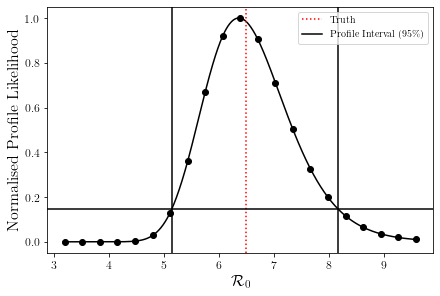

In [99]:
for bnds, pn, mv, pv, (i, profile) in zip(r0pbounds, ['mathcal{R}_0'], [mean_vals[0]/mean_vals[1]], [6.5], enumerate(r0profile)):
#     plt.figure()
#     plt.plot(np.concatenate(profile['ps']), [x['f'] for x in profile['pf']['s']])
#     plt.title(f"Weighted obj fn values {i}")

#     plt.figure()
#     plt.semilogy(np.concatenate(profile['ps']), profile['pf']['w'])
#     plt.title(f"Weights {i}")

#     plt.figure()
#     cNorm = colors.Normalize(vmin=profile['ps'][0][-1], vmax=profile['ps'][-1][-1])
#     cm = plt.get_cmap('viridis')
#     scalarMap = mplcm.ScalarMappable(norm=cNorm, cmap=cm)
#     for n, s in zip(np.concatenate(profile['ps']), profile['pf']['s']):
#         cl = scalarMap.to_rgba(n)
#         x = solver.get_state(s, model)
#         S = x[:,0]; I = x[:,1]; R = x[:,2]
#         plt.plot(model.observation_times, S, '-', color=cl, alpha=0.7)
#         plt.plot(model.observation_times, I, '--', color=cl, alpha=0.7)
#         plt.plot(model.observation_times, R, '-.', color=cl, alpha=0.7)
#     plt.title(f'State plots {i}')

    bnd_lims = (bnds[0][-1], bnds[-1][-1])
    search0s = [(bnd_lims[0]+bnd_lims[1])/4, (bnd_lims[0]+3*bnd_lims[1])/4]

    ll_list = [np.squeeze(full_ll(s['s']['x'], p(cor_ws, y_noisy))) for s in profile.values()]
    normd_ll = [np.exp(-0.5*(lli - min(ll_list))) for lli in ll_list]

    x = list(zip(profile.keys(), normd_ll))
    xx = np.unique(x, axis=0)

    dspl = interpolate.interp1d(*xx.T, kind='cubic', bounds_error=False, fill_value=0.0)
    d_pint = [float(optimize.fsolve(lambda x: dspl(x) - ninefive, (mv+x0)/2)) for x0 in search0s]

    xsx = np.linspace(*bnd_lims, 1001)
    
    plt.figure()
    plt.plot(xsx, dspl(xsx), 'k')
    plt.plot(list(profile.keys()), normd_ll, 'ko')
    plt.axvline(pv, color='r', label='Truth', linestyle='dotted')
    plt.axhline(ninefive, color='k',  label=r'Profile Interval (95\%)')
    for d in d_pint:
        plt.axvline(d, color='k', )
    plt.legend()
    plt.ylabel("Normalised Profile Likelihood", fontproperties=label_font)
    plt.xlabel(f"$\\{pn}$", fontproperties=label_font)
    plt.xticks(fontproperties=tick_font)
    plt.yticks(fontproperties=tick_font)
#     plt.savefig(f"/home/dwu402/REPOS/writing/smb2021/sir_{pn}_profile.pdf", dpi=360)
    print(d_pint)

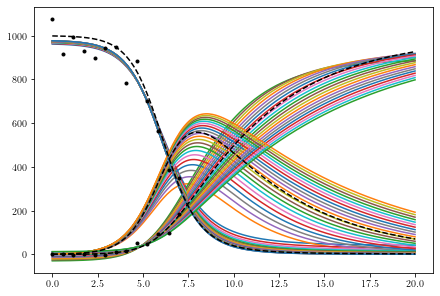

In [100]:
r0profiles_out = r0profile[0]
plt.figure()
for k,v in r0profiles_out.items():
    r0_state = r0solver.get_state(v['s'], model)
    plt.plot(model.observation_times, r0_state)
plt.plot(ts, y_noisy.T, 'k.')
plt.plot(model.observation_times, sol_true.sol(model.observation_times).T, 'k--')

In [44]:
if do_state_uq:
    pypei.fitter.reconfig_rto(model, objective, solver, objective_config, index=1)
    
    def rto_p(w, ys_noisy):
        return [*w, *[i for l in ys_noisy for i in l],]# 0.2]
    
    rys = solver._generate_gaussian_samples(cor_sol, [y_noisy.flatten(), 0], cor_ws, objective, 200)
    
    rss = solver._fit_samples(rys, cor_sol['x'], rto_p, cor_ws, weight_args=weight_args, nit=2, lbg=0)
#     rss, rys = solver.gaussian_resample(cor_sol, rto_p, [y_noisy.flatten(), 0], cor_ws, objective, 200,
#                                weight_args=weight_args, nit=1, lbg=0)

Fitting Sample 0
Iteration: 0
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     2268
Number of nonzeros in Lagrangian Hessian.............:     1587

Total number of variables............................:      128
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:      600
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4688198292586754
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 150  9.7609023e+02 0.00e+00 3.05e+03  -5.7 2.59e+03    -  1.00e+00 5.00e-01f  2 
 200  9.6660001e+02 0.00e+00 2.46e+03  -5.7 5.83e+02    -  1.00e+00 1.00e+00f  1 
 250  7.4440897e+02 0.00e+00 6.14e+01  -5.7 2.41e+01  -6.3 1.00e+00 1.00e+00f  1 

Number of Iterations....: 298

                                   (scaled)                 (unscaled)
Objective...............:   1.4267763904237517e+01    5.7531820203916186e+02
Dual infeasibility......:   8.8984087129892595e-12    3.5881000948201342e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035596807653e-09    1.0104540137581697e-07
Overall NLP error.......:   2.5059035596807653e-09    1.0104540137581697e-07


Number of objective function evaluations             = 516
Number of objective gradient evaluations             = 299
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 516
Number of equality constraint 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4918136878076957
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


Fitting Sample 2
Iteration: 0
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     2268
Number of nonzeros in Lagrangian Hessian.............:     1587

Total number of variables............................:      128
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:      600
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4283991851278273
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 100  1.0354568e+03 0.00e+00 1.33e+05  -1.0 2.96e+03    -  1.00e+00 1.00e+00f  1 
 150  9.6870761e+02 0.00e+00 4.60e+03  -3.8 2.22e+03    -  1.00e+00 1.00e+00f  1 
 200  9.6672600e+02 0.00e+00 7.06e+03  -3.8 7.58e+02    -  1.00e+00 1.00e+00f  1 
 250  9.4051778e+02 0.00e+00 1.75e+03  -3.8 1.24e+02    -  1.00e+00 1.00e+00f  1 
 300  6.5482256e+02 0.00e+00 3.65e+02  -3.8 5.21e+01  -6.3 1.00e+00 5.00e-01f  2 

Number of Iterations....: 334

                                   (scaled)                 (unscaled)
Objective...............:   6.4619414743692658e+01    6.0015248194799779e+02
Dual infeasibility......:   3.6858444613268032e-11    3.4232261469924197e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035866125340e-09    2.3273566667124540e-08
Overall NLP error.......:   2.5059035866125340e-09    2.3273566667124540e-08


Number of objective function evaluations             = 576
Number of objective gradient evaluations 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4695534821751319
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 250  9.0078734e+02 0.00e+00 2.43e+02  -5.7 5.56e+01    -  1.00e+00 1.00e+00f  1 
 300  6.7014690e+02 0.00e+00 1.53e-08  -5.7 1.54e-04    -  1.00e+00 1.00e+00h  1 

Number of Iterations....: 302

                                   (scaled)                 (unscaled)
Objective...............:   2.1796102735726802e+01    6.7014684056815190e+02
Dual infeasibility......:   1.7093716931030173e-09    5.2556645258050594e-08
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059173278941978e-09    7.7047378624281569e-08
Overall NLP error.......:   2.5059173278941978e-09    7.7047378624281569e-08


Number of objective function evaluations             = 539
Number of objective gradient evaluations             = 303
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 539
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.3765647631472671
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  6.9318146e+02 0.00e+00 1.00e+02  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0 y
  50  1.2212162e+03 0.00e+00 1.40e+02  -1.0 4.91e+01  -6.4 1.00e+00 1.00e+00f  1 
 100  9.6231458e+02 0.00e+00 3.30e+01  -2.5 3.95e+01  -7.2 1.00e+00 1.00e+00f  1 
 150  9.5960039e+02 0.00e+00 2.97e+03  -5.7 1.24e+03    -  1.00e+00 1.00e+00f  1 
 200  9.4195001e+02 0.00e+00 1.30e+03  -5.7 3.40e+02    -  1.00e+00 1.00e+00f  1 
 250  6.7589484e+02 0.00e+00 6.16e+01  -5.7 1.50e+01  -6.1 1.28e-01 1.00e+00f  1 

Number of Iterations....: 289

                                   (scaled)                 (unscaled)
Objective...............:   1.6962148523246245e+01    5.6617247933057104e+02
Dual infeasibility......:   1.2015369416131540e-09    4.0105600319917389e-08
Constraint violation....:   0.0000000000

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.529946396156678
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 200  9.8478746e+02 0.00e+00 4.20e+03  -3.8 7.19e+02    -  1.00e+00 1.00e+00f  1 
 250  9.2966350e+02 0.00e+00 3.52e+02  -3.8 1.02e+02    -  7.67e-01 1.00e+00f  1 
 300  5.9688468e+02 0.00e+00 1.27e+02  -3.8 1.06e+01    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 321

                                   (scaled)                 (unscaled)
Objective...............:   2.5546720139804862e+01    5.9049436966171220e+02
Dual infeasibility......:   2.2729990242721067e-11    5.2538765005216703e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035757804913e-09    5.7922189005701245e-08
Overall NLP error.......:   2.5059035757804913e-09    5.7922189005701245e-08


Number of objective function evaluations             = 597
Number of objective gradient evaluations             = 322
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 597
Number of equality constraint 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.49858976259007026
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)



Number of Iterations....: 284

                                   (scaled)                 (unscaled)
Objective...............:   1.3700623734008898e+01    5.7124716306975620e+02
Dual infeasibility......:   2.4055521222902080e-12    1.0029943542377849e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035596801329e-09    1.0448358608961049e-07
Overall NLP error.......:   2.5059035596801329e-09    1.0448358608961049e-07


Number of objective function evaluations             = 552
Number of objective gradient evaluations             = 285
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 552
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 285
Number of Lagrangian Hessian evaluations             = 284
Total CPU secs in IPOPT (w/o function evaluations)   =      0.396
Total CPU secs in NLP function eval

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5180645980474657
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 300  6.1873260e+02 0.00e+00 2.78e-02  -3.8 1.97e-01    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 308

                                   (scaled)                 (unscaled)
Objective...............:   2.4819781143031701e+01    6.1868894873701174e+02
Dual infeasibility......:   2.0994992482367580e-12    5.2334747646654029e-11
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035596804828e-09    6.2465290489087587e-08
Overall NLP error.......:   2.5059035596804828e-09    6.2465290489087587e-08


Number of objective function evaluations             = 547
Number of objective gradient evaluations             = 309
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 547
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 309
Number of Lagrangian Hessian evaluations             = 308
Total CPU secs in I

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5069164819236688
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 250  9.1468661e+02 0.00e+00 3.63e+02  -3.8 9.37e+01    -  1.00e+00 1.00e+00f  1 
 300  6.1262554e+02 0.00e+00 9.63e+01  -3.8 1.20e+01    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 329

                                   (scaled)                 (unscaled)
Objective...............:   1.7887508493291499e+01    5.9213792182328336e+02
Dual infeasibility......:   3.6300375404798012e-10    1.2016670103420781e-08
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059076032126766e-09    8.2954142048570777e-08
Overall NLP error.......:   2.5059076032126766e-09    8.2954142048570777e-08


Number of objective function evaluations             = 569
Number of objective gradient evaluations             = 330
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 569
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4990388932292972
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 150  1.0230057e+03 0.00e+00 2.82e+03  -3.8 1.08e+03    -  1.00e+00 1.00e+00f  1 
 200  1.0167427e+03 0.00e+00 1.95e+03  -3.8 1.49e+03    -  1.00e+00 2.50e-01f  3 
 250  8.9405401e+02 0.00e+00 2.25e+02  -3.8 1.35e+02    -  2.95e-01 2.50e-01f  3 
 300  6.0313189e+02 0.00e+00 2.00e+00  -3.8 1.59e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 310

                                   (scaled)                 (unscaled)
Objective...............:   2.3571023021420373e+01    6.0308986709535213e+02
Dual infeasibility......:   2.1477637914695296e-11    5.4952836725519205e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059036047590543e-09    6.4116227393885626e-08
Overall NLP error.......:   2.5059036047590543e-09    6.4116227393885626e-08


Number of objective function evaluations             = 567
Number of objective gradient evaluations             = 311
Number of equality constraint evaluations            = 0
Number 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.47529245562927885
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 200  8.9300348e+02 0.00e+00 1.59e+03  -3.8 2.28e+03    -  1.00e+00 2.50e-01f  3 
 250  8.5179898e+02 0.00e+00 1.81e+02  -3.8 5.83e+01    -  1.00e+00 1.00e+00f  1 
 300  5.5852754e+02 0.00e+00 2.82e+01  -3.8 1.42e+01    -  1.00e+00 5.00e-01f  2 

Number of Iterations....: 327

                                   (scaled)                 (unscaled)
Objective...............:   1.3853282820085923e+01    5.4545355434215276e+02
Dual infeasibility......:   6.1423653570280999e-11    2.4184700908591594e-09
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059043991697431e-09    9.8666466217448910e-08
Overall NLP error.......:   2.5059043991697431e-09    9.8666466217448910e-08


Number of objective function evaluations             = 573
Number of objective gradient evaluations             = 328
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 573
Number of equality constraint 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5464083225360042
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 150  9.5408757e+02 0.00e+00 6.93e+02  -3.8 6.78e+02    -  1.00e+00 1.00e+00f  1 
 200  9.4833733e+02 0.00e+00 6.75e+02  -3.8 3.24e+02    -  1.00e+00 1.00e+00f  1 
 250  8.3832863e+02 0.00e+00 1.02e+02  -3.8 3.51e+01    -  7.35e-01 1.00e+00f  1 
 300  6.1473000e+02 0.00e+00 2.11e+01  -3.8 1.50e+01    -  1.00e+00 5.00e-01f  2 

Number of Iterations....: 312

                                   (scaled)                 (unscaled)
Objective...............:   1.3526820137398007e+01    6.1456572440525326e+02
Dual infeasibility......:   1.4959952451176596e-09    6.7967740546848177e-08
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059172233975790e-09    1.1385165309022696e-07
Overall NLP error.......:   2.5059172233975790e-09    1.1385165309022696e-07


Number of objective function evaluations             = 568
Number of objective gradient evaluations             = 313
Number of equality constraint evaluations            = 0
Number 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4403796064448871
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 250  8.5983431e+02 0.00e+00 1.87e+02  -3.8 3.35e+01    -  1.38e-01 1.00e+00f  1 

Number of Iterations....: 298

                                   (scaled)                 (unscaled)
Objective...............:   2.6595901314988065e+01    6.7599150394612400e+02
Dual infeasibility......:   7.7828910940149569e-12    1.9781876137159315e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059042537200991e-09    6.3692896328450651e-08
Overall NLP error.......:   2.5059042537200991e-09    6.3692896328450651e-08


Number of objective function evaluations             = 546
Number of objective gradient evaluations             = 299
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 546
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 299
Number of Lagrangian Hessian evaluations             = 298
Total CPU secs in I

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4038023589742898
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 200  1.0094096e+03 0.00e+00 1.13e+03  -5.7 7.82e+02    -  1.00e+00 1.00e+00f  1 
 250  9.0982661e+02 0.00e+00 2.90e+01  -5.7 4.01e+01    -  1.00e+00 1.00e+00f  1 
 300  6.0200610e+02 0.00e+00 8.22e+00  -5.7 5.95e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 315

                                   (scaled)                 (unscaled)
Objective...............:   6.0220648519985414e+00    6.0032119723726180e+02
Dual infeasibility......:   5.8364789052677470e-11    5.8182070272749797e-09
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5060144573485384e-09    2.4981690438456375e-07
Overall NLP error.......:   2.5060144573485384e-09    2.4981690438456375e-07


Number of objective function evaluations             = 582
Number of objective gradient evaluations             = 316
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 582
Number of equality constraint 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4771976952247717
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 200  9.8163851e+02 0.00e+00 8.40e+02  -3.8 1.87e+02    -  1.00e+00 1.00e+00f  1 
 250  8.4555014e+02 0.00e+00 2.17e+02  -3.8 2.47e+02    -  1.00e+00 1.25e-01f  4 
 300  6.1166647e+02 0.00e+00 1.83e-03  -3.8 4.37e-02    -  1.00e+00 1.00e+00h  1 

Number of Iterations....: 307

                                   (scaled)                 (unscaled)
Objective...............:   3.4327179249015906e+01    6.1166026637482878e+02
Dual infeasibility......:   7.2731631834391842e-10    1.2959715967042484e-08
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059094308174999e-09    4.4651651067687686e-08
Overall NLP error.......:   2.5059094308174999e-09    4.4651651067687686e-08


Number of objective function evaluations             = 525
Number of objective gradient evaluations             = 308
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 525
Number of equality constraint 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4471462485816071
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 300  5.6850401e+02 0.00e+00 7.65e-02  -3.8 2.81e-01    -  1.00e+00 1.00e+00h  1 

Number of Iterations....: 307

                                   (scaled)                 (unscaled)
Objective...............:   3.4603574675888154e+01    5.6849633206683507e+02
Dual infeasibility......:   5.4970373055444370e-10    9.0309905109720034e-09
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059080891573197e-09    4.1169144243794322e-08
Overall NLP error.......:   2.5059080891573197e-09    4.1169144243794322e-08


Number of objective function evaluations             = 562
Number of objective gradient evaluations             = 308
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 562
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 308
Number of Lagrangian Hessian evaluations             = 307
Total CPU secs in I

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5264640926349504
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 150  1.0511619e+03 0.00e+00 5.92e+03  -5.7 7.05e+03    -  1.00e+00 2.50e-01f  3 
 200  1.0453548e+03 0.00e+00 4.45e+03  -5.7 7.63e+02    -  1.00e+00 1.00e+00f  1 
 250  9.1153867e+02 0.00e+00 2.45e+02  -5.7 5.69e+01    -  1.00e+00 1.00e+00f  1 
 300  6.1880649e+02 0.00e+00 1.14e+01  -5.7 8.07e+00    -  1.00e+00 5.00e-01f  2 

Number of Iterations....: 309

                                   (scaled)                 (unscaled)
Objective...............:   2.0918384295263351e+01    6.1877657539944119e+02
Dual infeasibility......:   1.7580711832758219e-11    5.2004650585857348e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035596817434e-09    7.4125917234068927e-08
Overall NLP error.......:   2.5059035596817434e-09    7.4125917234068927e-08


Number of objective function evaluations             = 533
Number of objective gradient evaluations             = 310
Number of equality constraint evaluations            = 0
Number 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4514264075045719
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 
 250  7.5586616e+02 0.00e+00 4.49e+01  -3.8 4.90e+02    -  1.00e+00 3.95e-02f  1 

Number of Iterations....: 292

                                   (scaled)                 (unscaled)
Objective...............:   2.0450016452488807e+01    6.0557235182949773e+02
Dual infeasibility......:   3.1531605240398414e-12    9.3372386211765233e-11
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035607271852e-09    7.4205608403938012e-08
Overall NLP error.......:   2.5059035607271852e-09    7.4205608403938012e-08


Number of objective function evaluations             = 531
Number of objective gradient evaluations             = 293
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 531
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 293
Number of Lagrangian Hessian evaluations             = 292
Total CPU secs in

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4456075418737309
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


Fitting Sample 19
Iteration: 0
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     2268
Number of nonzeros in Lagrangian Hessian.............:     1587

Total number of variables............................:      128
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:      600
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(r

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.402203055637643
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 150  9.5336132e+02 0.00e+00 2.05e+03  -5.7 4.06e+03    -  1.00e+00 5.00e-01f  2 
 200  9.4781713e+02 0.00e+00 1.22e+03  -5.7 1.51e+03    -  1.00e+00 5.00e-01f  2 
 250  8.1606537e+02 0.00e+00 2.05e+01  -5.7 2.10e+01    -  1.00e+00 1.00e+00f  1 
 300  5.5362736e+02 0.00e+00 1.90e-01  -5.7 1.01e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 307

                                   (scaled)                 (unscaled)
Objective...............:   5.2617828240989786e+00    5.5362295940635340e+02
Dual infeasibility......:   3.8402893867452884e-10    4.0405931722026223e-08
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059055997505702e-09    2.6366099105666297e-07
Overall NLP error.......:   2.5059055997505702e-09    2.6366099105666297e-07


Number of objective function evaluations             = 589
Number of objective gradient evaluations             = 308
Number of equality constraint evaluations            = 0
Number 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5657706872169379
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


Fitting Sample 21
Iteration: 0
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     2268
Number of nonzeros in Lagrangian Hessian.............:     1587

Total number of variables............................:      128
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:      600
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(r

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.42994744792142564
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 100  1.1438177e+03 0.00e+00 3.31e+05  -2.5 2.64e+02    -  9.85e-01 1.00e+00f  1 
 150  9.7609982e+02 0.00e+00 2.41e+03  -5.7 1.07e+03    -  1.00e+00 1.00e+00f  1 
 200  9.6609396e+02 0.00e+00 1.99e+03  -5.7 4.26e+02    -  1.00e+00 1.00e+00f  1 
 250  7.7248011e+02 0.00e+00 1.58e+02  -5.7 5.26e+01    -  1.00e+00 5.00e-01f  2 

Number of Iterations....: 296

                                   (scaled)                 (unscaled)
Objective...............:   2.0884251511008188e+01    6.3873474894429273e+02
Dual infeasibility......:   7.7460232730032183e-12    2.3690838180101537e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035619232635e-09    7.6641850518797705e-08
Overall NLP error.......:   2.5059035619232635e-09    7.6641850518797705e-08


Number of objective function evaluations             = 548
Number of objective gradient evaluations             = 297
Number of equality constraint evaluations            = 0
Number 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.41412971744246946
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


  50  9.8728078e+02 0.00e+00 2.06e+03  -1.0 6.53e+01    -  1.00e+00 1.00e+00f  1 
 100  1.0710609e+03 0.00e+00 4.06e+04  -1.0 5.73e+02    -  2.18e-01 1.00e+00f  1 
 150  1.0242196e+03 0.00e+00 1.69e+04  -3.8 2.34e+03    -  1.00e+00 1.00e+00f  1 
 200  1.0205391e+03 0.00e+00 1.35e+04  -3.8 8.13e+03    -  1.00e+00 1.25e-01f  4 
 250  9.4573505e+02 0.00e+00 4.95e+02  -3.8 2.10e+02    -  1.00e+00 2.50e-01f  3 
 300  6.4723701e+02 0.00e+00 2.85e+01  -3.8 6.93e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 321

                                   (scaled)                 (unscaled)
Objective...............:   6.0984288922719330e+01    6.4350302252227243e+02
Dual infeasibility......:   3.2788756429384475e-10    3.4598524045748032e-09
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059160559021379e-09    2.6442294968850023e-08
Overall NLP error.......:   2.5059160559021379e-09    2.6442294968850023e-08


Number of objectiv

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4183081323738436
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 100  2.5254110e+03 0.00e+00 8.00e+01  -1.0 2.86e+02    -  1.00e+00 1.00e+00f  1 
 150  1.0331986e+03 0.00e+00 6.52e+02  -5.7 9.74e+03    -  1.00e+00 1.25e-01f  4 
 200  1.0307801e+03 0.00e+00 4.33e+02  -5.7 5.99e+02    -  1.00e+00 1.00e+00f  1 
 250  9.9877235e+02 0.00e+00 8.20e+01  -5.7 8.46e+01    -  1.00e+00 1.00e+00f  1 
 300  6.3834344e+02 0.00e+00 1.34e+01  -5.7 4.12e+01    -  6.06e-02 2.50e-01f  3 

Number of Iterations....: 333

                                   (scaled)                 (unscaled)
Objective...............:   4.7995900623722765e+00    5.8679538265516419e+02
Dual infeasibility......:   7.6291271406933318e-11    9.3273311296826478e-09
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5073148321848250e-09    3.0654300622950669e-07
Overall NLP error.......:   2.5073148321848250e-09    3.0654300622950669e-07


Number of objective function evaluations             = 635
Number of objective gradient evaluations 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5205504561997598
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 150  9.3712380e+02 0.00e+00 5.56e+02  -5.7 1.08e+03    -  1.00e+00 1.00e+00f  1 
 200  9.2953448e+02 0.00e+00 3.13e+02  -5.7 3.23e+02    -  1.00e+00 1.00e+00f  1 
 250  7.6481354e+02 0.00e+00 6.41e+01  -5.7 6.79e+01    -  1.00e+00 5.00e-01f  2 
 300  5.4899310e+02 0.00e+00 9.94e-04  -5.7 8.02e-02    -  1.00e+00 1.00e+00h  1 

Number of Iterations....: 304

                                   (scaled)                 (unscaled)
Objective...............:   5.3142174001977773e+00    5.4899281558512814e+02
Dual infeasibility......:   2.9970878765022279e-12    3.0961844199595134e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059040317121540e-09    2.5887599365140383e-07
Overall NLP error.......:   2.5059040317121540e-09    2.5887599365140383e-07


Number of objective function evaluations             = 575
Number of objective gradient evaluations             = 305
Number of equality constraint evaluations            = 0
Number 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5073816266469765
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 150  8.9670469e+02 0.00e+00 7.03e+00  -3.8 6.89e+01    -  1.00e+00 1.00e+00f  1 
 200  8.9094338e+02 0.00e+00 1.16e+03  -5.7 1.36e+03    -  1.00e+00 5.00e-01f  2 
 250  7.5297591e+02 0.00e+00 2.94e+01  -5.7 2.49e+01    -  1.00e+00 1.00e+00f  1 
 300  5.2997322e+02 0.00e+00 1.79e-01  -5.7 9.31e-01    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 306

                                   (scaled)                 (unscaled)
Objective...............:   6.3234232404766404e+00    5.2997267565034008e+02
Dual infeasibility......:   3.6674281032977538e-12    3.0737096201605141e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035597057854e-09    2.1002238249022877e-07
Overall NLP error.......:   2.5059035597057854e-09    2.1002238249022877e-07


Number of objective function evaluations             = 576
Number of objective gradient evaluations             = 307
Number of equality constraint evaluations            = 0
Number 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5989650009713307
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 100  1.1262896e+03 0.00e+00 4.56e+04  -1.0 5.63e+03    -  1.00e+00 1.00e+00f  1 
 150  9.5852414e+02 0.00e+00 5.21e+03  -3.8 1.46e+03    -  1.00e+00 1.00e+00f  1 
 200  9.5054814e+02 0.00e+00 5.22e+03  -3.8 6.90e+02    -  1.00e+00 1.00e+00f  1 
 250  7.5557512e+02 0.00e+00 8.99e+01  -3.8 1.93e+01    -  1.00e+00 1.00e+00f  1 
 300  5.6936899e+02 0.00e+00 3.55e-09  -5.7 1.26e-04    -  1.00e+00 1.00e+00h  1 

Number of Iterations....: 303

                                   (scaled)                 (unscaled)
Objective...............:   2.4667647513143368e+01    5.6936894886501375e+02
Dual infeasibility......:   1.7056580933235149e-11    3.9369330018246268e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035596801383e-09    5.7840281484967729e-08
Overall NLP error.......:   2.5059035596801383e-09    5.7840281484967729e-08


Number of objective function evaluations             = 563
Number of objective gradient evaluations 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5243132503676713
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)



This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     2268
Number of nonzeros in Lagrangian Hessian.............:     1587

Total number of variables............................:      128
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:      600
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.42706397221367304
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 100  2.4978504e+02 0.00e+00 2.06e+03  -1.0 1.55e+02  -7.0 1.00e+00 5.00e-01f  2 
 150  2.4950430e+02 0.00e+00 6.90e+03  -1.0 9.15e+01  -7.2 9.99e-01 1.00e+00f  1 
 200  2.5039315e+02 0.00e+00 2.49e+04  -1.0 1.24e+03    -  1.00e+00 1.00e+00f  1 
 250  2.4549872e+02 0.00e+00 1.37e+04  -3.8 9.78e+02    -  1.00e+00 1.00e+00f  1 
 300  2.4540161e+02 0.00e+00 1.13e+04  -3.8 6.18e+02    -  1.00e+00 1.00e+00f  1 
 350  2.4505311e+02 0.00e+00 2.60e+03  -3.8 1.73e+02    -  1.00e+00 1.00e+00f  1 
 400  2.4276128e+02 0.00e+00 5.67e+03  -3.8 1.14e+02    -  1.00e+00 1.00e+00f  1 
 450  2.2925688e+02 0.00e+00 1.24e+03  -3.8 2.33e+01    -  1.00e+00 1.00e+00f  1 
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 500  2.1379103e+02 0.00e+00 1.05e+02  -3.8 5.82e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 538

                                   (scaled)                 (unscaled)
Objective...............:   2.1297436553746013e+02    2.1297436553746013e+02
D

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.3677584440415147
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  6.5730980e+02 0.00e+00 1.00e+02  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0 y
  50  1.0787139e+03 0.00e+00 1.57e+04  -1.0 6.25e+02    -  1.00e+00 5.00e-01f  2 
 100  1.0521673e+03 0.00e+00 1.16e+05  -1.0 6.13e+03    -  1.00e+00 1.00e+00f  1 
 150  9.3423372e+02 0.00e+00 2.00e+03  -3.8 7.42e+02    -  1.00e+00 1.00e+00f  1 
 200  9.2747842e+02 0.00e+00 2.97e+03  -3.8 4.41e+02    -  1.00e+00 1.00e+00f  1 
 250  7.8203232e+02 0.00e+00 4.55e+02  -3.8 2.02e+02    -  1.00e+00 2.50e-01f  3 
 300  5.6248698e+02 0.00e+00 8.76e-01  -5.7 8.94e-01    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 304

                                   (scaled)                 (unscaled)
Objective...............:   3.0510627742545591e+01    5.6248690501024089e+02
Dual infeasibility......:   4.4291548942959207e-11    8.1654879385828504e-10
Constraint violation..

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5406837557221043
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 200  9.8251204e+02 0.00e+00 5.25e+03  -3.8 6.36e+02    -  1.00e+00 1.00e+00f  1 
 250  8.2817680e+02 0.00e+00 2.18e+02  -3.8 2.95e+02    -  1.00e+00 1.25e-01f  4 
 300  6.0296059e+02 0.00e+00 1.29e+00  -5.7 1.11e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 304

                                   (scaled)                 (unscaled)
Objective...............:   2.8446457184174704e+01    6.0296038853067932e+02
Dual infeasibility......:   3.4470142849087692e-11    7.3064039540771120e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059045358901016e-09    5.3115970217256554e-08
Overall NLP error.......:   2.5059045358901016e-09    5.3115970217256554e-08


Number of objective function evaluations             = 518
Number of objective gradient evaluations             = 305
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 518
Number of equality constraint 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.46052459067086804
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)



Iteration: 0
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     2268
Number of nonzeros in Lagrangian Hessian.............:     1587

Total number of variables............................:      128
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:      600
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.461810472442172
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 
 100  1.3842259e+03 0.00e+00 1.46e+05  -2.5 3.59e+02    -  9.52e-01 5.00e-01f  2 
 150  1.0289059e+03 0.00e+00 2.20e+03  -3.8 1.63e+03    -  1.00e+00 1.00e+00f  1 
 200  1.0237287e+03 0.00e+00 6.32e+02  -3.8 4.12e+02    -  1.00e+00 1.00e+00f  1 
 250  8.9704680e+02 0.00e+00 5.63e+01  -3.8 3.25e+01    -  1.00e+00 7.39e-01f  1 
 300  6.5473665e+02 0.00e+00 1.25e-01  -3.8 6.58e-01    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 310

                                   (scaled)                 (unscaled)
Objective...............:   1.1289875006749938e+01    6.5455676046348390e+02
Dual infeasibility......:   2.8798345968569456e-12    1.6696510840574774e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059036090657507e-09    1.4528558973444449e-07
Overall NLP error.......:   2.5059036090657507e-09    1.4528558973444449e-07


Number of objective function evaluations             = 575
Number of objective gradient evaluation

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4276641029648813
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 150  9.5264046e+02 0.00e+00 6.21e+03  -3.8 1.34e+03    -  1.00e+00 1.00e+00f  1 
 200  9.5003642e+02 0.00e+00 1.33e+04  -3.8 2.10e+03    -  1.00e+00 5.00e-01f  2 
 250  9.0759361e+02 0.00e+00 5.37e+02  -3.8 5.03e+01    -  1.00e+00 9.71e-01f  1 
 300  5.7479145e+02 0.00e+00 1.00e+03  -3.8 4.14e+01    -  1.00e+00 7.13e-01f  1 

Number of Iterations....: 325

                                   (scaled)                 (unscaled)
Objective...............:   4.8689110819771066e+01    5.6197487871737371e+02
Dual infeasibility......:   8.0109733373951155e-11    9.2463503520434653e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   9.0910540047867914e-10    1.0492990908510442e-08
Overall NLP error.......:   9.0910540047867914e-10    1.0492990908510442e-08


Number of objective function evaluations             = 562
Number of objective gradient evaluations             = 326
Number of equality constraint evaluations            = 0
Number 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5233286142496784
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)



 150  9.8332829e+02 0.00e+00 1.02e+04  -3.8 7.20e+03    -  1.00e+00 2.50e-01f  3 
 200  9.7505130e+02 0.00e+00 4.48e+03  -3.8 9.71e+02    -  1.00e+00 5.00e-01f  2 
 250  7.7906090e+02 0.00e+00 5.97e+02  -3.8 4.77e+01    -  1.00e+00 1.00e+00f  1 
 300  5.7131167e+02 0.00e+00 3.91e-03  -8.6 6.04e-02    -  1.00e+00 1.00e+00h  1 

Number of Iterations....: 302

                                   (scaled)                 (unscaled)
Objective...............:   3.7506191712848178e+01    5.7131167457603215e+02
Dual infeasibility......:   2.7916147598882564e-11    4.2523168319874571e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059036683018679e-09    3.8171084711150054e-08
Overall NLP error.......:   2.5059036683018679e-09    3.8171084711150054e-08


Number of objective function evaluations             = 523
Number of objective gradient evaluations             = 303
Number of equality constraint evaluations            = 0
Number

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5050385767442795
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)



 300  6.4593196e+02 0.00e+00 6.72e+01  -3.8 2.72e+01    -  1.00e+00 5.00e-01f  2 

Number of Iterations....: 324

                                   (scaled)                 (unscaled)
Objective...............:   1.4095894237392800e+01    6.3718147227012798e+02
Dual infeasibility......:   1.6866087918432509e-12    7.6240347368639050e-11
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035597260203e-09    1.1327520572036523e-07
Overall NLP error.......:   2.5059035597260203e-09    1.1327520572036523e-07


Number of objective function evaluations             = 614
Number of objective gradient evaluations             = 325
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 614
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 325
Number of Lagrangian Hessian evaluations             = 324
Total CPU secs in 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4786203993668647
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)



 100  1.1970742e+03 0.00e+00 2.49e+04  -1.0 5.53e+03    -  1.00e+00 5.00e-01f  2 
 150  9.8863303e+02 0.00e+00 2.70e+03  -3.8 4.20e+03    -  1.00e+00 2.50e-01f  3 
 200  9.8282326e+02 0.00e+00 1.51e+03  -3.8 4.08e+02    -  1.00e+00 1.00e+00f  1 
 250  8.4947919e+02 0.00e+00 1.66e+02  -3.8 2.76e+02    -  1.00e+00 1.25e-01f  4 
 300  5.9371956e+02 0.00e+00 4.20e-01  -3.8 8.56e-01    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 307

                                   (scaled)                 (unscaled)
Objective...............:   2.0841267625907456e+01    5.9370414815601475e+02
Dual infeasibility......:   2.8930664813607690e-09    8.2414640112382642e-08
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059375635530679e-09    7.1386517999125453e-08
Overall NLP error.......:   2.8930664813607690e-09    8.2414640112382642e-08


Number of objective function evaluations             = 555
Number of objective gradient evaluations

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4869594450041025
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)



 200  1.0892495e+03 0.00e+00 6.41e+02  -3.8 8.60e+02    -  1.00e+00 1.00e+00f  1 
 250  1.0786203e+03 0.00e+00 2.37e+02  -3.8 2.31e+02    -  1.00e+00 1.00e+00f  1 
 300  8.2167335e+02 0.00e+00 2.39e+01  -3.8 1.64e+01    -  1.00e+00 1.00e+00f  1 
 350  5.9648023e+02 0.00e+00 5.18e-12  -8.6 7.66e-06    -  1.00e+00 1.00e+00h  1 

Number of Iterations....: 350

                                   (scaled)                 (unscaled)
Objective...............:   6.0725208646825859e+00    5.9648023416450428e+02
Dual infeasibility......:   5.1760993478040243e-12    5.0842821619490053e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5062428723610663e-09    2.4617854243588326e-07
Overall NLP error.......:   2.5062428723610663e-09    2.4617854243588326e-07


Number of objective function evaluations             = 662
Number of objective gradient evaluations             = 351
Number of equality constraint evaluations            = 0
Number

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4960457284553279
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  7.1945848e+02 0.00e+00 1.00e+02  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0 y
  50  1.6593503e+03 0.00e+00 3.61e+04  -1.0 2.08e+03    -  1.00e+00 9.65e-01f  1 
 100  9.7585029e+02 0.00e+00 7.62e+02  -2.5 1.08e+01  -8.2 1.00e+00 1.00e+00f  1 
 150  9.7276094e+02 0.00e+00 2.38e+03  -3.8 2.40e+03    -  1.00e+00 5.00e-01f  2 
 200  9.6232365e+02 0.00e+00 1.43e+03  -3.8 4.58e+02    -  1.00e+00 1.00e+00f  1 
 250  7.3953232e+02 0.00e+00 9.42e+01  -3.8 3.58e+01    -  1.00e+00 5.00e-01f  2 
 300  5.7577654e+02 0.00e+00 2.40e-10  -9.0 2.22e-05    -  1.00e+00 1.00e+00h  1 

Number of Iterations....: 300

                                   (scaled)                 (unscaled)
Objective...............:   1.3087687729302585e+01    5.7577653734916271e+02
Dual infeasibility......:   2.3978428391211577e-10    1.0549011220106763e-08
Constraint violation..

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5289512837398788
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


   0  6.9525152e+02 0.00e+00 1.00e+02  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0 y
  50  1.4163308e+03 0.00e+00 1.23e+04  -1.0 5.16e+03    -  9.71e-01 1.25e-01f  4 
 100  1.1822854e+03 0.00e+00 8.42e+04  -1.7 2.62e+02    -  1.00e+00 5.00e-01f  2 
 150  9.1747998e+02 0.00e+00 4.48e+03  -5.7 2.15e+03    -  1.00e+00 1.00e+00f  1 
 200  9.0653587e+02 0.00e+00 9.34e+02  -5.7 3.78e+02    -  1.00e+00 1.00e+00f  1 
 250  7.1037483e+02 0.00e+00 1.60e+02  -5.7 2.32e+01    -  6.72e-01 1.00e+00f  1 

Number of Iterations....: 294

                                   (scaled)                 (unscaled)
Objective...............:   1.1404410110274581e+01    5.7206543661454145e+02
Dual infeasibility......:   7.3268846045479081e-09    3.6752952584095944e-07
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059697526185028e-09    1.2570388707636736e-07
Overall NLP error.......:   7.3268846045479081e-09    3.6752952584095944e-07


Number of objecti

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4839815306263584
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


Objective...............:   7.1319302012812473e+00    6.1625192969919283e+02
Dual infeasibility......:   3.4392615991624899e-13    2.9717783789351415e-11
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035596883075e-09    2.1652874617597480e-07
Overall NLP error.......:   2.5059035596883075e-09    2.1652874617597480e-07


Number of objective function evaluations             = 593
Number of objective gradient evaluations             = 335
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 593
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 335
Number of Lagrangian Hessian evaluations             = 334
Total CPU secs in IPOPT (w/o function evaluations)   =      0.453
Total CPU secs in NLP function evaluations           =      0.243

EXIT: Optimal Solution Found.
      solver  :   t_proc      (avg)   t_w

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.48970387637207785
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)



 250  9.1826129e+02 0.00e+00 3.14e+02  -3.8 6.05e+01    -  1.00e+00 1.00e+00f  1 
 300  6.5134213e+02 0.00e+00 4.01e+00  -3.8 2.28e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 312

                                   (scaled)                 (unscaled)
Objective...............:   2.5558880863346765e+01    6.5122673816776899e+02
Dual infeasibility......:   1.8815728771730326e-10    4.7941479675017717e-09
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059078678504933e-09    6.3849204339361557e-08
Overall NLP error.......:   2.5059078678504933e-09    6.3849204339361557e-08


Number of objective function evaluations             = 581
Number of objective gradient evaluations             = 313
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 581
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations =

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4407081152656559
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


Complementarity.........:   2.5059136091632603e-09    1.4771857029261725e-07
Overall NLP error.......:   2.5059136091632603e-09    1.4771857029261725e-07


Number of objective function evaluations             = 589
Number of objective gradient evaluations             = 336
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 589
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 336
Number of Lagrangian Hessian evaluations             = 335
Total CPU secs in IPOPT (w/o function evaluations)   =      0.441
Total CPU secs in NLP function evaluations           =      0.236

EXIT: Optimal Solution Found.
      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |  21.67ms ( 36.78us)  21.78ms ( 36.97us)       589
       nlp_g  |   8.49ms ( 14.41us)   8.44ms ( 14.34us)       589
    nlp_grad  |  92.00us ( 92.00us)  92.11us ( 92.11us)         1
  nlp_gr

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4803393450391859
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 |  19.80ms ( 36.95us)  19.81ms ( 36.96us)       536
       nlp_g  |   7.68ms ( 14.32us)   7.64ms ( 14.25us)       536
    nlp_grad  |  94.00us ( 94.00us)  93.24us ( 93.24us)         1
  nlp_grad_f  |  23.28ms ( 76.08us)  23.26ms ( 76.02us)       306
  nlp_hess_l  | 159.31ms (524.06us) 158.90ms (522.69us)       304
   nlp_jac_g  |   5.89ms ( 19.25us)   5.92ms ( 19.35us)       306
       total  | 640.67ms (640.67ms) 637.46ms (637.46ms)         1
Iteration: 1
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     2268
Number of nonzeros in Lagrangian Hessian.............:     1587

Total number of variables............................:      128
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
          

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5117755047554112
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)



 300  6.3843842e+02 0.00e+00 3.40e+01  -3.8 5.68e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 321

                                   (scaled)                 (unscaled)
Objective...............:   3.5040945342590327e+01    6.3333031456788672e+02
Dual infeasibility......:   5.3158686628858301e-09    9.6079050937447619e-08
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059544095312074e-09    4.5292639195785453e-08
Overall NLP error.......:   5.3158686628858301e-09    9.6079050937447619e-08


Number of objective function evaluations             = 589
Number of objective gradient evaluations             = 322
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 589
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 322
Number of Lagrangian Hessian evaluations             = 321
Total CPU secs in 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4252070134692386
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 300  6.1809306e+02 0.00e+00 4.56e-08  -5.7 5.15e-04    -  1.00e+00 1.00e+00h  1 

Number of Iterations....: 303

                                   (scaled)                 (unscaled)
Objective...............:   9.3041165148253206e+00    6.1809290530432986e+02
Dual infeasibility......:   6.6573533989713848e-12    4.4226261541879803e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035602294818e-09    1.6647268007517890e-07
Overall NLP error.......:   2.5059035602294818e-09    1.6647268007517890e-07


Number of objective function evaluations             = 563
Number of objective gradient evaluations             = 304
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 563
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 304
Number of Lagrangian Hessian evaluations             = 303
Total CPU secs in I

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4172811791469953
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)
/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5280797785891646
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)



Number of Iterations....: 318

                                   (scaled)                 (unscaled)
Objective...............:   6.7005175643372148e+00    5.8315821692044631e+02
Dual infeasibility......:   5.1974638015049963e-12    4.5234471723887277e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035598527916e-09    2.1809333946323322e-07
Overall NLP error.......:   2.5059035598527916e-09    2.1809333946323322e-07


Number of objective function evaluations             = 575
Number of objective gradient evaluations             = 319
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 575
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 319
Number of Lagrangian Hessian evaluations             = 318
Total CPU secs in IPOPT (w/o function evaluations)   =      0.437
Total CPU secs in NLP function eval

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4978109283672289
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)
/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5795372326625181
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     2268
Number of nonzeros in Lagrangian Hessian.............:     1587

Total number of variables............................:      128
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:      600
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  6.6333285e+02 0.00e+00 1.00e+02  -1.0 0.00e+00    -  0.00e+00 0.

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5693046105962198
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)



 200  9.5589858e+02 0.00e+00 5.40e+02  -5.7 8.10e+02    -  1.00e+00 5.00e-01f  2 
 250  8.4862067e+02 0.00e+00 1.39e+01  -5.7 1.55e+01    -  1.00e+00 1.00e+00f  1 
 300  6.1799177e+02 0.00e+00 2.22e+00  -5.7 3.73e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 311

                                   (scaled)                 (unscaled)
Objective...............:   6.2392426807566137e+00    6.1784814416967163e+02
Dual infeasibility......:   1.2898473100926593e-12    1.2772860547016762e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035901155690e-09    2.4814996977057287e-07
Overall NLP error.......:   2.5059035901155690e-09    2.4814996977057287e-07


Number of objective function evaluations             = 582
Number of objective gradient evaluations             = 312
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 582
Number of equality constraint

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4759810464094288
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)



 200  1.0153322e+03 0.00e+00 4.19e+02  -5.7 4.86e+02    -  1.00e+00 1.00e+00f  1 
 250  9.0117740e+02 0.00e+00 7.81e+01  -5.7 5.28e+01    -  1.00e+00 1.00e+00f  1 
 300  5.9026837e+02 0.00e+00 1.61e+00  -5.7 3.04e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 311

                                   (scaled)                 (unscaled)
Objective...............:   6.1837443335518332e+00    5.9011980766036459e+02
Dual infeasibility......:   9.9707243240410669e-13    9.5151442280894103e-11
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035596904516e-09    2.3914043771770320e-07
Overall NLP error.......:   2.5059035596904516e-09    2.3914043771770320e-07


Number of objective function evaluations             = 603
Number of objective gradient evaluations             = 312
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 603
Number of equality constraint

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4986381104367729
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)



 150  1.1259253e+03 0.00e+00 3.17e+03  -3.8 2.06e+03    -  1.00e+00 1.00e+00f  1 
 200  1.1213421e+03 0.00e+00 4.04e+02  -3.8 2.89e+02    -  1.00e+00 1.00e+00f  1 
 250  1.0147432e+03 0.00e+00 1.07e+02  -3.8 4.61e+01    -  1.00e+00 1.00e+00f  1 
 300  6.7489618e+02 0.00e+00 3.80e+01  -3.8 1.11e+01    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 316

                                   (scaled)                 (unscaled)
Objective...............:   1.4405516633311796e+01    6.7458691414635837e+02
Dual infeasibility......:   1.0759140081346503e-11    5.0383303085155262e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059046723982292e-09    1.1734744009034764e-07
Overall NLP error.......:   2.5059046723982292e-09    1.1734744009034764e-07


Number of objective function evaluations             = 555
Number of objective gradient evaluations             = 317
Number of equality constraint evaluations            = 0
Number

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.42463724630039984
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)



This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     2268
Number of nonzeros in Lagrangian Hessian.............:     1587

Total number of variables............................:      128
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:      600
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.48911282728837285
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 250  8.7131656e+02 0.00e+00 4.61e+02  -3.8 1.39e+02    -  1.00e+00 5.00e-01f  2 
 300  5.8604501e+02 0.00e+00 4.62e+00  -3.8 2.80e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 312

                                   (scaled)                 (unscaled)
Objective...............:   2.0145873330913684e+01    5.8597199595818222e+02
Dual infeasibility......:   5.4261830238961117e-12    1.5782841700229255e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035597511584e-09    7.2887845886178010e-08
Overall NLP error.......:   2.5059035597511584e-09    7.2887845886178010e-08


Number of objective function evaluations             = 536
Number of objective gradient evaluations             = 313
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 536
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.48885492354156457
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 100  1.5662139e+03 0.00e+00 1.61e+05  -2.5 3.93e+02    -  9.42e-01 5.00e-01f  2 
 150  1.1275498e+03 0.00e+00 1.69e+03  -3.8 5.11e+03    -  1.00e+00 2.50e-01f  3 
 200  1.1218433e+03 0.00e+00 1.44e+03  -3.8 6.63e+02    -  1.00e+00 1.00e+00f  1 
 250  1.0047829e+03 0.00e+00 1.31e+02  -3.8 5.83e+01    -  1.00e+00 1.00e+00f  1 
 300  6.1902660e+02 0.00e+00 1.79e+01  -3.8 8.77e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 314

                                   (scaled)                 (unscaled)
Objective...............:   9.1990097342205353e+00    6.1862008682563601e+02
Dual infeasibility......:   3.9430981234012439e-10    2.6516764020656499e-08
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   9.0910157058910041e-10    6.1135764476805887e-08
Overall NLP error.......:   9.0910157058910041e-10    6.1135764476805887e-08


Number of objective function evaluations             = 579
Number of objective gradient evaluations 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4733002336433252
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)



 200  1.0593526e+03 0.00e+00 1.42e+03  -3.8 5.11e+02    -  1.00e+00 1.00e+00f  1 
 250  9.5275136e+02 0.00e+00 6.04e+02  -3.8 1.11e+02    -  1.00e+00 7.32e-01f  1 
 300  5.7748198e+02 0.00e+00 1.86e+01  -3.8 6.63e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 323

                                   (scaled)                 (unscaled)
Objective...............:   1.5123770068442742e+01    5.7437257488016883e+02
Dual infeasibility......:   3.6998107324753741e-10    1.4051190988517702e-08
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059132838682620e-09    9.5169911918003475e-08
Overall NLP error.......:   2.5059132838682620e-09    9.5169911918003475e-08


Number of objective function evaluations             = 568
Number of objective gradient evaluations             = 324
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 568
Number of equality constraint

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5125340266082791
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)



Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     2268
Number of nonzeros in Lagrangian Hessian.............:     1587

Total number of variables............................:      128
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:      600
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  7.1330715e+02 0.00e+00 1.00e+02  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0 y
  50  1.2898922e+03 0.00e+00 1.28e+04  -1.0 3.86e+03    -  8.42e-

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5323798363143742
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 150  9.7010271e+02 0.00e+00 5.41e+02  -3.8 7.70e+02    -  1.00e+00 1.00e+00f  1 
 200  9.5835858e+02 0.00e+00 7.24e+02  -3.8 7.66e+02    -  1.00e+00 5.00e-01f  2 
 250  7.1184487e+02 0.00e+00 7.20e+01  -3.8 8.08e+01  -7.0 1.00e+00 5.00e-01f  2 

Number of Iterations....: 298

                                   (scaled)                 (unscaled)
Objective...............:   8.0380550671588384e+00    5.6792080602692261e+02
Dual infeasibility......:   1.8549407305717111e-12    1.3105899698828694e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035596801404e-09    1.7705212984343407e-07
Overall NLP error.......:   2.5059035596801404e-09    1.7705212984343407e-07


Number of objective function evaluations             = 516
Number of objective gradient evaluations             = 299
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 516
Number of equality constraint 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5418701269307736
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)



 200  9.6467602e+02 0.00e+00 6.62e+03  -3.8 6.86e+02    -  1.00e+00 1.00e+00f  1 
 250  9.2235278e+02 0.00e+00 1.15e+03  -3.8 2.11e+02    -  1.00e+00 5.00e-01f  2 
 300  6.4038743e+02 0.00e+00 1.94e+02  -3.8 6.93e+01    -  1.00e+00 2.50e-01f  3 

Number of Iterations....: 320

                                   (scaled)                 (unscaled)
Objective...............:   6.2421225413710864e+01    6.3393240177014070e+02
Dual infeasibility......:   5.4091888769127644e-11    5.4934200244272091e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035807936298e-09    2.5449251677586745e-08
Overall NLP error.......:   2.5059035807936298e-09    2.5449251677586745e-08


Number of objective function evaluations             = 579
Number of objective gradient evaluations             = 321
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 579
Number of equality constraint

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.41493176898316375
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)



 300  5.8915346e+02 0.00e+00 3.37e+01  -5.7 1.92e+01    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 321

                                   (scaled)                 (unscaled)
Objective...............:   5.6991590718959078e+00    5.8095686524494886e+02
Dual infeasibility......:   8.4317761502219837e-13    8.5951246120430369e-11
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035599015894e-09    2.5544503292523209e-07
Overall NLP error.......:   2.5059035599015894e-09    2.5544503292523209e-07


Number of objective function evaluations             = 581
Number of objective gradient evaluations             = 322
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 581
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 322
Number of Lagrangian Hessian evaluations             = 321
Total CPU secs in 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4011573590422434
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)



 150  9.7057218e+02 0.00e+00 2.58e+03  -5.7 8.73e+02    -  1.00e+00 1.00e+00f  1 
 200  9.6699132e+02 0.00e+00 2.81e+03  -5.7 3.49e+03    -  1.00e+00 1.25e-01f  4 
 250  9.0727527e+02 0.00e+00 3.25e+02  -5.7 4.82e+01    -  1.00e+00 1.00e+00f  1 
 300  6.1592985e+02 0.00e+00 1.59e+01  -5.7 5.99e+01    -  1.00e+00 5.98e-04f  1 

Number of Iterations....: 318

                                   (scaled)                 (unscaled)
Objective...............:   3.5198974515965034e+01    6.1158435273827843e+02
Dual infeasibility......:   2.3468273752270245e-09    4.0776270360254330e-08
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059184214882679e-09    4.3540487099296181e-08
Overall NLP error.......:   2.5059184214882679e-09    4.3540487099296181e-08


Number of objective function evaluations             = 560
Number of objective gradient evaluations             = 319
Number of equality constraint evaluations            = 0
Number

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4432438851900595
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)



 150  1.1187315e+03 0.00e+00 9.01e+02  -3.8 9.57e+02    -  1.00e+00 1.00e+00f  1 
 200  1.1118572e+03 0.00e+00 1.07e+03  -3.8 9.29e+02    -  1.00e+00 5.00e-01f  2 
 250  9.4412280e+02 0.00e+00 1.18e+02  -3.8 5.38e+02    -  1.00e+00 9.03e-02f  4 
 300  6.0356288e+02 0.00e+00 1.90e-02  -3.8 2.02e-01    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 308

                                   (scaled)                 (unscaled)
Objective...............:   9.7179135488392046e+00    6.0351927045614627e+02
Dual infeasibility......:   4.8660462828013858e-10    3.0219992057378686e-08
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059079373221091e-09    1.5562638240834691e-07
Overall NLP error.......:   2.5059079373221091e-09    1.5562638240834691e-07


Number of objective function evaluations             = 585
Number of objective gradient evaluations             = 309
Number of equality constraint evaluations            = 0
Number

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.47527432941488945
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 150  1.0318510e+03 0.00e+00 7.04e+03  -3.8 5.67e+03    -  1.00e+00 2.50e-01f  3 
 200  1.0283413e+03 0.00e+00 2.41e+03  -3.8 4.45e+02    -  1.00e+00 1.00e+00f  1 
 250  9.6785765e+02 0.00e+00 7.69e+02  -3.8 4.41e+02    -  5.93e-01 2.50e-01f  3 
 300  6.1346597e+02 0.00e+00 1.00e+02  -3.8 6.47e+01  -6.4 1.00e+00 2.50e-01f  3 

Number of Iterations....: 324

                                   (scaled)                 (unscaled)
Objective...............:   3.9650964314786151e+01    6.0176356163692913e+02
Dual infeasibility......:   2.7217287067330655e-11    4.1306363884885405e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059037335051510e-09    3.8030892359180460e-08
Overall NLP error.......:   2.5059037335051510e-09    3.8030892359180460e-08


Number of objective function evaluations             = 575
Number of objective gradient evaluations             = 325
Number of equality constraint evaluations            = 0
Number 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4982350861902442
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)



 150  1.0545320e+03 0.00e+00 8.43e+02  -5.7 2.37e+03    -  1.00e+00 5.00e-01f  2 
 200  1.0483216e+03 0.00e+00 9.52e+02  -5.7 7.16e+02    -  1.00e+00 1.00e+00f  1 
 250  9.1445914e+02 0.00e+00 6.61e+01  -5.7 5.15e+01    -  1.00e+00 1.00e+00f  1 
 300  6.7070875e+02 0.00e+00 1.28e-01  -5.7 9.41e-01    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 305

                                   (scaled)                 (unscaled)
Objective...............:   5.3066188983457190e+00    6.7070768438356481e+02
Dual infeasibility......:   1.1629167431695045e-09    1.4698195044404727e-07
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5060517818549775e-09    3.1674183123970676e-07
Overall NLP error.......:   2.5060517818549775e-09    3.1674183123970676e-07


Number of objective function evaluations             = 567
Number of objective gradient evaluations             = 306
Number of equality constraint evaluations            = 0
Number

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4220030308640925
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 100  1.0978586e+03 0.00e+00 1.01e+04  -1.0 1.55e+04    -  1.00e+00 2.39e-01f  1 
 150  9.9613998e+02 0.00e+00 6.09e+03  -3.8 5.38e+03    -  1.00e+00 2.50e-01f  3 
 200  9.9415645e+02 0.00e+00 5.13e+03  -3.8 8.08e+02    -  1.00e+00 1.00e+00f  1 
 250  9.7284698e+02 0.00e+00 2.72e+03  -3.8 9.98e+02    -  1.00e+00 2.50e-01f  3 
 300  6.5231363e+02 0.00e+00 3.43e+01  -3.8 5.92e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 330

                                   (scaled)                 (unscaled)
Objective...............:   3.9516737827044587e+01    6.1189459148564265e+02
Dual infeasibility......:   2.6302258587701903e-11    4.0727576866572690e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035646377791e-09    3.8802515650394891e-08
Overall NLP error.......:   2.5059035646377791e-09    3.8802515650394891e-08


Number of objective function evaluations             = 587
Number of objective gradient evaluations 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.3723991995551659
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 100  1.1280181e+03 0.00e+00 9.02e+04  -1.0 3.09e+03    -  1.00e+00 1.00e+00f  1 
 150  1.0484290e+03 0.00e+00 3.54e+03  -3.8 9.88e+02    -  1.00e+00 1.00e+00f  1 
 200  1.0458541e+03 0.00e+00 4.62e+03  -3.8 6.39e+02    -  1.00e+00 1.00e+00f  1 
 250  1.0144670e+03 0.00e+00 2.06e+03  -3.8 1.43e+03    -  1.00e+00 1.25e-01f  4 
 300  6.7445377e+02 0.00e+00 1.22e+02  -3.8 9.18e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 330

                                   (scaled)                 (unscaled)
Objective...............:   4.6002131056436582e+01    6.3767808638769748e+02
Dual infeasibility......:   1.2140020556739881e-11    1.6828405335900243e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035681076388e-09    3.4736647091904602e-08
Overall NLP error.......:   2.5059035681076388e-09    3.4736647091904602e-08


Number of objective function evaluations             = 584
Number of objective gradient evaluations 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4083116498893597
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)



 200  1.0388737e+03 0.00e+00 5.72e+02  -3.8 1.88e+02    -  1.00e+00 1.00e+00f  1 
 250  9.0188288e+02 0.00e+00 1.30e+02  -3.8 3.25e+01    -  1.00e+00 1.00e+00f  1 
 300  5.9886358e+02 0.00e+00 6.67e+00  -3.8 4.08e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 315

                                   (scaled)                 (unscaled)
Objective...............:   2.4330825649182511e+01    5.9845561678770423e+02
Dual infeasibility......:   3.5551542488381681e-10    8.7444711471817982e-09
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   9.0909894055663344e-10    2.2360744145571081e-08
Overall NLP error.......:   9.0909894055663344e-10    2.2360744145571081e-08


Number of objective function evaluations             = 606
Number of objective gradient evaluations             = 316
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 606
Number of equality constraint

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.45498109499257555
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)



 350  6.0921481e+02 0.00e+00 2.32e+01  -3.8 1.01e+01    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 361

                                   (scaled)                 (unscaled)
Objective...............:   9.0025992394764014e+00    6.0902376265722296e+02
Dual infeasibility......:   4.9740539245654640e-11    3.3649360103860104e-09
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059040648335791e-09    1.6952383215402781e-07
Overall NLP error.......:   2.5059040648335791e-09    1.6952383215402781e-07


Number of objective function evaluations             = 665
Number of objective gradient evaluations             = 362
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 665
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 362
Number of Lagrangian Hessian evaluations             = 361
Total CPU secs in 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4664777457665567
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)



 100  2.5847405e+02 0.00e+00 1.85e+04  -1.0 2.66e+02    -  1.00e+00 5.00e-01f  2 
 150  2.6296867e+02 0.00e+00 7.03e+02  -1.0 3.21e+01  -5.7 1.00e+00 1.00e+00f  1 
 200  2.5878147e+02 0.00e+00 1.85e+04  -2.5 1.44e+03    -  1.00e+00 1.00e+00f  1 
 250  2.5869897e+02 0.00e+00 1.64e+04  -3.8 9.68e+02    -  1.00e+00 1.00e+00f  1 
 300  2.5839075e+02 0.00e+00 3.00e+04  -3.8 1.59e+03    -  1.00e+00 5.00e-01f  2 
 350  2.5609600e+02 0.00e+00 4.57e+03  -3.8 1.10e+02    -  1.00e+00 1.00e+00f  1 
 400  2.3803813e+02 0.00e+00 1.10e+03  -3.8 7.80e+01    -  1.00e+00 4.07e-01f  2 
 450  2.1382841e+02 0.00e+00 1.42e+03  -3.8 3.51e+01    -  9.70e-01 5.00e-01f  2 
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls

Number of Iterations....: 479

                                   (scaled)                 (unscaled)
Objective...............:   2.1298442953959875e+02    2.1298442953959875e+02
Dual infeasibility......:   1.4425755034963572e-09    1.4425755034963572e-09
Const

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.47161075459963303
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


  50  1.6899115e+03 0.00e+00 3.31e+03  -1.0 6.70e+01  -6.1 1.00e+00 1.00e+00f  1 
 100  1.4027829e+03 0.00e+00 1.36e+05  -2.5 3.44e+02    -  9.56e-01 5.00e-01f  2 
 150  1.1177213e+03 0.00e+00 4.28e+02  -3.8 5.88e+02    -  1.00e+00 1.00e+00f  1 
 200  1.1132800e+03 0.00e+00 1.51e+03  -3.8 2.39e+03    -  1.00e+00 2.50e-01f  3 
 250  1.0251003e+03 0.00e+00 7.52e+01  -3.8 4.77e+01    -  1.00e+00 1.00e+00f  1 
 300  6.6100867e+02 0.00e+00 1.03e+02  -3.8 1.91e+01    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 327

                                   (scaled)                 (unscaled)
Objective...............:   1.2028778912929749e+01    6.5549817098804328e+02
Dual infeasibility......:   2.3221938281770551e-13    1.2654599590433691e-11
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035659273491e-09    1.3655710326275462e-07
Overall NLP error.......:   2.5059035659273491e-09    1.3655710326275462e-07


Number of objectiv

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4084993481376126
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     2268
Number of nonzeros in Lagrangian Hessian.............:     1587

Total number of variables............................:      128
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:      600
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  7.4957237e+02 0.00e+00 1.00e+02  -1.0 0.00e+00    -  0.00e+00 0.

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4332175788799985
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |  17.86ms ( 36.59us)  17.93ms ( 36.74us)       488
       nlp_g  |   6.99ms ( 14.31us)   6.95ms ( 14.24us)       488
    nlp_grad  |  94.00us ( 94.00us)  93.92us ( 93.92us)         1
  nlp_grad_f  |  21.00ms ( 73.93us)  21.03ms ( 74.04us)       284
  nlp_hess_l  | 145.34ms (515.41us) 145.07ms (514.45us)       282
   nlp_jac_g  |   5.34ms ( 18.81us)   5.37ms ( 18.90us)       284
       total  | 588.83ms (588.83ms) 586.72ms (586.72ms)         1
Iteration: 1
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     2268
Number of nonzeros in Lagrangian Hessian.............:     1587

Total number of variables............................:      128
                     variables with only lower bounds:        0
        

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.46373170949209735
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     2268
Number of nonzeros in Lagrangian Hessian.............:     1587

Total number of variables............................:      128
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:      600
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.3115912220356335
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)



 200  8.8569137e+02 0.00e+00 6.67e+02  -3.8 7.05e+02    -  1.00e+00 1.00e+00f  1 
 250  8.7967268e+02 0.00e+00 5.08e+02  -3.8 3.23e+02    -  1.00e+00 1.00e+00f  1 
 300  7.5854242e+02 0.00e+00 9.57e+01  -3.8 8.99e+01    -  1.00e+00 5.00e-01f  2 
 350  5.3606204e+02 0.00e+00 2.67e+00  -3.8 3.36e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 362

                                   (scaled)                 (unscaled)
Objective...............:   7.6980926245560957e+00    5.3588684792597178e+02
Dual infeasibility......:   2.8905615715712865e-12    2.0122048471904463e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059036864045820e-09    1.7444331904110605e-07
Overall NLP error.......:   2.5059036864045820e-09    1.7444331904110605e-07


Number of objective function evaluations             = 675
Number of objective gradient evaluations             = 363
Number of equality constraint evaluations            = 0
Number

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5760936017983666
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 150  9.4530019e+02 0.00e+00 7.33e+03  -3.8 2.75e+03    -  1.00e+00 5.00e-01f  2 
 200  9.4290021e+02 0.00e+00 5.17e+03  -3.8 1.27e+03    -  1.00e+00 5.00e-01f  2 
 250  9.0864446e+02 0.00e+00 9.10e+02  -3.8 4.13e+02    -  1.00e+00 2.50e-01f  3 
 300  5.8018232e+02 0.00e+00 8.90e+01  -3.8 1.71e+01    -  1.00e+00 5.00e-01f  2 

Number of Iterations....: 333

                                   (scaled)                 (unscaled)
Objective...............:   4.0083386962902644e+01    5.5936045732607363e+02
Dual infeasibility......:   4.8211114835702187e-10    6.7278224935574116e-09
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059151453594908e-09    3.4969845313369052e-08
Overall NLP error.......:   2.5059151453594908e-09    3.4969845313369052e-08


Number of objective function evaluations             = 566
Number of objective gradient evaluations             = 334
Number of equality constraint evaluations            = 0
Number 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5315533506981249
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 
 150  8.5865616e+02 0.00e+00 2.58e+03  -5.7 5.16e+03    -  1.00e+00 2.50e-01f  3 
 200  8.5298647e+02 0.00e+00 5.21e+02  -5.7 2.65e+02    -  1.00e+00 1.00e+00f  1 
 250  7.4071608e+02 0.00e+00 2.11e+02  -5.7 1.09e+02    -  1.00e+00 5.00e-01f  2 
 300  5.2450260e+02 0.00e+00 1.56e+00  -5.7 2.03e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 306

                                   (scaled)                 (unscaled)
Objective...............:   1.2137674792002301e+01    5.2450179346171126e+02
Dual infeasibility......:   1.3642230026694642e-09    5.8951769910109419e-08
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059164794064719e-09    1.0828743645199674e-07
Overall NLP error.......:   2.5059164794064719e-09    1.0828743645199674e-07


Number of objective function evaluations             = 596
Number of objective gradient evaluations             = 307
Number of equality constraint evaluations            = 0
Numbe

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5630804414516399
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)



 100  9.4396468e+02 0.00e+00 4.97e-05  -2.5 5.00e-01    -  1.00e+00 1.00e+00h  1 
 150  9.4037602e+02 0.00e+00 6.31e+02  -3.8 7.25e+02    -  1.00e+00 1.00e+00f  1 
 200  9.3270361e+02 0.00e+00 4.97e+02  -3.8 2.89e+02    -  1.00e+00 1.00e+00f  1 
 250  7.7673144e+02 0.00e+00 1.00e+02  -3.8 5.96e+01    -  6.59e-01 5.00e-01f  2 
 300  5.7577180e+02 0.00e+00 1.74e-03  -5.7 7.41e-02    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 304

                                   (scaled)                 (unscaled)
Objective...............:   1.0178564261786663e+01    5.7577178704969310e+02
Dual infeasibility......:   1.4907259889045315e-10    8.4326035043602587e-09
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059055464270524e-09    1.4175179107144320e-07
Overall NLP error.......:   2.5059055464270524e-09    1.4175179107144320e-07


Number of objective function evaluations             = 541
Number of objective gradient evaluations

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.49624792019291447
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 250  8.6551764e+02 0.00e+00 1.72e+02  -3.8 1.70e+02    -  1.00e+00 5.00e-01f  2 
 300  6.0392362e+02 0.00e+00 8.61e+01  -3.8 1.53e+02    -  5.77e-01 1.47e-01f  2 

Number of Iterations....: 325

                                   (scaled)                 (unscaled)
Objective...............:   1.0212854459480669e+01    5.9483899789823022e+02
Dual infeasibility......:   2.8208750746649585e-11    1.6429946292362272e-09
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059050401628821e-09    1.4595430188813360e-07
Overall NLP error.......:   2.5059050401628821e-09    1.4595430188813360e-07


Number of objective function evaluations             = 568
Number of objective gradient evaluations             = 326
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 568
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5085186888506842
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


Fitting Sample 80
Iteration: 0
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     2268
Number of nonzeros in Lagrangian Hessian.............:     1587

Total number of variables............................:      128
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:      600
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(r

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5142814885979463
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


Fitting Sample 81
Iteration: 0
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     2268
Number of nonzeros in Lagrangian Hessian.............:     1587

Total number of variables............................:      128
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:      600
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(r

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4890250935736756
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)



 250  9.1852270e+02 0.00e+00 4.42e+01  -3.8 3.23e+01    -  1.00e+00 1.00e+00f  1 
 300  5.8122259e+02 0.00e+00 1.36e+01  -3.8 7.58e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 316

                                   (scaled)                 (unscaled)
Objective...............:   8.3400587149173919e+00    5.8087321624892706e+02
Dual infeasibility......:   1.2780538588065338e-10    8.9014631776684894e-09
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059042858137912e-09    1.7453266600018719e-07
Overall NLP error.......:   2.5059042858137912e-09    1.7453266600018719e-07


Number of objective function evaluations             = 588
Number of objective gradient evaluations             = 317
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 588
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations =

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5248720265482507
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)



Number of Iterations....: 281

                                   (scaled)                 (unscaled)
Objective...............:   4.7987600570936145e+01    5.4490654249445674e+02
Dual infeasibility......:   8.5888092014488841e-11    9.7527241837980228e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   9.0910079585243549e-10    1.0322978551816469e-08
Overall NLP error.......:   9.0910079585243549e-10    1.0322978551816469e-08


Number of objective function evaluations             = 467
Number of objective gradient evaluations             = 282
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 467
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 282
Number of Lagrangian Hessian evaluations             = 281
Total CPU secs in IPOPT (w/o function evaluations)   =      0.357
Total CPU secs in NLP function eval

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5516772571193702
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 300  5.7603724e+02 0.00e+00 2.63e+01  -3.8 5.68e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 322

                                   (scaled)                 (unscaled)
Objective...............:   2.9228074818909345e+01    5.7103474239985110e+02
Dual infeasibility......:   1.0859548690286558e-11    2.1216517431810189e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059036201742590e-09    4.8958340126435294e-08
Overall NLP error.......:   2.5059036201742590e-09    4.8958340126435294e-08


Number of objective function evaluations             = 573
Number of objective gradient evaluations             = 323
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 573
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 323
Number of Lagrangian Hessian evaluations             = 322
Total CPU secs in I

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5006230488645588
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


Fitting Sample 85
Iteration: 0
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     2268
Number of nonzeros in Lagrangian Hessian.............:     1587

Total number of variables............................:      128
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:      600
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(r

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4186574204018441
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 200  1.0556593e+03 0.00e+00 1.23e+03  -3.8 5.27e+02    -  1.00e+00 1.00e+00f  1 
 250  9.7674044e+02 0.00e+00 1.31e+02  -3.8 2.29e+02    -  1.00e+00 2.50e-01f  3 
 300  6.3622196e+02 0.00e+00 2.15e+01  -3.8 9.21e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 320

                                   (scaled)                 (unscaled)
Objective...............:   1.3348526198932390e+01    6.3340666089116939e+02
Dual infeasibility......:   8.9446964127979226e-09    4.2443863862429154e-07
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   3.2480702374055660e-09    1.5412557856608868e-07
Overall NLP error.......:   8.9446964127979226e-09    4.2443863862429154e-07


Number of objective function evaluations             = 587
Number of objective gradient evaluations             = 321
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 587
Number of equality constraint 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.41749473713074464
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 250  8.6778506e+02 0.00e+00 1.43e+02  -3.8 7.70e+01    -  1.00e+00 1.00e+00f  1 
 300  5.7297311e+02 0.00e+00 5.32e+01  -3.8 1.08e+01    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 323

                                   (scaled)                 (unscaled)
Objective...............:   9.5129838012119201e+00    5.6627727517639516e+02
Dual infeasibility......:   1.5141683052890572e-10    9.0133560615157632e-09
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059056123084416e-09    1.4916848715820164e-07
Overall NLP error.......:   2.5059056123084416e-09    1.4916848715820164e-07


Number of objective function evaluations             = 612
Number of objective gradient evaluations             = 324
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 612
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5081229603464696
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 200  9.3278311e+02 0.00e+00 5.27e+02  -3.8 5.84e+02    -  1.00e+00 2.50e-01f  3 
 250  5.6736253e+02 0.00e+00 6.14e+02  -3.8 7.59e+01  -6.4 1.00e+00 5.00e-01f  2 

Number of Iterations....: 279

                                   (scaled)                 (unscaled)
Objective...............:   2.4207086054361568e+01    5.3970855410885770e+02
Dual infeasibility......:   9.4188664703857888e-11    2.0999812999633605e-09
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   9.0909776408025743e-10    2.0268769181615213e-08
Overall NLP error.......:   9.0909776408025743e-10    2.0268769181615213e-08


Number of objective function evaluations             = 495
Number of objective gradient evaluations             = 280
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 495
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5620018405910143
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 100  1.1400364e+03 0.00e+00 8.17e+04  -1.0 2.11e+04    -  1.00e+00 2.50e-01f  3 
 150  9.5687197e+02 0.00e+00 3.16e+03  -3.8 4.84e+03    -  1.00e+00 2.50e-01f  3 
 200  9.5334352e+02 0.00e+00 2.82e+03  -3.8 1.21e+03    -  1.00e+00 5.00e-01f  2 
 250  8.9077337e+02 0.00e+00 3.84e+02  -3.8 9.21e+01    -  1.00e+00 1.00e+00f  1 
 300  6.1304167e+02 0.00e+00 6.93e+00  -3.8 3.97e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 321

                                   (scaled)                 (unscaled)
Objective...............:   2.2820642457055271e+01    6.1036583204156045e+02
Dual infeasibility......:   1.4207590733585385e-10    3.7999929036747204e-09
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059049284233417e-09    6.7023474450049545e-08
Overall NLP error.......:   2.5059049284233417e-09    6.7023474450049545e-08


Number of objective function evaluations             = 598
Number of objective gradient evaluations 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4417428186161971
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 200  9.5241652e+02 0.00e+00 1.60e+03  -3.8 2.96e+02    -  1.00e+00 1.00e+00f  1 
 250  6.6525335e+02 0.00e+00 2.43e+02  -3.8 3.55e+02    -  7.42e-01 3.27e-03f  1 

Number of Iterations....: 287

                                   (scaled)                 (unscaled)
Objective...............:   2.7290147830071650e+01    6.1078318343743751e+02
Dual infeasibility......:   7.4914881277013580e-09    1.6766765045805876e-07
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059279388680362e-09    5.6085392189779758e-08
Overall NLP error.......:   7.4914881277013580e-09    1.6766765045805876e-07


Number of objective function evaluations             = 504
Number of objective gradient evaluations             = 288
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 504
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4433632349656674
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)



 100  1.1034070e+03 0.00e+00 1.38e+03  -1.0 7.47e+02    -  1.00e+00 1.00e+00f  1 
 150  9.4348904e+02 0.00e+00 4.97e+03  -5.7 5.52e+03    -  1.00e+00 2.50e-01f  3 
 200  9.3720165e+02 0.00e+00 1.49e+03  -5.7 3.69e+02    -  1.00e+00 1.00e+00f  1 
 250  7.9798180e+02 0.00e+00 1.97e+02  -5.7 3.32e+01    -  7.24e-01 1.00e+00f  1 
 300  5.4818820e+02 0.00e+00 1.72e+01  -5.7 9.92e+00    -  1.00e+00 5.00e-01f  2 

Number of Iterations....: 309

                                   (scaled)                 (unscaled)
Objective...............:   2.2418122215069737e+01    5.4815817993959274e+02
Dual infeasibility......:   9.4347126232768283e-12    2.3069349208704184e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035613125131e-09    6.1273264642559538e-08
Overall NLP error.......:   2.5059035613125131e-09    6.1273264642559538e-08


Number of objective function evaluations             = 530
Number of objective gradient evaluations

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5076556340634613
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


Fitting Sample 92
Iteration: 0
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     2268
Number of nonzeros in Lagrangian Hessian.............:     1587

Total number of variables............................:      128
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:      600
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(r

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5446245658118859
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


Fitting Sample 93
Iteration: 0
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     2268
Number of nonzeros in Lagrangian Hessian.............:     1587

Total number of variables............................:      128
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:      600
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(r

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.41351249735357326
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


Fitting Sample 94
Iteration: 0
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     2268
Number of nonzeros in Lagrangian Hessian.............:     1587

Total number of variables............................:      128
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:      600
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(r

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4774691375184862
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 250  9.7840805e+02 0.00e+00 7.46e+03  -3.8 3.88e+02    -  1.00e+00 1.00e+00f  1 
 300  7.8893596e+02 0.00e+00 5.52e+02  -3.8 9.17e+01    -  1.00e+00 3.99e-01f  2 
 350  5.9846126e+02 0.00e+00 5.39e-07  -5.7 1.49e-03    -  1.00e+00 1.00e+00h  1 

Number of Iterations....: 352

                                   (scaled)                 (unscaled)
Objective...............:   7.2612991818843128e+01    5.9846126295381237e+02
Dual infeasibility......:   9.5835180259181866e-12    7.8985373797024762e-11
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035675322458e-09    2.0653139008612536e-08
Overall NLP error.......:   2.5059035675322458e-09    2.0653139008612536e-08


Number of objective function evaluations             = 605
Number of objective gradient evaluations             = 353
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 605
Number of equality constraint 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.47083583657432077
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 200  8.8944887e+02 0.00e+00 3.09e+03  -3.8 4.71e+02    -  1.00e+00 1.00e+00f  1 
 250  8.3085295e+02 0.00e+00 3.12e+02  -3.8 4.55e+01    -  1.00e+00 1.00e+00f  1 
 300  5.8526153e+02 0.00e+00 1.13e+02  -3.8 1.90e+01    -  1.00e+00 5.00e-01f  2 

Number of Iterations....: 314

                                   (scaled)                 (unscaled)
Objective...............:   4.4741865681996664e+01    5.8444245837803146e+02
Dual infeasibility......:   8.7991113967439392e-10    1.1493875406998200e-08
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059152480427886e-09    3.2733620865578620e-08
Overall NLP error.......:   2.5059152480427886e-09    3.2733620865578620e-08


Number of objective function evaluations             = 539
Number of objective gradient evaluations             = 315
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 539
Number of equality constraint 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5084237656364032
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 100  1.1775759e+03 0.00e+00 3.66e+01  -1.0 1.18e+02    -  1.00e+00 1.00e+00h  1 
 150  1.0131829e+03 0.00e+00 2.54e+03  -3.8 9.56e+02    -  1.00e+00 1.00e+00f  1 
 200  1.0063330e+03 0.00e+00 2.87e+03  -3.8 9.26e+02    -  1.00e+00 5.00e-01f  2 
 250  8.6855867e+02 0.00e+00 1.74e+02  -3.8 2.79e+02    -  1.00e+00 1.25e-01f  4 
 300  6.5456355e+02 0.00e+00 1.00e-01  -3.8 3.50e-01    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 308

                                   (scaled)                 (unscaled)
Objective...............:   2.6147995126816681e+01    6.5455406338329362e+02
Dual infeasibility......:   1.4802892377555737e-10    3.7055588042456118e-09
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059048943756356e-09    6.2729483584133717e-08
Overall NLP error.......:   2.5059048943756356e-09    6.2729483584133717e-08


Number of objective function evaluations             = 542
Number of objective gradient evaluations 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.40410506385270567
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:      600
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  7.6604145e+02 0.00e+00 1.00e+02  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0 y
  50  1.5759933e+03 0.00e+00 2.82e+04  -1.0 1.67e+03    -  1.00e+00 5.00e-01f  2 
 100  1.3443968e+03 0.00e+00 1.65e-04  -1.0 3.13e-01    -  1.00e+00 1.00e+00h  1 
 150  9.7089806e+02 0.00e+00 8.26e+02  -5.7 7.42e+02    -  1.00e+00 1.00e+00f  1 
 200  9.6530821e+02 0.00e+00 1.06e+03  -5.7 3.07e+03    -  1.00e+00 1.25e-01f

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4248856854173829
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 100  1.2389224e+03 0.00e+00 1.15e+05  -2.5 3.11e+02    -  9.67e-01 5.00e-01f  2 
 150  1.0121038e+03 0.00e+00 3.30e+02  -3.8 4.83e+02    -  1.00e+00 1.00e+00f  1 
 200  1.0024865e+03 0.00e+00 1.50e+03  -3.8 1.00e+03    -  1.00e+00 5.00e-01f  2 
 250  7.7960190e+02 0.00e+00 2.29e+02  -3.8 2.56e+01    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 299

                                   (scaled)                 (unscaled)
Objective...............:   1.3091662027992665e+01    6.0812330106904608e+02
Dual infeasibility......:   2.3035449312853926e-12    1.0700240693495289e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035596827063e-09    1.1640220635214327e-07
Overall NLP error.......:   2.5059035596827063e-09    1.1640220635214327e-07


Number of objective function evaluations             = 529
Number of objective gradient evaluations             = 300
Number of equality constraint evaluations            = 0
Number 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4290843185802973
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 150  1.1573019e+03 0.00e+00 5.73e+03  -3.8 1.31e+03    -  1.00e+00 1.00e+00f  1 
 200  1.1533453e+03 0.00e+00 3.32e+03  -3.8 5.00e+02    -  1.00e+00 1.00e+00f  1 
 250  1.0790639e+03 0.00e+00 3.24e+02  -3.8 4.26e+02    -  1.00e+00 1.25e-01f  4 
 300  6.8678906e+02 0.00e+00 6.65e+01  -3.8 1.19e+01    -  1.00e+00 5.00e-01f  2 

Number of Iterations....: 319

                                   (scaled)                 (unscaled)
Objective...............:   4.5354885414669795e+01    6.8353507369312911e+02
Dual infeasibility......:   1.2273163760199347e-10    1.8496657677724571e-09
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059056205353443e-09    3.7766039255533712e-08
Overall NLP error.......:   2.5059056205353443e-09    3.7766039255533712e-08


Number of objective function evaluations             = 567
Number of objective gradient evaluations             = 320
Number of equality constraint evaluations            = 0
Number 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4068030644048905
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 100  1.2080747e+03 0.00e+00 7.51e+04  -1.0 4.73e+03    -  1.00e+00 1.00e+00f  1 
 150  9.5292247e+02 0.00e+00 2.24e+03  -5.7 1.18e+03    -  1.00e+00 1.00e+00f  1 
 200  9.5013589e+02 0.00e+00 2.23e+03  -5.7 6.56e+02    -  1.00e+00 1.00e+00f  1 
 250  9.1565341e+02 0.00e+00 2.78e+02  -5.7 7.11e+01    -  1.00e+00 1.00e+00f  1 
 300  6.2711906e+02 0.00e+00 6.25e+01  -5.7 1.17e+03    -  1.62e-01 1.72e-02f  4 

Number of Iterations....: 330

                                   (scaled)                 (unscaled)
Objective...............:   1.6917187064579487e+01    5.6991998989777790e+02
Dual infeasibility......:   1.0647591187592648e-11    3.5870473258370344e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035742375129e-09    8.4420922595605822e-08
Overall NLP error.......:   2.5059035742375129e-09    8.4420922595605822e-08


Number of objective function evaluations             = 584
Number of objective gradient evaluations 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5186568377686924
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  7.2644018e+02 0.00e+00 1.00e+02  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0 y
  50  8.5734307e+02 0.00e+00 2.14e+02  -1.0 2.46e+01    -  1.00e+00 1.00e+00f  1 
 100  9.8664370e+02 0.00e+00 5.76e+04  -1.0 1.78e+03    -  1.00e+00 1.00e+00f  1 
 150  9.3942660e+02 0.00e+00 2.70e+03  -2.5 7.70e+02    -  1.00e+00 1.00e+00f  1 
 200  9.3821358e+02 0.00e+00 2.50e+03  -3.8 4.28e+02    -  1.00e+00 1.00e+00f  1 
 250  9.3050353e+02 0.00e+00 4.40e+03  -3.8 2.13e+03    -  1.00e+00 1.25e-01f  4 
 300  7.7979707e+02 0.00e+00 2.60e+02  -3.8 9.29e+00    -  1.00e+00 1.00e+00f  1 
 350  5.9053144e+02 0.00e+00 9.34e-06  -3.8 2.14e-03    -  1.00e+00 1.00e+00h  1 

Number of Iterations....: 356

                                   (scaled)                 (unscaled)
Objective...............:   7.1845628020734580e+01    5.9052927876594435e+02
Dual infeasibility......:   6.6323516374932871e-10    5.4514073255518269e-09
Const

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5010937792935929
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 150  1.0277340e+03 0.00e+00 4.74e+03  -3.8 1.94e+03    -  1.00e+00 1.00e+00f  1 
 200  1.0199309e+03 0.00e+00 1.48e+03  -3.8 8.33e+02    -  1.00e+00 5.00e-01f  2 
 250  8.3237430e+02 0.00e+00 1.68e+02  -3.8 3.75e+01    -  1.00e+00 1.00e+00f  1 
 300  5.8772449e+02 0.00e+00 1.40e-06  -5.7 1.91e-03    -  1.00e+00 1.00e+00h  1 

Number of Iterations....: 303

                                   (scaled)                 (unscaled)
Objective...............:   1.4523153883659596e+01    5.8772439516954012e+02
Dual infeasibility......:   6.2638583777368238e-12    2.5348642629374751e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059036738843548e-09    1.0140915209497831e-07
Overall NLP error.......:   2.5059036738843548e-09    1.0140915209497831e-07


Number of objective function evaluations             = 550
Number of objective gradient evaluations             = 304
Number of equality constraint evaluations            = 0
Number 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4730220907615211
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 
 100  9.8793764e+02 0.00e+00 5.95e+03  -3.8 1.96e+03    -  1.00e+00 8.37e-01f  1 
 150  9.8665836e+02 0.00e+00 5.88e+02  -3.8 7.50e+02    -  1.00e+00 1.00e+00f  1 
 200  9.8048501e+02 0.00e+00 3.88e+02  -3.8 2.82e+02    -  1.00e+00 1.00e+00f  1 
 250  8.3651558e+02 0.00e+00 3.96e+01  -3.8 2.64e+01    -  1.00e+00 1.00e+00f  1 
 300  6.1717283e+02 0.00e+00 3.86e-02  -5.7 3.75e-01    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 305

                                   (scaled)                 (unscaled)
Objective...............:   9.8284229367869802e+00    6.1717280428136587e+02
Dual infeasibility......:   2.8248683356979478e-10    1.7738674085165940e-08
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   9.0909681973908903e-10    5.7086456007261004e-08
Overall NLP error.......:   9.0909681973908903e-10    5.7086456007261004e-08


Number of objective function evaluations             = 538
Number of objective gradient evaluation

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4739277866389524
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 
 100  9.1942971e+02 0.00e+00 1.04e+04  -2.5 5.02e+03    -  1.00e+00 1.00e+00f  1 
 150  9.1540055e+02 0.00e+00 1.22e+03  -3.8 2.01e+03    -  1.00e+00 5.00e-01f  2 
 200  9.0705900e+02 0.00e+00 5.52e+02  -3.8 3.21e+02    -  1.00e+00 1.00e+00f  1 
 250  7.1782727e+02 0.00e+00 2.23e+01  -3.8 2.23e+01    -  1.00e+00 1.00e+00f  1 
 300  5.5146107e+02 0.00e+00 3.33e-07  -8.6 9.47e-04    -  1.00e+00 1.00e+00f  1 A

Number of Iterations....: 301

                                   (scaled)                 (unscaled)
Objective...............:   9.6630275139626853e+00    5.5146107481648323e+02
Dual infeasibility......:   9.8494165708496846e-12    5.6209814580654438e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035600619889e-09    1.4300986607162553e-07
Overall NLP error.......:   2.5059035600619889e-09    1.4300986607162553e-07


Number of objective function evaluations             = 551
Number of objective gradient evaluatio

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5515944843935668
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 150  1.0216817e+03 0.00e+00 5.30e+03  -3.8 1.26e+03    -  1.00e+00 1.00e+00f  1 
 200  1.0156251e+03 0.00e+00 5.32e+03  -3.8 4.68e+03    -  1.00e+00 1.25e-01f  4 
 250  8.7084391e+02 0.00e+00 1.15e+02  -3.8 1.71e+01    -  1.00e+00 1.00e+00f  1 
 300  5.9795757e+02 0.00e+00 2.27e+01  -3.8 4.53e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 312

                                   (scaled)                 (unscaled)
Objective...............:   3.9874177083202298e+01    5.9788963039210580e+02
Dual infeasibility......:   3.3590251008152330e-11    5.0366588677519530e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5063754685601098e-09    3.7581613268014748e-08
Overall NLP error.......:   2.5063754685601098e-09    3.7581613268014748e-08


Number of objective function evaluations             = 566
Number of objective gradient evaluations             = 313
Number of equality constraint evaluations            = 0
Number 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.43671720377535594
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 150  9.7466372e+02 0.00e+00 3.42e+02  -5.7 7.81e+02    -  1.00e+00 1.00e+00f  1 
 200  9.7084357e+02 0.00e+00 8.71e+02  -5.7 6.69e+02    -  1.00e+00 1.00e+00f  1 
 250  8.9806459e+02 0.00e+00 4.86e+01  -5.7 1.90e+02    -  1.00e+00 2.50e-01f  3 
 300  5.8686288e+02 0.00e+00 4.16e+01  -5.7 4.93e+01    -  1.00e+00 3.23e-01f  2 

Number of Iterations....: 317

                                   (scaled)                 (unscaled)
Objective...............:   5.9503305813499283e+00    5.8394318765476783e+02
Dual infeasibility......:   4.1923399693807915e-12    4.1142056428356000e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035597996721e-09    2.4592000270561040e-07
Overall NLP error.......:   2.5059035597996721e-09    2.4592000270561040e-07


Number of objective function evaluations             = 596
Number of objective gradient evaluations             = 318
Number of equality constraint evaluations            = 0
Number 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.480492488844465
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 100  2.5749833e+02 0.00e+00 6.80e+03  -1.0 1.23e+02    -  1.00e+00 5.00e-01f  2 
 150  2.6623796e+02 0.00e+00 5.70e+03  -1.0 2.70e+01  -5.3 1.00e+00 1.00e+00f  1 
 200  2.6503104e+02 0.00e+00 1.47e+05  -1.0 1.80e+04    -  1.00e+00 1.25e-01f  4 
 250  2.6084810e+02 0.00e+00 4.37e-01  -3.8 5.24e+00  -9.0 1.00e+00 1.00e+00h  1 
 300  2.6074551e+02 0.00e+00 1.65e+04  -3.8 2.75e+03    -  1.00e+00 2.50e-01f  3 
 350  2.6038440e+02 0.00e+00 5.37e+03  -3.8 2.49e+02    -  1.00e+00 1.00e+00f  1 
 400  2.5828112e+02 0.00e+00 4.26e+03  -3.8 1.22e+02    -  1.00e+00 1.00e+00f  1 
 450  2.4367473e+02 0.00e+00 2.05e+03  -3.8 3.78e+01    -  1.00e+00 5.00e-01f  2 
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 500  2.1426281e+02 0.00e+00 3.18e+02  -3.8 2.14e+01    -  1.00e+00 3.43e-01f  1 

Number of Iterations....: 535

                                   (scaled)                 (unscaled)
Objective...............:   2.1297145118826089e+02    2.1297145118826089e+02
D

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.44224211123792945
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 150  1.0140384e+03 0.00e+00 1.34e+04  -3.8 2.02e+03    -  1.00e+00 1.00e+00f  1 
 200  1.0112650e+03 0.00e+00 7.48e+03  -3.8 5.67e+03    -  1.00e+00 1.25e-01f  4 
 250  9.5626411e+02 0.00e+00 9.76e+02  -3.8 7.36e+01    -  1.00e+00 1.00e+00f  1 
 300  6.0702346e+02 0.00e+00 1.11e+03  -3.8 2.70e+01  -5.8 1.00e+00 1.00e+00f  1 

Number of Iterations....: 323

                                   (scaled)                 (unscaled)
Objective...............:   6.5019673055154982e+01    5.9724635269990506e+02
Dual infeasibility......:   2.5917989446426554e-10    2.3807293914046568e-09
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059076141519148e-09    2.3018328337110778e-08
Overall NLP error.......:   2.5059076141519148e-09    2.3018328337110778e-08


Number of objective function evaluations             = 561
Number of objective gradient evaluations             = 324
Number of equality constraint evaluations            = 0
Number 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.49523644129291516
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 
 200  9.7853954e+02 0.00e+00 7.78e+02  -3.8 3.38e+03    -  1.00e+00 1.25e-01f  4 
 250  9.1576867e+02 0.00e+00 1.49e+02  -3.8 4.16e+01    -  1.00e+00 2.65e-01f  1 
 300  5.8923610e+02 0.00e+00 1.15e+01  -3.8 5.41e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 319

                                   (scaled)                 (unscaled)
Objective...............:   1.0437032968189994e+01    5.8684422150291437e+02
Dual infeasibility......:   2.3904540739157955e-11    1.3440832891120635e-09
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059038358476145e-09    1.4089973560409184e-07
Overall NLP error.......:   2.5059038358476145e-09    1.4089973560409184e-07


Number of objective function evaluations             = 570
Number of objective gradient evaluations             = 320
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 570
Number of equality constrain

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.524210531347004
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 
 150  1.0340672e+03 0.00e+00 7.60e+02  -3.8 3.21e+03    -  1.00e+00 2.50e-01f  3 
 200  1.0288454e+03 0.00e+00 1.58e+03  -3.8 6.93e+02    -  1.00e+00 1.00e+00f  1 
 250  9.1590319e+02 0.00e+00 9.07e+01  -3.8 7.74e+01    -  1.00e+00 5.00e-01f  2 
 300  6.7325573e+02 0.00e+00 2.27e+00  -3.8 2.82e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 313

                                   (scaled)                 (unscaled)
Objective...............:   1.1135419714585710e+01    6.7310774823397742e+02
Dual infeasibility......:   2.4376713244376428e-12    1.4735102027430003e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035598783055e-09    1.5147548504811333e-07
Overall NLP error.......:   2.5059035598783055e-09    1.5147548504811333e-07


Number of objective function evaluations             = 600
Number of objective gradient evaluations             = 314
Number of equality constraint evaluations            = 0
Numbe

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.3620956490071483
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:      600
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  7.6640450e+02 0.00e+00 1.00e+02  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0 y
  50  1.5399307e+03 0.00e+00 1.11e+04  -1.0 4.65e+03    -  9.84e-01 1.25e-01f  4 
 100  1.1416674e+03 0.00e+00 2.93e+04  -1.7 3.88e+04    -  8.18e-01 1.25e-01f  4 
 150  1.0464374e+03 0.00e+00 3.09e+02  -3.8 4.76e+02    -  1.00e+00 1.00e+00f  1 
 200  1.0409635e+03 0.00e+00 1.80e+03  -3.8 2.50e+03    -  1.00e+00 2.50e-01f  3 
 250  9.2416391e+02 0.00e+00 1.92e+02  -3.8 1.23e+02    -  1.00e+00 5.00e-01f  2 
 300  6.4867723e+02 0.00e+00 8.80e+00  -3

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.42587356793202097
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 200  9.9331772e+02 0.00e+00 6.56e+02  -5.7 2.35e+03    -  1.00e+00 2.50e-01f  3 
 250  8.1193310e+02 0.00e+00 4.51e+01  -5.7 1.95e+02    -  1.00e+00 2.47e-01f  2 
 300  5.9376682e+02 0.00e+00 1.70e-07  -5.7 1.24e-03    -  1.00e+00 1.00e+00h  1 

Number of Iterations....: 303

                                   (scaled)                 (unscaled)
Objective...............:   3.9385285103685566e+00    5.9376676329658312e+02
Dual infeasibility......:   7.9558094699874041e-13    1.1994061299702705e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035596899718e-09    3.7778633361505485e-07
Overall NLP error.......:   2.5059035596899718e-09    3.7778633361505485e-07


Number of objective function evaluations             = 573
Number of objective gradient evaluations             = 304
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 573
Number of equality constraint 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.44664708703451317
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 200  1.0404387e+03 0.00e+00 1.05e+03  -3.8 6.24e+02    -  1.00e+00 1.00e+00f  1 
 250  9.7216922e+02 0.00e+00 7.87e+01  -3.8 5.07e+01    -  1.00e+00 1.00e+00f  1 
 300  6.3215374e+02 0.00e+00 3.09e+01  -3.8 1.12e+01    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 324

                                   (scaled)                 (unscaled)
Objective...............:   9.8725271916356441e+00    6.2700423141413046e+02
Dual infeasibility......:   7.0303325176241285e-09    4.4649643918259763e-07
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.8303716746215948e-09    1.7975691350498271e-07
Overall NLP error.......:   7.0303325176241285e-09    4.4649643918259763e-07


Number of objective function evaluations             = 622
Number of objective gradient evaluations             = 325
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 622
Number of equality constraint 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4836491651137665
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 150  2.5473453e+02 0.00e+00 2.03e+05  -1.0 1.32e+03  -8.4 1.00e+00 1.00e+00f  1 
 200  2.5521372e+02 0.00e+00 4.06e-03  -1.0 4.80e-01    -  1.00e+00 1.00e+00h  1 
 250  2.5071227e+02 0.00e+00 2.64e+04  -3.8 2.50e+03    -  1.00e+00 5.00e-01f  2 
 300  2.5057700e+02 0.00e+00 1.01e+04  -3.8 5.38e+02    -  1.00e+00 1.00e+00f  1 
 350  2.5000324e+02 0.00e+00 1.18e+04  -3.8 6.51e+02    -  1.00e+00 5.00e-01f  2 
 400  2.4548492e+02 0.00e+00 2.01e+03  -3.8 6.70e+01    -  1.00e+00 1.00e+00f  1 
 450  2.2373213e+02 0.00e+00 5.18e+02  -3.8 2.07e+01    -  1.00e+00 5.00e-01f  2 
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 500  2.1298846e+02 0.00e+00 1.21e+01  -3.8 1.35e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 515

                                   (scaled)                 (unscaled)
Objective...............:   2.1298270122456714e+02    2.1298270122456714e+02
Dual infeasibility......:   1.7244905503588370e-10    1.7244905503588370e-10
Constr

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4311915233324557
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 300  2.5717507e+02 0.00e+00 2.10e+04  -3.8 1.63e+03    -  1.00e+00 5.00e-01f  2 
 350  2.5673582e+02 0.00e+00 6.66e+03  -3.8 2.77e+02    -  1.00e+00 1.00e+00f  1 
 400  2.5445401e+02 0.00e+00 7.77e+03  -3.8 1.43e+02    -  1.00e+00 1.00e+00f  1 
 450  2.4213815e+02 0.00e+00 1.81e+03  -3.8 2.44e+02  -5.9 1.00e+00 1.60e-01f  2 
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 500  2.1463990e+02 0.00e+00 3.02e+02  -3.8 1.41e+01    -  1.00e+00 5.00e-01f  2 

Number of Iterations....: 540

                                   (scaled)                 (unscaled)
Objective...............:   2.1296645513940973e+02    2.1296645513940973e+02
Dual infeasibility......:   2.2887003403582185e-10    2.2887003403582185e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035597834631e-09    2.5059035597834631e-09
Overall NLP error.......:   2.5059035597834631e-09    2.5059035597834631e-09


Number of objective

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5329415444572796
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)



Number of Iterations....: 320

                                   (scaled)                 (unscaled)
Objective...............:   5.6788647164199126e+01    6.3958465171230239e+02
Dual infeasibility......:   5.2546025794079883e-11    5.9180194078578562e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059041749711788e-09    2.8222856662515265e-08
Overall NLP error.......:   2.5059041749711788e-09    2.8222856662515265e-08


Number of objective function evaluations             = 530
Number of objective gradient evaluations             = 321
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 530
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 321
Number of Lagrangian Hessian evaluations             = 320
Total CPU secs in IPOPT (w/o function evaluations)   =      0.413
Total CPU secs in NLP function eval

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.44647161992668205
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)



Number of Iterations....: 335

                                   (scaled)                 (unscaled)
Objective...............:   7.1328377012997972e+00    6.0180969595902161e+02
Dual infeasibility......:   7.6984246246103445e-11    6.4952923040095811e-09
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5094308021093684e-09    2.1172496154965690e-07
Overall NLP error.......:   2.5094308021093684e-09    2.1172496154965690e-07


Number of objective function evaluations             = 617
Number of objective gradient evaluations             = 336
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 617
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 336
Number of Lagrangian Hessian evaluations             = 335
Total CPU secs in IPOPT (w/o function evaluations)   =      0.440
Total CPU secs in NLP function eval

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4695460037221783
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 150  1.0146149e+03 0.00e+00 5.60e+03  -3.8 1.33e+03    -  1.00e+00 1.00e+00f  1 
 200  1.0098645e+03 0.00e+00 3.27e+03  -3.8 3.94e+03    -  1.00e+00 1.25e-01f  4 
 250  9.1955409e+02 0.00e+00 7.61e+01  -3.8 2.42e+01    -  1.00e+00 1.00e+00f  1 
 300  6.2934086e+02 0.00e+00 1.61e+02  -3.8 3.21e+01    -  1.00e+00 4.35e-01f  2 

Number of Iterations....: 318

                                   (scaled)                 (unscaled)
Objective...............:   3.1582127080218214e+01    6.2782001206887094e+02
Dual infeasibility......:   4.5344136156527124e-12    9.0139451458526310e-11
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035596843896e-09    4.9814770204946245e-08
Overall NLP error.......:   2.5059035596843896e-09    4.9814770204946245e-08


Number of objective function evaluations             = 554
Number of objective gradient evaluations             = 319
Number of equality constraint evaluations            = 0
Number 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4399201712114319
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 250  9.2918530e+02 0.00e+00 2.42e+02  -3.8 3.13e+01    -  1.00e+00 1.00e+00f  1 
 300  6.2341876e+02 0.00e+00 8.72e+00  -3.8 3.27e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 311

                                   (scaled)                 (unscaled)
Objective...............:   3.0973383949276389e+01    6.2336648807676136e+02
Dual infeasibility......:   6.6102835353169238e-12    1.3303774748507635e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059110313939415e-09    5.0433654961015348e-08
Overall NLP error.......:   2.5059110313939415e-09    5.0433654961015348e-08


Number of objective function evaluations             = 517
Number of objective gradient evaluations             = 312
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 517
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.45472651382236523
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 150  9.9782427e+02 0.00e+00 1.84e+03  -3.8 7.61e+03    -  1.00e+00 1.25e-01f  4 
 200  9.9389891e+02 0.00e+00 1.46e+03  -3.8 4.85e+02    -  1.00e+00 1.00e+00f  1 
 250  9.2445219e+02 0.00e+00 8.36e+01  -3.8 4.66e+01    -  1.00e+00 1.00e+00f  1 
 300  6.1258736e+02 0.00e+00 4.63e+00  -3.8 4.39e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 318

                                   (scaled)                 (unscaled)
Objective...............:   1.8222623883215675e+01    6.1043534253711800e+02
Dual infeasibility......:   5.1595048086831900e-09    1.7283702420656244e-07
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5060125892805633e-09    8.3948319580300748e-08
Overall NLP error.......:   5.1595048086831900e-09    1.7283702420656244e-07


Number of objective function evaluations             = 570
Number of objective gradient evaluations             = 319
Number of equality constraint evaluations            = 0
Number 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4689427918480595
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 
 300  5.4607654e+02 0.00e+00 2.83e-01  -3.8 5.15e-01    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 308

                                   (scaled)                 (unscaled)
Objective...............:   3.7002496355937268e+01    5.4606974080217174e+02
Dual infeasibility......:   4.0040294756479518e-09    5.9090049409071810e-08
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059495006431005e-09    3.6981915520408879e-08
Overall NLP error.......:   4.0040294756479518e-09    5.9090049409071810e-08


Number of objective function evaluations             = 547
Number of objective gradient evaluations             = 309
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 547
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 309
Number of Lagrangian Hessian evaluations             = 308
Total CPU secs in

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4905365362868339
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 150  1.0390104e+03 0.00e+00 4.07e+03  -3.8 1.98e+03    -  1.00e+00 5.00e-01f  2 
 200  1.0290378e+03 0.00e+00 2.68e+03  -3.8 4.21e+02    -  1.00e+00 1.00e+00f  1 
 250  8.1821147e+02 0.00e+00 2.19e+02  -3.8 9.80e+01    -  3.90e-01 2.50e-01f  3 

Number of Iterations....: 299

                                   (scaled)                 (unscaled)
Objective...............:   2.4793862139292322e+01    6.0523134244684684e+02
Dual infeasibility......:   1.9698675617981467e-11    4.8085513348894438e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059037034542563e-09    6.1170440247008392e-08
Overall NLP error.......:   2.5059037034542563e-09    6.1170440247008392e-08


Number of objective function evaluations             = 545
Number of objective gradient evaluations             = 300
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 545
Number of equality constraint 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4827089162502114
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 250  7.6348849e+02 0.00e+00 1.31e+02  -5.7 2.38e+01    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 288

                                   (scaled)                 (unscaled)
Objective...............:   1.9423991116912831e+01    6.8191888757138020e+02
Dual infeasibility......:   1.9454642633898741e-10    6.8299497169022061e-09
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   9.0909379497164400e-10    3.1915594773173304e-08
Overall NLP error.......:   9.0909379497164400e-10    3.1915594773173304e-08


Number of objective function evaluations             = 517
Number of objective gradient evaluations             = 289
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 517
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 289
Number of Lagrangian Hessian evaluations             = 288
Total CPU secs in I

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.3830977612588976
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


Fitting Sample 125
Iteration: 0
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     2268
Number of nonzeros in Lagrangian Hessian.............:     1587

Total number of variables............................:      128
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:      600
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.49969156501298156
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


Fitting Sample 126
Iteration: 0
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     2268
Number of nonzeros in Lagrangian Hessian.............:     1587

Total number of variables............................:      128
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:      600
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.499387332207718
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 250  9.3294377e+02 0.00e+00 1.04e+02  -3.8 6.71e+01    -  1.00e+00 1.00e+00f  1 
 300  6.0785066e+02 0.00e+00 6.31e+01  -3.8 1.91e+01    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 330

                                   (scaled)                 (unscaled)
Objective...............:   7.8079664799327819e+00    5.8941487574195594e+02
Dual infeasibility......:   4.5604440879610834e-13    3.4426295147937935e-11
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035596800783e-09    1.8916792727610097e-07
Overall NLP error.......:   2.5059035596800783e-09    1.8916792727610097e-07


Number of objective function evaluations             = 613
Number of objective gradient evaluations             = 331
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 613
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5010764392783735
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 200  9.8810552e+02 0.00e+00 6.09e+02  -3.8 1.75e+03    -  1.00e+00 2.50e-01f  3 
 250  9.6839343e+02 0.00e+00 2.26e+02  -3.8 1.13e+02    -  1.00e+00 1.00e+00f  1 
 300  6.8605992e+02 0.00e+00 3.58e+01  -3.8 4.13e+01    -  4.79e-01 2.50e-01f  3 

Number of Iterations....: 341

                                   (scaled)                 (unscaled)
Objective...............:   1.0080503807319571e+01    6.1140528002496433e+02
Dual infeasibility......:   1.4032139164150110e-12    8.5108087244378794e-11
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035598656977e-09    1.5198869987259462e-07
Overall NLP error.......:   2.5059035598656977e-09    1.5198869987259462e-07


Number of objective function evaluations             = 625
Number of objective gradient evaluations             = 342
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 625
Number of equality constraint 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4895867364587485
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 200  9.0556745e+02 0.00e+00 1.55e+03  -5.7 4.17e+02    -  1.00e+00 1.00e+00f  1 
 250  8.1453091e+02 0.00e+00 3.85e+02  -5.7 1.27e+02    -  3.39e-05 5.00e-01f  2 
 300  5.6389024e+02 0.00e+00 4.58e+00  -5.7 3.00e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 308

                                   (scaled)                 (unscaled)
Objective...............:   1.6633811287639755e+01    5.6383543004498915e+02
Dual infeasibility......:   1.1624459491291108e-11    3.9403369456181281e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059036132884135e-09    8.4942483536510641e-08
Overall NLP error.......:   2.5059036132884135e-09    8.4942483536510641e-08


Number of objective function evaluations             = 563
Number of objective gradient evaluations             = 309
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 563
Number of equality constraint 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4583472332692512
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 200  9.8778905e+02 0.00e+00 3.61e+03  -3.8 1.42e+03    -  1.00e+00 5.00e-01f  2 
 250  9.2924723e+02 0.00e+00 1.19e+02  -3.8 4.70e+01    -  1.00e+00 1.00e+00f  1 
 300  6.3587767e+02 0.00e+00 1.80e+02  -3.8 4.10e+01    -  1.00e+00 5.00e-01f  2 

Number of Iterations....: 325

                                   (scaled)                 (unscaled)
Objective...............:   2.1472548604213976e+01    6.2684335073407146e+02
Dual infeasibility......:   1.9437583634833710e-11    5.6743706955408868e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059037064966825e-09    7.3154291321014361e-08
Overall NLP error.......:   2.5059037064966825e-09    7.3154291321014361e-08


Number of objective function evaluations             = 600
Number of objective gradient evaluations             = 326
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 600
Number of equality constraint 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.38148992739636073
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 150  8.9261260e+02 0.00e+00 1.81e+03  -3.8 1.04e+03    -  1.00e+00 1.00e+00f  1 
 200  8.8780600e+02 0.00e+00 1.76e+03  -3.8 4.10e+03    -  1.00e+00 1.25e-01f  4 
 250  7.8654430e+02 0.00e+00 6.19e+01  -3.8 3.00e+01    -  1.00e+00 1.00e+00f  1 
 300  5.1408410e+02 0.00e+00 1.79e+01  -3.8 1.16e+01    -  1.00e+00 5.00e-01f  2 

Number of Iterations....: 313

                                   (scaled)                 (unscaled)
Objective...............:   1.3605358795558228e+01    5.1386865154972827e+02
Dual infeasibility......:   7.3068112956291867e-09    2.7597517449073905e-07
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059308841899867e-09    9.4647950391130545e-08
Overall NLP error.......:   7.3068112956291867e-09    2.7597517449073905e-07


Number of objective function evaluations             = 602
Number of objective gradient evaluations             = 314
Number of equality constraint evaluations            = 0
Number 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5783408692908657
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 200  2.4614594e+02 0.00e+00 2.41e+04  -2.5 8.65e+02    -  1.00e+00 1.00e+00f  1 
 250  2.4623380e+02 0.00e+00 1.14e+04  -2.5 8.53e+02    -  1.00e+00 1.00e+00f  1 
 300  2.4620810e+02 0.00e+00 2.84e+04  -3.8 1.29e+03    -  1.00e+00 1.00e+00f  1 
 350  2.4608889e+02 0.00e+00 6.06e+03  -3.8 3.94e+02    -  1.00e+00 1.00e+00f  1 
 400  2.4565638e+02 0.00e+00 7.18e+03  -3.8 3.02e+02    -  1.00e+00 1.00e+00f  1 
 450  2.4378987e+02 0.00e+00 1.02e+03  -3.8 1.36e+02    -  8.50e-01 1.00e+00f  1 
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 500  2.3413636e+02 0.00e+00 6.40e+02  -3.8 1.35e+01    -  1.00e+00 1.00e+00f  1 
 550  2.1467856e+02 0.00e+00 1.10e+03  -3.8 3.64e+01  -6.4 1.00e+00 5.00e-01f  2 

Number of Iterations....: 587

                                   (scaled)                 (unscaled)
Objective...............:   2.1296432469393491e+02    2.1296432469393491e+02
Dual infeasibility......:   3.9186764944076913e-11    3.9186764944076913e-11
Constr

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.42528729318841435
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  7.0178780e+02 0.00e+00 1.00e+02  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0 y
  50  1.3772416e+03 0.00e+00 6.38e+03  -1.0 6.99e+03    -  6.89e-01 6.25e-02f  5 
 100  1.1793890e+03 0.00e+00 8.07e+04  -1.7 2.56e+02    -  1.00e+00 5.00e-01f  2 
 150  9.5854340e+02 0.00e+00 1.36e+03  -5.7 1.03e+03    -  1.00e+00 1.00e+00f  1 
 200  9.5340789e+02 0.00e+00 1.10e+03  -5.7 4.48e+02    -  1.00e+00 1.00e+00f  1 
 250  8.4993575e+02 0.00e+00 1.32e+02  -5.7 5.37e+01    -  1.00e+00 1.00e+00f  1 
 300  5.9034409e+02 0.00e+00 7.41e+00  -5.7 4.56e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 308

                                   (scaled)                 (unscaled)
Objective...............:   1.2569141698560264e+01    5.9029997962035202e+02
Dual infeasibility......:   5.6484355523737364e-09    2.6527438956591709e-07
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complement

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.48690850780466705
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 300  6.4536941e+02 0.00e+00 2.63e+02  -3.8 2.26e+01    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 327

                                   (scaled)                 (unscaled)
Objective...............:   2.2088555765770934e+01    6.3084524779961509e+02
Dual infeasibility......:   9.2959790275176478e-12    2.6549151765919987e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035618366548e-09    7.1568162726079807e-08
Overall NLP error.......:   2.5059035618366548e-09    7.1568162726079807e-08


Number of objective function evaluations             = 589
Number of objective gradient evaluations             = 328
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 589
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 328
Number of Lagrangian Hessian evaluations             = 327
Total CPU secs in I

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4109900708930878
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 150  9.7652108e+02 0.00e+00 4.31e+03  -5.7 6.43e+03    -  1.00e+00 2.50e-01f  3 
 200  9.6726245e+02 0.00e+00 1.73e+03  -5.7 4.55e+02    -  1.00e+00 1.00e+00f  1 
 250  7.8025657e+02 0.00e+00 1.12e+02  -5.7 3.10e+01    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 293

                                   (scaled)                 (unscaled)
Objective...............:   1.8216227362146469e+01    6.5167843860528603e+02
Dual infeasibility......:   1.7110090013390484e-09    6.1210680579737442e-08
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059130644170114e-09    8.9648063818821297e-08
Overall NLP error.......:   2.5059130644170114e-09    8.9648063818821297e-08


Number of objective function evaluations             = 548
Number of objective gradient evaluations             = 294
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 548
Number of equality constraint 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.41591758762877623
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 200  1.0518189e+03 0.00e+00 5.84e+02  -5.7 1.95e+02    -  1.00e+00 1.00e+00f  1 
 250  8.3233475e+02 0.00e+00 2.12e+02  -5.7 1.60e+01    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 299

                                   (scaled)                 (unscaled)
Objective...............:   1.9050392339356055e+01    6.1229534431038246e+02
Dual infeasibility......:   3.0968021386980959e-12    9.9533778517412602e-11
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059039069330381e-09    8.0541821300682012e-08
Overall NLP error.......:   2.5059039069330381e-09    8.0541821300682012e-08


Number of objective function evaluations             = 565
Number of objective gradient evaluations             = 300
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 565
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4696223376808187
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 250  7.0471234e+02 0.00e+00 6.65e+01  -3.8 2.05e+01    -  3.07e-01 1.00e+00f  1 

Number of Iterations....: 293

                                   (scaled)                 (unscaled)
Objective...............:   9.4201865342559348e+00    5.8037395545729328e+02
Dual infeasibility......:   1.4942083512344631e-12    9.2057583778171193e-11
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035600127671e-09    1.5438772425900766e-07
Overall NLP error.......:   2.5059035600127671e-09    1.5438772425900766e-07


Number of objective function evaluations             = 536
Number of objective gradient evaluations             = 294
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 536
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 294
Number of Lagrangian Hessian evaluations             = 293
Total CPU secs in I

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5252039991426912
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 150  9.8934539e+02 0.00e+00 4.80e+02  -5.7 4.81e+02    -  1.00e+00 1.00e+00f  1 
 200  9.8414060e+02 0.00e+00 1.02e+03  -5.7 3.76e+02    -  1.00e+00 1.00e+00f  1 
 250  8.9024616e+02 0.00e+00 2.61e+02  -5.7 1.25e+02    -  1.00e+00 5.00e-01f  2 
 300  6.3112883e+02 0.00e+00 2.12e+01  -5.7 6.91e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 314

                                   (scaled)                 (unscaled)
Objective...............:   1.7381393098228045e+01    6.3051298656128870e+02
Dual infeasibility......:   3.0514227065063597e-09    1.1069087690884771e-07
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059340799502168e-09    9.0903184338901054e-08
Overall NLP error.......:   3.0514227065063597e-09    1.1069087690884771e-07


Number of objective function evaluations             = 590
Number of objective gradient evaluations             = 315
Number of equality constraint evaluations            = 0
Number 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4279179493341799
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 250  9.5211879e+02 0.00e+00 9.89e+01  -3.8 2.65e+02    -  1.00e+00 2.50e-01f  3 
 300  5.5973175e+02 0.00e+00 3.54e+01  -3.8 2.40e+01    -  1.00e+00 5.00e-01f  2 

Number of Iterations....: 325

                                   (scaled)                 (unscaled)
Objective...............:   8.5180123993887626e+00    5.5445098618908821e+02
Dual infeasibility......:   9.4376043066193450e-12    6.1430868725231836e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059043513876397e-09    1.6311330317177106e-07
Overall NLP error.......:   2.5059043513876397e-09    1.6311330317177106e-07


Number of objective function evaluations             = 589
Number of objective gradient evaluations             = 326
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 589
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5538254897372978
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)



This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     2268
Number of nonzeros in Lagrangian Hessian.............:     1587

Total number of variables............................:      128
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:      600
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5370087655991937
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |  20.97ms ( 36.99us)  21.07ms ( 37.15us)       567
       nlp_g  |   8.15ms ( 14.37us)   8.11ms ( 14.30us)       567
    nlp_grad  |  94.00us ( 94.00us)  93.81us ( 93.81us)         1
  nlp_grad_f  |  25.34ms ( 74.96us)  25.35ms ( 75.01us)       338
  nlp_hess_l  | 176.20ms (524.42us) 176.02ms (523.88us)       336
   nlp_jac_g  |   6.52ms ( 19.30us)   6.53ms ( 19.32us)       338
       total  | 742.52ms (742.52ms) 739.96ms (739.96ms)         1
Iteration: 1
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     2268
Number of nonzeros in Lagrangian Hessian.............:     1587

Total number of variables............................:      128
                     variables with only lower bounds:        0
        

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4867495758317429
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 350  2.5049208e+02 0.00e+00 1.01e+04  -3.8 3.91e+02    -  1.00e+00 1.00e+00f  1 
 400  2.4867045e+02 0.00e+00 3.63e+03  -3.8 1.03e+02    -  1.00e+00 1.00e+00f  1 
 450  2.3925925e+02 0.00e+00 1.31e+03  -3.8 1.11e+02    -  1.00e+00 2.50e-01f  3 
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
 500  2.1595922e+02 0.00e+00 1.87e+02  -3.8 8.47e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 549

                                   (scaled)                 (unscaled)
Objective...............:   2.1297901485998352e+02    2.1297901485998352e+02
Dual infeasibility......:   1.0071354861196369e-10    1.0071354861196369e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059036102580530e-09    2.5059036102580530e-09
Overall NLP error.......:   2.5059036102580530e-09    2.5059036102580530e-09


Number of objective function evaluations             = 1066
Number of objective gradient evaluations 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.45233824788549326
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


Iteration: 1
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     2268
Number of nonzeros in Lagrangian Hessian.............:     1587

Total number of variables............................:      128
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:      600
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.471265803186348
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 200  1.0000634e+03 0.00e+00 6.00e+02  -3.8 4.59e+02    -  1.00e+00 1.00e+00f  1 
 250  9.0700328e+02 0.00e+00 3.62e+01  -3.8 3.48e+01    -  1.00e+00 1.00e+00f  1 
 300  5.0630849e+02 0.00e+00 1.71e+01  -3.8 1.00e+01    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 317

                                   (scaled)                 (unscaled)
Objective...............:   6.8158712899320024e+00    5.0487963176727794e+02
Dual infeasibility......:   2.3886664532554446e-12    1.7693835285825799e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059098554222004e-09    1.8562305407914695e-07
Overall NLP error.......:   2.5059098554222004e-09    1.8562305407914695e-07


Number of objective function evaluations             = 590
Number of objective gradient evaluations             = 318
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 590
Number of equality constraint 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5915539021254338
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 200  9.4611238e+02 0.00e+00 2.90e+03  -3.8 5.54e+02    -  1.00e+00 1.00e+00f  1 
 250  7.9395102e+02 0.00e+00 3.19e+02  -3.8 2.30e+02    -  1.00e+00 2.38e-01f  2 
 300  5.9329683e+02 0.00e+00 3.30e+00  -5.7 2.84e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 306

                                   (scaled)                 (unscaled)
Objective...............:   2.0894022084146112e+01    5.9329566356734483e+02
Dual infeasibility......:   8.2737293619369788e-10    2.3493646805761159e-08
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   9.0909876772496276e-10    2.5814290540780759e-08
Overall NLP error.......:   9.0909876772496276e-10    2.5814290540780759e-08


Number of objective function evaluations             = 525
Number of objective gradient evaluations             = 307
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 525
Number of equality constraint 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4801329653280265
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)



This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     2268
Number of nonzeros in Lagrangian Hessian.............:     1587

Total number of variables............................:      128
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:      600
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4370638500664941
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


Number of inequality constraint evaluations          = 607
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 327
Number of Lagrangian Hessian evaluations             = 326
Total CPU secs in IPOPT (w/o function evaluations)   =      0.499
Total CPU secs in NLP function evaluations           =      0.238

EXIT: Optimal Solution Found.
      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |  22.17ms ( 36.53us)  22.29ms ( 36.73us)       607
       nlp_g  |   8.67ms ( 14.29us)   8.65ms ( 14.25us)       607
    nlp_grad  |  93.00us ( 93.00us)  93.61us ( 93.61us)         1
  nlp_grad_f  |  24.48ms ( 74.63us)  24.50ms ( 74.70us)       328
  nlp_hess_l  | 171.56ms (526.27us) 171.44ms (525.88us)       326
   nlp_jac_g  |   6.45ms ( 19.66us)   6.45ms ( 19.66us)       328
       total  | 750.54ms (750.54ms) 748.11ms (748.11ms)         1
Iteration: 1
This is Ipopt version 3.12.3, running with linear solver mumps

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4513107487683833
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


Fitting Sample 148
Iteration: 0
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     2268
Number of nonzeros in Lagrangian Hessian.............:     1587

Total number of variables............................:      128
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:      600
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.43710334111425486
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


Fitting Sample 149
Iteration: 0
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     2268
Number of nonzeros in Lagrangian Hessian.............:     1587

Total number of variables............................:      128
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:      600
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5106831307492902
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 200  9.8104791e+02 0.00e+00 2.86e+02  -3.8 5.13e+02    -  1.00e+00 1.00e+00f  1 
 250  9.7342408e+02 0.00e+00 8.74e+02  -3.8 1.90e+03    -  1.00e+00 2.50e-01f  3 
 300  8.1542382e+02 0.00e+00 4.75e+01  -3.8 9.32e+01    -  1.00e+00 2.56e-01f  1 
 350  5.7131547e+02 0.00e+00 6.44e-02  -3.8 5.92e-01    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 359

                                   (scaled)                 (unscaled)
Objective...............:   6.1986300332882411e+00    5.7119952742152441e+02
Dual infeasibility......:   8.1515751672468977e-10    7.5116208876277457e-08
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   9.0909808640442948e-10    8.3772768264176789e-08
Overall NLP error.......:   9.0909808640442948e-10    8.3772768264176789e-08


Number of objective function evaluations             = 673
Number of objective gradient evaluations             = 360
Number of equality constraint evaluations            = 0
Number 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4777076166725753
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


Fitting Sample 151
Iteration: 0
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     2268
Number of nonzeros in Lagrangian Hessian.............:     1587

Total number of variables............................:      128
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:      600
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.43898406609040713
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)



Number of Iterations....: 322

                                   (scaled)                 (unscaled)
Objective...............:   3.5800937132580678e+01    6.2846872260512407e+02
Dual infeasibility......:   4.2432879526116316e-11    7.4488937240602137e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059036226038543e-09    4.3989967157484672e-08
Overall NLP error.......:   2.5059036226038543e-09    4.3989967157484672e-08


Number of objective function evaluations             = 575
Number of objective gradient evaluations             = 323
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 575
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 323
Number of Lagrangian Hessian evaluations             = 322
Total CPU secs in IPOPT (w/o function evaluations)   =      0.485
Total CPU secs in NLP function eval

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.48033799132147464
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


   0  7.7995522e+02 0.00e+00 1.00e+02  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0 y
  50  1.4439960e+03 0.00e+00 1.68e+04  -1.0 6.37e+02    -  1.00e+00 1.00e+00f  1 
 100  1.2898200e+03 0.00e+00 5.30e+04  -1.0 3.94e+03    -  1.00e+00 1.00e+00f  1 
 150  1.1141619e+03 0.00e+00 2.90e+03  -3.8 1.05e+03    -  1.00e+00 1.00e+00f  1 
 200  1.1046046e+03 0.00e+00 1.29e+03  -3.8 2.85e+02    -  1.00e+00 1.00e+00f  1 
 250  8.5893879e+02 0.00e+00 3.06e+02  -3.8 1.62e+01    -  1.00e+00 1.00e+00f  1 
 300  6.2068949e+02 0.00e+00 1.63e-04  -5.7 1.92e-02    -  1.00e+00 1.00e+00h  1 

Number of Iterations....: 304

                                   (scaled)                 (unscaled)
Objective...............:   2.3605723636299096e+01    6.2068943976077890e+02
Dual infeasibility......:   2.5459358471402706e-12    6.6942895671218139e-11
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035705843441e-09    6.5890286071500653e-08
Overall NLP er

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.45474904615195094
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 150  8.3439691e+02 0.00e+00 4.04e+03  -5.7 2.41e+03    -  1.00e+00 5.00e-01f  2 
 200  8.2912870e+02 0.00e+00 5.24e+02  -5.7 1.85e+02    -  1.00e+00 1.00e+00f  1 
 250  7.3051590e+02 0.00e+00 2.53e+02  -5.7 5.12e+01    -  1.00e+00 1.00e+00f  1 
 300  5.5248836e+02 0.00e+00 2.15e-02  -5.7 1.86e-01    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 304

                                   (scaled)                 (unscaled)
Objective...............:   2.1264557437314515e+01    5.5248830808603429e+02
Dual infeasibility......:   7.5775656429892088e-10    1.9687766528164730e-08
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059083058772791e-09    6.5107634815075849e-08
Overall NLP error.......:   2.5059083058772791e-09    6.5107634815075849e-08


Number of objective function evaluations             = 573
Number of objective gradient evaluations             = 305
Number of equality constraint evaluations            = 0
Number 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5084206705538526
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:      600
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  7.1986505e+02 0.00e+00 1.00e+02  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0 y
  50  1.9373475e+03 0.00e+00 1.19e+04  -1.0 7.16e+03    -  1.00e+00 1.25e-01f  4 
 100  1.1695107e+03 0.00e+00 6.12e+02  -2.5 2.72e+02  -7.6 1.00e+00 1.00e+00f  1 
 150  1.0649737e+03 0.00e+00 3.37e+02  -3.8 7.23e+02    -  1.00e+00 1.00e+00f  1 
 200  1.0623089e+03 0.00e+00 6.13e+02  -3.8 5.97e+02    -  1.00e+00 1.00e+00f

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.47480242698557906
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 300  5.3691069e+02 0.00e+00 9.65e+01  -3.8 1.10e+01    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 321

                                   (scaled)                 (unscaled)
Objective...............:   2.8079561756936876e+01    5.3426538478682676e+02
Dual infeasibility......:   2.5523932667166011e-11    4.8563983390259580e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059045290611801e-09    4.7679449524427738e-08
Overall NLP error.......:   2.5059045290611801e-09    4.7679449524427738e-08


Number of objective function evaluations             = 568
Number of objective gradient evaluations             = 322
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 568
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 322
Number of Lagrangian Hessian evaluations             = 321
Total CPU secs in I

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5672649946851461
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 y
  50  2.1872905e+03 0.00e+00 1.06e+04  -1.0 6.85e+03    -  9.82e-01 1.25e-01f  4 
 100  1.3707725e+03 0.00e+00 1.55e+03  -1.7 1.92e+02  -7.1 1.00e+00 1.00e+00f  1 
 150  1.0964777e+03 0.00e+00 3.88e+02  -3.8 1.65e+03    -  1.00e+00 5.00e-01h  2 
 200  1.0954790e+03 0.00e+00 1.74e+02  -3.8 4.27e+02    -  1.00e+00 1.00e+00f  1 
 250  1.0888641e+03 0.00e+00 7.92e+02  -3.8 1.98e+03    -  1.00e+00 2.50e-01f  3 
 300  9.4502155e+02 0.00e+00 3.04e+01  -3.8 3.42e+01    -  1.00e+00 1.00e+00f  1 
 350  6.7566107e+02 0.00e+00 2.53e-01  -3.8 1.21e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 359

                                   (scaled)                 (unscaled)
Objective...............:   7.1468571014345050e+00    6.7534629359787561e+02
Dual infeasibility......:   7.3876885478886859e-13    6.9810379699219993e-11
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035751149290e-09    2.3679677200035900e-07
Overall NLP 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.38233301147564697
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


Fitting Sample 158
Iteration: 0
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     2268
Number of nonzeros in Lagrangian Hessian.............:     1587

Total number of variables............................:      128
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:      600
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.3707108177892988
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 
 150  9.7811934e+02 0.00e+00 3.32e+03  -3.8 1.15e+03    -  1.00e+00 1.00e+00f  1 
 200  9.7233196e+02 0.00e+00 2.16e+03  -3.8 1.54e+03    -  1.00e+00 2.50e-01f  3 
 250  8.6216692e+02 0.00e+00 3.07e+02  -3.8 4.21e+02    -  9.12e-01 1.25e-01f  4 
 300  5.8709097e+02 0.00e+00 3.37e+01  -3.8 8.92e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 316

                                   (scaled)                 (unscaled)
Objective...............:   2.4677727693091771e+01    5.8626871750558587e+02
Dual infeasibility......:   2.4641141289482387e-11    5.8539953440295278e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059039522355646e-09    5.9532754171713678e-08
Overall NLP error.......:   2.5059039522355646e-09    5.9532754171713678e-08


Number of objective function evaluations             = 573
Number of objective gradient evaluations             = 317
Number of equality constraint evaluations            = 0
Numbe

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5058130481175817
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)



Number of Iterations....: 284

                                   (scaled)                 (unscaled)
Objective...............:   1.2195414893189145e+01    5.6480333800201527e+02
Dual infeasibility......:   5.9912827508055922e-11    2.7747284747636769e-09
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059067724121248e-09    1.1605546200569702e-07
Overall NLP error.......:   2.5059067724121248e-09    1.1605546200569702e-07


Number of objective function evaluations             = 534
Number of objective gradient evaluations             = 285
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 534
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 285
Number of Lagrangian Hessian evaluations             = 284
Total CPU secs in IPOPT (w/o function evaluations)   =      0.443
Total CPU secs in NLP function eval

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5241716240644039
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 250  8.9971323e+02 0.00e+00 1.49e+02  -5.7 1.41e+02    -  5.83e-01 2.50e-01f  3 
 300  6.5233461e+02 0.00e+00 1.78e+00  -5.7 1.92e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 305

                                   (scaled)                 (unscaled)
Objective...............:   1.9814692385775746e+01    6.5233446798331204e+02
Dual infeasibility......:   2.2559336896850525e-10    7.4269298488971458e-09
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059080777501939e-09    8.2498894299653220e-08
Overall NLP error.......:   2.5059080777501939e-09    8.2498894299653220e-08


Number of objective function evaluations             = 563
Number of objective gradient evaluations             = 306
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 563
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.42336145302814693
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 
 200  1.0085664e+03 0.00e+00 3.41e+03  -3.8 9.03e+02    -  1.00e+00 5.00e-01f  2 
 250  8.7694608e+02 0.00e+00 4.20e+02  -3.8 5.91e+01    -  1.00e+00 1.00e+00f  1 
 300  5.5855168e+02 0.00e+00 7.03e+00  -3.8 2.66e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 314

                                   (scaled)                 (unscaled)
Objective...............:   2.8633625636784991e+01    5.5833767170727049e+02
Dual infeasibility......:   1.6699259050447341e-11    3.2562503735067411e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035721281618e-09    4.8863541897660533e-08
Overall NLP error.......:   2.5059035721281618e-09    4.8863541897660533e-08


Number of objective function evaluations             = 511
Number of objective gradient evaluations             = 315
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 511
Number of equality constrain

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5351941009687434
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 100  1.0710685e+03 0.00e+00 1.77e+05  -1.0 7.02e+03    -  1.00e+00 1.00e+00f  1 
 150  9.5173060e+02 0.00e+00 3.28e+03  -3.8 9.50e+02    -  1.00e+00 1.00e+00f  1 
 200  9.3128986e+02 0.00e+00 2.16e+03  -3.8 6.73e+02    -  1.00e+00 5.00e-01f  2 
 250  6.2349351e+02 0.00e+00 1.66e+02  -3.8 4.07e+01    -  7.41e-01 5.00e-01f  2 

Number of Iterations....: 292

                                   (scaled)                 (unscaled)
Objective...............:   3.0599491167422130e+01    5.4595602487665667e+02
Dual infeasibility......:   5.5798834477867106e-09    9.9556262872502175e-08
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5062611651241161e-09    4.4716703801619928e-08
Overall NLP error.......:   5.5798834477867106e-09    9.9556262872502175e-08


Number of objective function evaluations             = 544
Number of objective gradient evaluations             = 293
Number of equality constraint evaluations            = 0
Number 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5354676140327105
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 250  7.5221428e+02 0.00e+00 1.55e+02  -3.8 4.03e+02    -  6.63e-01 1.25e-01f  4 
 300  4.8929983e+02 0.00e+00 2.41e+01  -3.8 8.97e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 314

                                   (scaled)                 (unscaled)
Objective...............:   9.2179541156956155e+00    4.8892589444644989e+02
Dual infeasibility......:   1.4933249389174983e-12    7.9206863290437468e-11
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035596824015e-09    1.3291464938278263e-07
Overall NLP error.......:   2.5059035596824015e-09    1.3291464938278263e-07


Number of objective function evaluations             = 567
Number of objective gradient evaluations             = 315
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 567
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.6568780962624506
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 250  8.7776543e+02 0.00e+00 1.95e+02  -3.8 2.67e+01    -  4.34e-01 1.00e+00f  1 
 300  6.3589605e+02 0.00e+00 1.35e-04  -8.6 1.07e-02    -  1.00e+00 1.00e+00h  1 

Number of Iterations....: 301

                                   (scaled)                 (unscaled)
Objective...............:   2.9228243721141066e+01    6.3589604689906935e+02
Dual infeasibility......:   4.5546856204016918e-12    9.9092734018313422e-11
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059037151728331e-09    5.4518987921108188e-08
Overall NLP error.......:   2.5059037151728331e-09    5.4518987921108188e-08


Number of objective function evaluations             = 542
Number of objective gradient evaluations             = 302
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 542
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4311651797197322
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)



Number of Iterations....: 305

                                   (scaled)                 (unscaled)
Objective...............:   6.0837107570357070e+01    5.3468558139438335e+02
Dual infeasibility......:   7.3444263819072012e-11    6.4548744127534974e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   9.0910605686691860e-10    7.9899574450164928e-09
Overall NLP error.......:   9.0910605686691860e-10    7.9899574450164928e-09


Number of objective function evaluations             = 521
Number of objective gradient evaluations             = 306
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 521
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 306
Number of Lagrangian Hessian evaluations             = 305
Total CPU secs in IPOPT (w/o function evaluations)   =      0.454
Total CPU secs in NLP function eval

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5914235939541047
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


Fitting Sample 167
Iteration: 0
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     2268
Number of nonzeros in Lagrangian Hessian.............:     1587

Total number of variables............................:      128
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:      600
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.48838792742090825
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 100  1.2233668e+03 0.00e+00 7.08e+03  -1.0 1.74e+03    -  1.00e+00 1.00e+00f  1 
 150  9.6007150e+02 0.00e+00 2.74e+03  -3.8 1.31e+03    -  1.00e+00 1.00e+00f  1 
 200  9.5420773e+02 0.00e+00 2.49e+03  -3.8 6.07e+02    -  1.00e+00 1.00e+00f  1 
 250  8.1021506e+02 0.00e+00 8.72e+01  -3.8 2.44e+01    -  1.00e+00 1.00e+00f  1 
 300  5.6200298e+02 0.00e+00 1.98e+00  -3.8 1.86e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 314

                                   (scaled)                 (unscaled)
Objective...............:   1.6576449419212381e+01    5.6187760077080429e+02
Dual infeasibility......:   7.6314561402307675e-10    2.5867688296932198e-08
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059896834926140e-09    8.4943369675127952e-08
Overall NLP error.......:   2.5059896834926140e-09    8.4943369675127952e-08


Number of objective function evaluations             = 541
Number of objective gradient evaluations 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.50218027011477
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 300  5.8914416e+02 0.00e+00 1.99e-11  -8.6 1.12e-05    -  1.00e+00 1.00e+00h  1 

Number of Iterations....: 300

                                   (scaled)                 (unscaled)
Objective...............:   5.2736067660733070e+00    5.8914416161989459e+02
Dual infeasibility......:   1.9913140429959806e-11    2.2246084974142377e-09
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059048891399235e-09    2.7994867658871874e-07
Overall NLP error.......:   2.5059048891399235e-09    2.7994867658871874e-07


Number of objective function evaluations             = 570
Number of objective gradient evaluations             = 301
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 570
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 301
Number of Lagrangian Hessian evaluations             = 300
Total CPU secs in I

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.49747466558544934
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 150  9.4889964e+02 0.00e+00 1.50e+03  -3.8 6.14e+02    -  1.00e+00 1.00e+00f  1 
 200  9.3825299e+02 0.00e+00 2.08e+03  -3.8 3.73e+02    -  1.00e+00 1.00e+00f  1 
 250  7.2637129e+02 0.00e+00 1.48e+02  -3.8 2.68e+01    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 295

                                   (scaled)                 (unscaled)
Objective...............:   3.2373491280805609e+01    5.9774983631525936e+02
Dual infeasibility......:   6.0926008672140046e-09    1.1249485387665459e-07
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059227034502038e-09    4.6269797496143773e-08
Overall NLP error.......:   6.0926008672140046e-09    1.1249485387665459e-07


Number of objective function evaluations             = 531
Number of objective gradient evaluations             = 296
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 531
Number of equality constraint 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5097160172780837
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:      600
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  7.0868702e+02 0.00e+00 1.00e+02  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0 y
  50  1.1606091e+03 0.00e+00 8.04e+03  -1.0 1.94e+03  -7.3 6.43e-01 9.42e-02f  1 
 100  1.1187095e+03 0.00e+00 1.35e+04  -1.0 2.08e+03    -  1.00e+00 1.00e+00f  1 
 150  9.9395195e+02 0.00e+00 4.87e+03  -3.8 1.20e+03    -  1.00e+00 1.00e+00f  1 
 200  9.7796085e+02 0.00e+00 7.25e+02  -3.8 1.22e+02    -  1.00e+00 1.00e+00f

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4724890246208543
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 100  9.3376143e+02 0.00e+00 5.87e+03  -2.5 6.18e+01  -8.1 1.00e+00 1.00e+00f  1 
 150  9.2506693e+02 0.00e+00 1.00e+03  -3.8 2.07e+03    -  1.00e+00 5.00e-01f  2 
 200  9.2193170e+02 0.00e+00 1.24e+03  -3.8 7.15e+02    -  1.00e+00 1.00e+00f  1 
 250  8.6515801e+02 0.00e+00 7.01e+01  -3.8 5.18e+01    -  1.00e+00 1.00e+00f  1 
 300  5.7935126e+02 0.00e+00 1.38e+01  -3.8 7.10e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 323

                                   (scaled)                 (unscaled)
Objective...............:   9.1149814111010983e+00    5.7526779053527594e+02
Dual infeasibility......:   2.7672928936104167e-10    1.7465032531305269e-08
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   9.0909707433740340e-10    5.7375242115056138e-08
Overall NLP error.......:   9.0909707433740340e-10    5.7375242115056138e-08


Number of objective function evaluations             = 628
Number of objective gradient evaluations 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5337704884047558
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)
/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5378700415007267
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)



This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     2268
Number of nonzeros in Lagrangian Hessian.............:     1587

Total number of variables............................:      128
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:      600
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.45915536838004467
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


Fitting Sample 175
Iteration: 0
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     2268
Number of nonzeros in Lagrangian Hessian.............:     1587

Total number of variables............................:      128
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:      600
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5725334666361022
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 250  8.8359649e+02 0.00e+00 3.08e+01  -3.8 3.26e+01    -  1.00e+00 1.00e+00f  1 
 300  5.9952758e+02 0.00e+00 5.24e+00  -3.8 5.35e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 316

                                   (scaled)                 (unscaled)
Objective...............:   8.0004908053522641e+00    5.9896853038848872e+02
Dual infeasibility......:   1.4751947375027360e-12    1.1044262726578324e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035596808220e-09    1.8760816166842864e-07
Overall NLP error.......:   2.5059035596808220e-09    1.8760816166842864e-07


Number of objective function evaluations             = 593
Number of objective gradient evaluations             = 317
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 593
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.48861766591736894
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 150  1.0091844e+03 0.00e+00 2.18e+03  -3.8 4.25e+03    -  1.00e+00 2.50e-01f  3 
 200  1.0005940e+03 0.00e+00 1.60e+03  -3.8 3.53e+03    -  1.00e+00 1.25e-01f  4 
 250  7.9285790e+02 0.00e+00 1.84e+02  -3.8 2.80e+01    -  1.00e+00 1.00e+00f  1 
 300  5.6336764e+02 0.00e+00 3.82e-01  -5.7 8.93e-01    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 305

                                   (scaled)                 (unscaled)
Objective...............:   1.5354271309652852e+01    5.6336741351267892e+02
Dual infeasibility......:   6.3378661468161828e-12    2.3254423386909195e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035596801069e-09    9.1944735015960535e-08
Overall NLP error.......:   2.5059035596801069e-09    9.1944735015960535e-08


Number of objective function evaluations             = 549
Number of objective gradient evaluations             = 306
Number of equality constraint evaluations            = 0
Number 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5109837142959881
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 178
Iteration: 0
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     2268
Number of nonzeros in Lagrangian Hessian.............:     1587

Total number of variables............................:      128
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:      600
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du a

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5444341504027101
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 200  1.0042584e+03 0.00e+00 2.25e+03  -5.7 1.19e+03    -  1.00e+00 5.00e-01f  2 
 250  8.6505647e+02 0.00e+00 1.04e+02  -5.7 3.90e+01    -  1.00e+00 1.00e+00f  1 
 300  6.3193289e+02 0.00e+00 1.09e-02  -5.7 1.61e-01    -  1.00e+00 1.00e+00h  1 

Number of Iterations....: 304

                                   (scaled)                 (unscaled)
Objective...............:   1.5464113015108213e+01    6.3193288996417846e+02
Dual infeasibility......:   2.2234358268727079e-11    9.0859542112298176e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059044355922011e-09    1.0240247406435241e-07
Overall NLP error.......:   2.5059044355922011e-09    1.0240247406435241e-07


Number of objective function evaluations             = 556
Number of objective gradient evaluations             = 305
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 556
Number of equality constraint 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.44593983659300296
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 200  1.0786681e+03 0.00e+00 1.33e+04  -3.8 1.05e+03    -  1.00e+00 1.00e+00f  1 
 250  9.8229307e+02 0.00e+00 1.09e+03  -3.8 1.30e+02    -  1.00e+00 5.00e-01f  2 
 300  6.5125745e+02 0.00e+00 1.95e+01  -3.8 3.42e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 310

                                   (scaled)                 (unscaled)
Objective...............:   7.3703977731588196e+01    6.5119847939702061e+02
Dual infeasibility......:   5.2484730054808709e-09    4.6371956378965524e-08
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5060558726038441e-09    2.2141814102173985e-08
Overall NLP error.......:   5.2484730054808709e-09    4.6371956378965524e-08


Number of objective function evaluations             = 547
Number of objective gradient evaluations             = 311
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 547
Number of equality constraint 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.39403687387432135
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 
 150  9.4220622e+02 0.00e+00 1.18e+03  -5.7 7.37e+02    -  1.00e+00 1.00e+00f  1 
 200  9.3335954e+02 0.00e+00 1.13e+03  -5.7 2.99e+02    -  1.00e+00 1.00e+00f  1 
 250  7.4736958e+02 0.00e+00 2.06e+02  -5.7 1.27e+03    -  3.45e-01 3.58e-02f  1 
 300  5.6443082e+02 0.00e+00 1.54e-04  -8.6 1.66e-02    -  1.00e+00 9.98e-01h  1 

Number of Iterations....: 301

                                   (scaled)                 (unscaled)
Objective...............:   1.9664649656804208e+01    5.6443082096818864e+02
Dual infeasibility......:   1.0380596393833316e-09    2.9795234834928408e-08
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059078911947160e-09    7.1926613134869263e-08
Overall NLP error.......:   2.5059078911947160e-09    7.1926613134869263e-08


Number of objective function evaluations             = 558
Number of objective gradient evaluations             = 302
Number of equality constraint evaluations            = 0
Numbe

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.509163478711892
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 150  1.1970423e+03 0.00e+00 9.90e+02  -5.7 1.43e+03    -  1.00e+00 1.00e+00f  1 
 200  1.1893118e+03 0.00e+00 6.32e+02  -5.7 9.16e+02    -  1.00e+00 5.00e-01f  2 
 250  9.7765304e+02 0.00e+00 4.37e+01  -5.7 3.39e+01    -  1.00e+00 1.00e+00f  1 
 300  6.7821704e+02 0.00e+00 1.23e-02  -5.7 2.87e-01    -  1.00e+00 1.00e+00h  1 

Number of Iterations....: 304

                                   (scaled)                 (unscaled)
Objective...............:   6.0533106591163373e+00    6.7821678890441399e+02
Dual infeasibility......:   9.9118847039786077e-13    1.1105338870720516e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035596910604e-09    2.8076303386119478e-07
Overall NLP error.......:   2.5059035596910604e-09    2.8076303386119478e-07


Number of objective function evaluations             = 554
Number of objective gradient evaluations             = 305
Number of equality constraint evaluations            = 0
Number 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.3785513969890099
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 150  9.7347496e+02 0.00e+00 3.80e+03  -5.7 1.66e+03    -  1.00e+00 1.00e+00f  1 
 200  9.6233571e+02 0.00e+00 8.57e+02  -5.7 3.12e+02    -  1.00e+00 1.00e+00f  1 
 250  7.8226692e+02 0.00e+00 1.21e+02  -5.7 4.33e+01    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 299

                                   (scaled)                 (unscaled)
Objective...............:   1.3483056521865022e+01    5.7001190855371169e+02
Dual infeasibility......:   1.7047808112732859e-11    7.2071593137934542e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059037919696675e-09    1.0593999964297657e-07
Overall NLP error.......:   2.5059037919696675e-09    1.0593999964297657e-07


Number of objective function evaluations             = 578
Number of objective gradient evaluations             = 300
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 578
Number of equality constraint 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.535359702325287
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 300  5.4544487e+02 0.00e+00 5.89e-03  -5.7 1.42e-01    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 304

                                   (scaled)                 (unscaled)
Objective...............:   1.0035902469460419e+01    5.4544485671616019e+02
Dual infeasibility......:   1.8595809392697533e-10    1.0106703030032804e-08
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059065312630603e-09    1.3619441131957890e-07
Overall NLP error.......:   2.5059065312630603e-09    1.3619441131957890e-07


Number of objective function evaluations             = 556
Number of objective gradient evaluations             = 305
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 556
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 305
Number of Lagrangian Hessian evaluations             = 304
Total CPU secs in I

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5592307894331388
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 100  9.6512262e+02 0.00e+00 1.08e+04  -2.5 1.85e+02  -7.7 1.00e+00 1.00e+00f  1 
 150  9.4659959e+02 0.00e+00 1.79e+03  -3.8 1.06e+03    -  1.00e+00 1.00e+00f  1 
 200  9.3990508e+02 0.00e+00 5.25e+02  -3.8 2.31e+02    -  1.00e+00 1.00e+00f  1 
 250  7.9399308e+02 0.00e+00 1.02e+02  -3.8 3.22e+01    -  1.00e+00 1.00e+00f  1 
 300  5.8637314e+02 0.00e+00 1.92e-01  -5.7 2.45e+00    -  1.00e+00 4.83e-01f  1 

Number of Iterations....: 306

                                   (scaled)                 (unscaled)
Objective...............:   1.5837999187486433e+01    5.8636768157148629e+02
Dual infeasibility......:   4.5868307668181447e-13    1.6981749340061469e-11
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035596800709e-09    9.2775662073040896e-08
Overall NLP error.......:   2.5059035596800709e-09    9.2775662073040896e-08


Number of objective function evaluations             = 563
Number of objective gradient evaluations 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.49447022094988974
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 200  9.5608242e+02 0.00e+00 2.17e+03  -3.8 3.84e+02    -  1.00e+00 1.00e+00f  1 
 250  6.9063072e+02 0.00e+00 2.88e+02  -3.8 1.71e+01    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 292

                                   (scaled)                 (unscaled)
Objective...............:   2.8464564457175140e+01    5.9525625717486105e+02
Dual infeasibility......:   7.6911185120012729e-11    1.6083809839528842e-09
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   9.0930765828303150e-10    1.9015610588538451e-08
Overall NLP error.......:   9.0930765828303150e-10    1.9015610588538451e-08


Number of objective function evaluations             = 541
Number of objective gradient evaluations             = 293
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 541
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4649512292483941
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 250  9.4645902e+02 0.00e+00 1.59e+02  -3.8 8.62e+01    -  1.00e+00 1.00e+00f  1 
 300  5.6255522e+02 0.00e+00 7.75e+01  -3.8 2.07e+01    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 324

                                   (scaled)                 (unscaled)
Objective...............:   7.3432941704745618e+00    5.5435320756852570e+02
Dual infeasibility......:   3.2969711564177267e-09    2.4889191327370774e-07
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059399969496459e-09    1.8917611674455390e-07
Overall NLP error.......:   3.2969711564177267e-09    2.4889191327370774e-07


Number of objective function evaluations             = 627
Number of objective gradient evaluations             = 325
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 627
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5296190658568467
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 200  9.7077404e+02 0.00e+00 2.13e+03  -3.8 2.78e+03    -  1.00e+00 2.50e-01f  3 
 250  9.2811070e+02 0.00e+00 2.76e+02  -3.8 7.72e+02    -  1.00e+00 1.25e-01f  4 
 300  6.1293132e+02 0.00e+00 1.32e+02  -3.8 4.35e+01    -  1.00e+00 5.00e-01f  2 

Number of Iterations....: 326

                                   (scaled)                 (unscaled)
Objective...............:   1.4485384605492277e+01    6.0174018473324361e+02
Dual infeasibility......:   7.1550132061776220e-13    2.9722779792962228e-11
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035596804253e-09    1.0409822811015011e-07
Overall NLP error.......:   2.5059035596804253e-09    1.0409822811015011e-07


Number of objective function evaluations             = 584
Number of objective gradient evaluations             = 327
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 584
Number of equality constraint 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4795926227975157
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 300  5.4847543e+02 0.00e+00 5.59e-02  -3.8 1.90e-01    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 307

                                   (scaled)                 (unscaled)
Objective...............:   4.5071803517347000e+01    5.4846973009039777e+02
Dual infeasibility......:   2.9044788518746919e-09    3.5344020155037015e-08
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059259593379110e-09    3.0494110004175975e-08
Overall NLP error.......:   2.9044788518746919e-09    3.5344020155037015e-08


Number of objective function evaluations             = 542
Number of objective gradient evaluations             = 308
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 542
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 308
Number of Lagrangian Hessian evaluations             = 307
Total CPU secs in I

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.567806210403708
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


Fitting Sample 190
Iteration: 0
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     2268
Number of nonzeros in Lagrangian Hessian.............:     1587

Total number of variables............................:      128
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:      600
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.47185365042293087
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 250  9.5223111e+02 0.00e+00 1.36e+02  -3.8 3.61e+01    -  1.00e+00 1.00e+00f  1 
 300  6.6525699e+02 0.00e+00 7.59e+01  -3.8 1.01e+01    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 316

                                   (scaled)                 (unscaled)
Objective...............:   2.9898754262344220e+01    6.6458182696160566e+02
Dual infeasibility......:   7.1709154170951110e-11    1.5939326525327149e-09
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   9.0909628608451783e-10    2.0207158645769254e-08
Overall NLP error.......:   9.0909628608451783e-10    2.0207158645769254e-08


Number of objective function evaluations             = 566
Number of objective gradient evaluations             = 317
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 566
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.369630594816531
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 150  9.5350709e+02 0.00e+00 7.40e+03  -3.8 6.31e+03    -  1.00e+00 2.50e-01f  3 
 200  9.5037205e+02 0.00e+00 8.90e+03  -3.8 1.93e+03    -  1.00e+00 5.00e-01f  2 
 250  8.9821781e+02 0.00e+00 5.69e+02  -3.8 1.76e+02    -  1.00e+00 5.00e-01f  2 
 300  5.7842282e+02 0.00e+00 1.66e+02  -3.8 2.44e+02    -  3.60e-01 7.76e-02f  1 

Number of Iterations....: 326

                                   (scaled)                 (unscaled)
Objective...............:   3.3797283026452909e+01    5.6438025918422954e+02
Dual infeasibility......:   1.0789624839313155e-11    1.8017576319806497e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059048051813287e-09    4.1846062073460001e-08
Overall NLP error.......:   2.5059048051813287e-09    4.1846062073460001e-08


Number of objective function evaluations             = 584
Number of objective gradient evaluations             = 327
Number of equality constraint evaluations            = 0
Number 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5279906264566284
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)



  50  2.9857204e+03 0.00e+00 5.84e+01  -1.0 3.55e+01  -6.6 1.00e+00 1.00e+00f  1 
 100  1.1315219e+03 0.00e+00 2.01e+04  -2.5 5.84e+01  -9.0 1.00e+00 1.00e+00f  1 
 150  9.4985742e+02 0.00e+00 1.15e+03  -5.7 1.79e+03    -  1.00e+00 1.00e+00f  1 
 200  9.4617123e+02 0.00e+00 2.73e+02  -5.7 4.39e+02    -  1.00e+00 1.00e+00f  1 
 250  8.8701979e+02 0.00e+00 2.97e+01  -5.7 4.91e+01    -  1.00e+00 1.00e+00f  1 
 300  6.2023818e+02 0.00e+00 1.76e+01  -5.7 2.44e+01    -  1.00e+00 2.50e-01f  3 

Number of Iterations....: 320

                                   (scaled)                 (unscaled)
Objective...............:   3.9438074818055431e+00    6.1499729173293645e+02
Dual infeasibility......:   9.3836965607499415e-09    1.4632935299019325e-06
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5060864923829806e-09    3.9079909776894655e-07
Overall NLP error.......:   9.3836965607499415e-09    1.4632935299019325e-06


Number of objecti

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.479400287795531
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 200  9.2227968e+02 0.00e+00 3.19e+02  -5.7 2.73e+03    -  1.00e+00 1.25e-01f  4 
 250  7.8436969e+02 0.00e+00 5.22e+01  -5.7 4.08e+01    -  1.00e+00 1.00e+00f  1 
 300  6.0182336e+02 0.00e+00 7.76e-10  -5.7 7.64e-05    -  1.00e+00 1.00e+00h  1 

Number of Iterations....: 303

                                   (scaled)                 (unscaled)
Objective...............:   4.6821088934940684e+00    6.0182332214873509e+02
Dual infeasibility......:   1.2461903451480392e-12    1.6018132653616843e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035596859339e-09    3.2210083951060939e-07
Overall NLP error.......:   2.5059035596859339e-09    3.2210083951060939e-07


Number of objective function evaluations             = 554
Number of objective gradient evaluations             = 304
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 554
Number of equality constraint 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.4727071470779358
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 200  9.9261410e+02 0.00e+00 3.27e+02  -5.7 3.76e+02    -  1.00e+00 1.00e+00f  1 
 250  8.3633456e+02 0.00e+00 2.20e+01  -5.7 3.13e+01    -  1.00e+00 1.00e+00f  1 
 300  5.9624131e+02 0.00e+00 4.44e-01  -5.7 1.87e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 306

                                   (scaled)                 (unscaled)
Objective...............:   4.6014238521632898e+00    5.9624097101119742e+02
Dual infeasibility......:   1.9905052482738371e-12    2.5792468161256465e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035600488512e-09    3.2470870319879451e-07
Overall NLP error.......:   2.5059035600488512e-09    3.2470870319879451e-07


Number of objective function evaluations             = 581
Number of objective gradient evaluations             = 307
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 581
Number of equality constraint 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.47301874836905095
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 
 250  9.3130442e+02 0.00e+00 3.04e+02  -3.8 2.94e+01    -  1.00e+00 1.00e+00f  1 
 300  6.5040068e+02 0.00e+00 5.22e-01  -3.8 8.40e-01    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 308

                                   (scaled)                 (unscaled)
Objective...............:   2.8692375469875113e+01    6.5036239318396247e+02
Dual infeasibility......:   6.8844608028342524e-12    1.5604822989345735e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059036370228346e-09    5.6800646853854236e-08
Overall NLP error.......:   2.5059036370228346e-09    5.6800646853854236e-08


Number of objective function evaluations             = 531
Number of objective gradient evaluations             = 309
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 531
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.3770060082835119
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 200  9.3851643e+02 0.00e+00 1.76e+03  -3.8 3.48e+02    -  1.00e+00 1.00e+00f  1 
 250  7.4267366e+02 0.00e+00 5.48e+01  -3.8 1.89e+01    -  1.00e+00 1.00e+00f  1 
 300  5.5618553e+02 0.00e+00 2.15e-06  -5.7 1.50e-03    -  1.00e+00 1.00e+00h  1 

Number of Iterations....: 303

                                   (scaled)                 (unscaled)
Objective...............:   2.9717704076107012e+01    5.5618552880936045e+02
Dual infeasibility......:   2.1223138010507612e-11    3.9720438049783979e-10
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059035596837018e-09    4.6899561719793457e-08
Overall NLP error.......:   2.5059035596837018e-09    4.6899561719793457e-08


Number of objective function evaluations             = 554
Number of objective gradient evaluations             = 304
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 554
Number of equality constraint 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5315177335640815
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)



 150  1.0086612e+03 0.00e+00 3.07e+02  -3.8 5.88e+02    -  1.00e+00 1.00e+00f  1 
 200  1.0058550e+03 0.00e+00 8.86e+02  -3.8 6.12e+02    -  1.00e+00 1.00e+00f  1 
 250  9.6328915e+02 0.00e+00 2.67e+02  -3.8 1.41e+02    -  1.00e+00 1.00e+00f  1 
 300  6.2371405e+02 0.00e+00 4.11e+00  -3.8 3.39e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 327

                                   (scaled)                 (unscaled)
Objective...............:   9.0705139084944442e+00    6.0894977937792703e+02
Dual infeasibility......:   3.9123954816734295e-11    2.6265902786093420e-09
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059082026151393e-09    1.6823437597011666e-07
Overall NLP error.......:   2.5059082026151393e-09    1.6823437597011666e-07


Number of objective function evaluations             = 600
Number of objective gradient evaluations             = 328
Number of equality constraint evaluations            = 0
Number

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.47932068057670196
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


 250  8.6377025e+02 0.00e+00 5.78e+02  -3.8 2.30e+02    -  1.00e+00 2.50e-01f  3 
 300  5.3538275e+02 0.00e+00 1.18e+01  -3.8 2.91e+00    -  1.00e+00 1.00e+00f  1 

Number of Iterations....: 312

                                   (scaled)                 (unscaled)
Objective...............:   4.1240440105325817e+01    5.3529186221298028e+02
Dual infeasibility......:   7.0090032854753434e-12    9.0975324495978782e-11
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059341712891056e-09    3.2526475607598007e-08
Overall NLP error.......:   2.5059341712891056e-09    3.2526475607598007e-08


Number of objective function evaluations             = 548
Number of objective gradient evaluations             = 313
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 548
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.5526646099472523
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


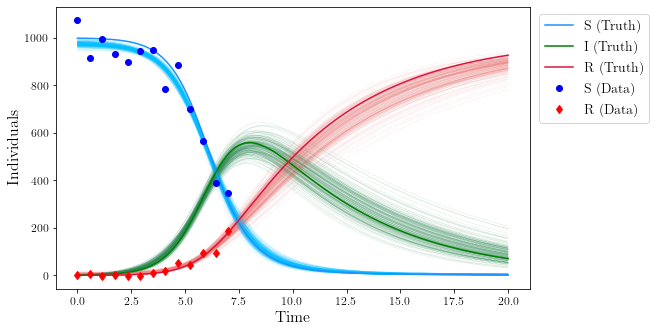

In [45]:
if do_state_uq:
    plt.figure(figsize=[9, 4.5])
#     for y, _ in zip(*rys):
#         plt.plot(ts, y.reshape(y_noisy.shape).T, 'k+', alpha=0.1)
    truth_ts = np.linspace(*t_span, 2001)
    for tii, c in zip(sol_true.sol(truth_ts), ['dodgerblue', 'green', 'crimson']):
        plt.plot(truth_ts, tii, label="Truth", color=c, zorder=2)
#     for zii, c in zip(solver.get_state(cor_sol, model).T.toarray(), ['mediumblue', 'darkgreen', 'maroon']):
#         plt.plot(model.observation_times, zii, '--', label='MLE', color=c, zorder=2)
    for yii, lbl, mk, c in zip(y_noisy, ['S (Data)', 'R (Data)'], ['o', 'd'], ['b', 'r']):
        plt.plot(ts, yii, mk, label=lbl, color=c, zorder=2)
    for s, _ in rss:
        sss = solver.get_state(s, model)
        plt.plot(model.observation_times, sss[:,0], 'deepskyblue', alpha=0.75, zorder=1, linewidth=0.1)
        plt.plot(model.observation_times, sss[:,1], 'seagreen', alpha=0.75, zorder=1, linewidth=0.1)
        plt.plot(model.observation_times, sss[:,2], 'lightcoral', alpha=0.75, zorder=1, linewidth=0.1)
        

    plt.legend(['S (Truth)', 'I (Truth)', 'R (Truth)',
#                 'S (MLE)', 'I (MLE)', 'R (MLE)',
                'S (Data)', 'R (Data)',],
               prop=legend_font,
               bbox_to_anchor=(1.005, 1), loc='upper left')
    plt.xlabel("Time", fontproperties=label_font)
    plt.ylabel("Individuals", font_properties=label_font)
    plt.xticks(fontproperties=tick_font)
    plt.yticks(fontproperties=tick_font)
    
#     plt.savefig("/home/dwu402/REPOS/writing/smb2021/sir_rml.pdf", dpi=360)

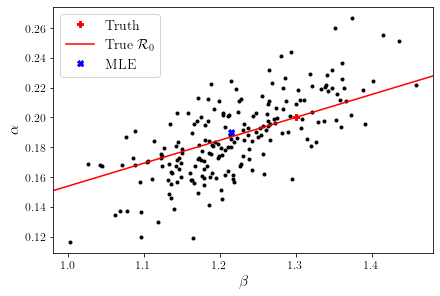

In [46]:
rss_ps = [np.squeeze(solver.get_parameters(x, model)) for x,_ in rss]
cor_ps = solver.get_parameters(cor_sol, model)
plt.figure()
plt.plot(*list(zip(*rss_ps)), 'k.')
plt.plot(*p_true, 'Pr', label='Truth')
plt.axline(p_true, slope=p_true[1]/p_true[0], color='r', label='True $\mathcal{R}_0$')
plt.plot(*cor_ps, 'Xb', label='MLE')
plt.xlabel("$\\beta$", fontproperties=label_font)
plt.ylabel("$\\alpha$", fontproperties=label_font)
plt.xticks(fontproperties=tick_font)
plt.yticks(fontproperties=tick_font)
plt.legend(prop=legend_font)
# plt.plot(*np.median(rss_ps, axis=0), 'o', mfc='none')
# plt.savefig("/home/dwu402/Data/writing/samoa/img/sir_rml_params.pdf", dpi=360)

[1.0679191498892127, 1.388133483300056]
[0.13641638315687926, 0.24161347573873856]


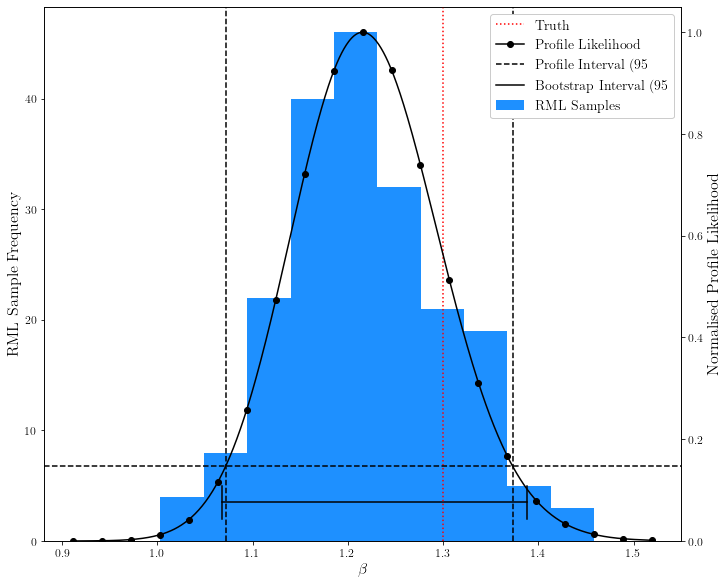

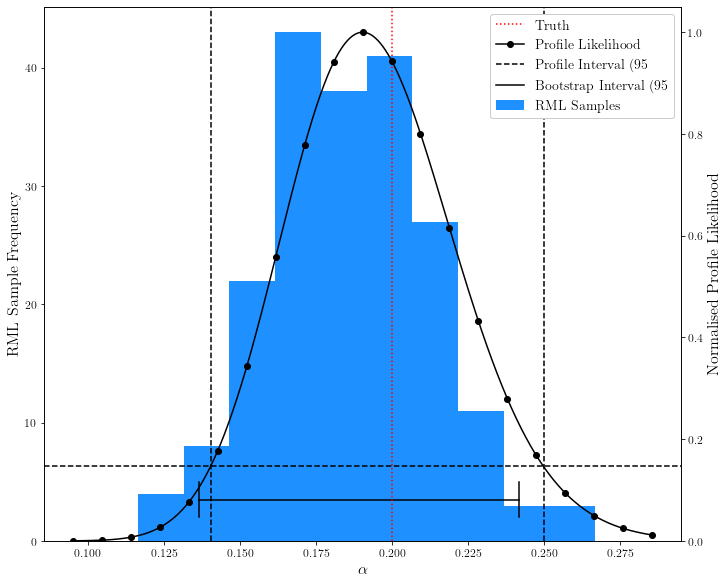

In [47]:
for bnds, pn, mv, pv, (i, profile), rsps in zip(explicit_bounds, ['beta', 'alpha',], mean_vals, p_true, enumerate(profiles), np.array(rss_ps).T):

    bnd_lims = (bnds[0][-1], bnds[-1][-1])

    ll_list = [np.squeeze(full_ll(s['s']['x'], p(cor_ws, y_noisy))) for s in profile.values()]
#     ll_list = [np.squeeze(full_ll(s['x'], p(cor_ws, y_noisy))) for s in profile['pf']['s']]
    normd_ll = [np.exp(-0.5*(lli - min(ll_list))) for lli in ll_list]

#     x = list(zip(np.concatenate(profile['ps']), normd_ll))
    x = list(zip(list(profile.keys()), normd_ll))
    xx = np.unique(x, axis=0)

    search0s = [(3*bnd_lims[0]+bnd_lims[1])/4, (bnd_lims[0]+3*bnd_lims[1])/4]
    dspl = interpolate.interp1d(*xx.T, kind='cubic', bounds_error=False, fill_value=0.0)
    d_pint = [float(optimize.fsolve(lambda x: dspl(x) - ninefive, (mv+x0)/2)) for x0 in search0s]

    xsx = np.linspace(*bnd_lims, 1001)
    
    bs_int = [np.quantile(rsps, 0.025), np.quantile(rsps, 0.975)]
    print(bs_int)
    
    f = plt.figure(figsize=[10,8], constrained_layout=True)
    ax = f.add_subplot()
    ax.hist(rsps, color='dodgerblue', label='RML Samples')
    ax.set_ylabel('RML Sample Frequency', fontproperties=label_font)
    
    for x in bs_int:
        ax.plot([x, x], [2, 5], color='k')
    ax.plot(bs_int, [3.5, 3.5], color='k', label="Bootstrap Interval (95%)")

    
    ax2 = ax.twinx()
    ax2.axvline(pv, color='r', label='Truth', linestyle='dotted')
    ax2.plot(xsx, dspl(xsx), 'k')
#     ax2.plot(np.concatenate(profile['ps']), normd_ll, 'ko')
    ax2.plot(list(profile.keys()), normd_ll, 'ko')
    ax2.set_ylim(0, None)
    ax2.axhline(ninefive, color='k', linestyle='--', label='Profile Interval (95%)')
    for d in d_pint:
        ax2.axvline(d, color='k', linestyle='--')
    ax2.set_ylabel("Normalised Profile Likelihood", fontproperties=label_font)
    ax.set_xlabel(f"$\\{pn}$", fontproperties=label_font)
    
    for l in ax.get_yticklabels():
        l.set_fontproperties(tick_font)
    for l in ax2.get_yticklabels():
        l.set_fontproperties(tick_font)
    for l in ax.get_xticklabels():
        l.set_fontproperties(tick_font)
    for l in ax2.get_xticklabels():
        l.set_fontproperties(tick_font)
        
#     plt.gca().set_xticklabels([i.get_text().replace('−', '$-$') for i in ax.get_xticklabels()])
    
    handles_ax, _ = ax.get_legend_handles_labels()
    handles_ax2, _ = ax2.get_legend_handles_labels()
    
    handles = [*handles_ax2, *handles_ax]
    handles.insert(1, Line2D([0], [0], color='k', marker='o', label='Profile Likelihood'))
    
    f.legend(handles=handles, loc='upper right', bbox_to_anchor=(1,1), bbox_transform=ax.transAxes, framealpha=1.0, prop=legend_font)
    
#     plt.savefig(f"/home/dwu402/Data/writing/samoa/img/sir_{pn}_profile_wrml.pdf", dpi=360)

[5.4030105932849, 8.290242288672479]
[5.4030105932849, 8.290242288672479]


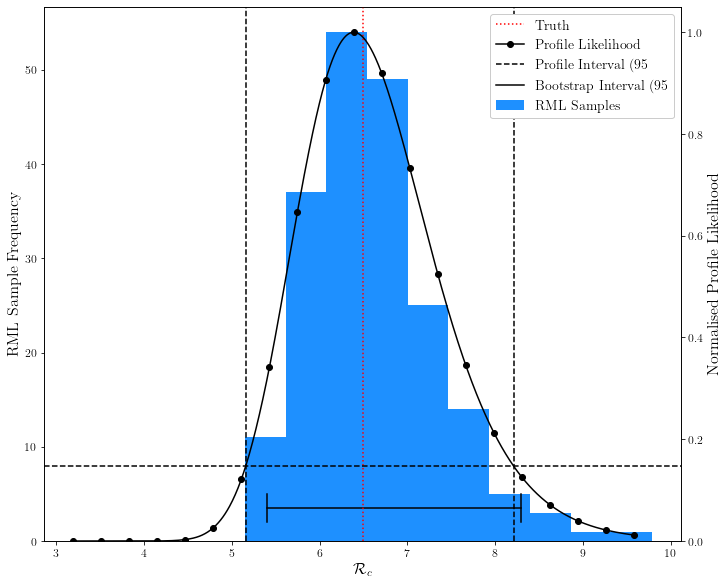

In [48]:
for bnds, pn, mv, pv, (i, profile), rsps in zip(r0pbounds, ['mathcal{R}_c',], [mean_vals[0]/mean_vals[1]], [p_true[0]/p_true[1]], enumerate(r0profile), [np.array(rss_ps)]):

    bnd_lims = (bnds[0][-1], bnds[-1][-1])

    ll_list = [np.squeeze(full_ll(s['s']['x'], p(cor_ws, y_noisy))) for s in profile.values()]
#     ll_list = [np.squeeze(full_ll(s['x'], p(cor_ws, y_noisy))) for s in profile['pf']['s']]
    normd_ll = [np.exp(-0.5*(lli - min(ll_list))) for lli in ll_list]

#     x = list(zip(np.concatenate(profile['ps']), normd_ll))
    x = list(zip(list(profile.keys()), normd_ll))
    xx = np.unique(x, axis=0)

    search0s = [(3*bnd_lims[0]+bnd_lims[1])/4, (bnd_lims[0]+3*bnd_lims[1])/4]
    dspl = interpolate.interp1d(*xx.T, kind='cubic', bounds_error=False, fill_value=0.0)
    d_pint = [float(optimize.fsolve(lambda x: dspl(x) - ninefive, (mv+x0)/2)) for x0 in search0s]

    xsx = np.linspace(*bnd_lims, 1001)
    
    r0rsps = rsps[:,0]/rsps[:,1]
    
    bss_int = [np.quantile(r0rsps, 0.025), np.quantile(r0rsps, 0.975)]
    print(bss_int)
    bs_int = [np.quantile(r0rsps, 0.025), np.quantile(r0rsps, 0.975)]
    print(bs_int)

    
    f = plt.figure(figsize=[10,8], constrained_layout=True)
    ax = f.add_subplot()
    ax.hist(r0rsps, color='dodgerblue', label='RML Samples')
    ax.set_ylabel('RML Sample Frequency', fontproperties=label_font)
    
    for x in bs_int:
        ax.plot([x, x], [2, 5], color='k')
    ax.plot(bs_int, [3.5, 3.5], color='k', label="Bootstrap Interval (95%)")

    
    ax2 = ax.twinx()
    ax2.axvline(pv, color='r', label='Truth', linestyle='dotted')
    ax2.plot(xsx, dspl(xsx), 'k')
#     ax2.plot(np.concatenate(profile['ps']), normd_ll, 'ko')
    ax2.plot(list(profile.keys()), normd_ll, 'ko')
    ax2.axhline(ninefive, color='k', linestyle='--', label='Profile Interval (95%)')
    for d in d_pint:
        ax2.axvline(d, color='k', linestyle='--')
    ax2.set_ylim(0, None)
    ax2.set_ylabel("Normalised Profile Likelihood", fontproperties=label_font)
    ax.set_xlabel(f"$\\{pn}$", fontproperties=label_font)
    
    for l in ax.get_yticklabels():
        l.set_fontproperties(tick_font)
    for l in ax2.get_yticklabels():
        l.set_fontproperties(tick_font)
    for l in ax.get_xticklabels():
        l.set_fontproperties(tick_font)
    for l in ax2.get_xticklabels():
        l.set_fontproperties(tick_font)
    
    handles_ax, _ = ax.get_legend_handles_labels()
    handles_ax2, _ = ax2.get_legend_handles_labels()
    
    handles = [*handles_ax2, *handles_ax]
    handles.insert(1, Line2D([0], [0], color='k', marker='o', label='Profile Likelihood'))
    
    f.legend(handles=handles, loc='upper right', bbox_to_anchor=(1,1), bbox_transform=ax.transAxes, framealpha=1.0, prop=legend_font)
    
#     plt.savefig(f"/home/dwu402/Data/writing/samoa/img/sir_r0_profile_wrml.pdf", dpi=360)

In [6]:
# gridding experiment (bounds effect on MLe/profile)

import pickle

with open("sir_bnds_explore.pkl", 'rb') as bfp:
    bnd_outs = pickle.load(bfp)

In [101]:
bnds_n = 21
model_up_bnds = np.logspace(4, 0, num=bnds_n)
data_lw_bnds = np.logspace(-4, 0, num=bnds_n)

MUB, DLB = np.meshgrid(model_up_bnds, data_lw_bnds)
MUB_flat, DLB_flat = MUB.flatten(), DLB.flatten()

In [102]:
bnd_outs = []

for mub, dlb in zip(MUB_flat, DLB_flat):
    wargs_ul = {'n_obsv': [n_obsv, model_config['grid_size']],
                'bounds': [(dlb, np.inf), (-np.inf, mub)]}
    sout = solver.irls(x0x0, p, y=y_noisy, nit=3, w0=w0w0, weight=huber_weight_function,
                       weight_args=wargs_ul, lbg=0, hist=True)
    bnd_outs.append(sout)

Iteration: 0
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:     2268
Number of nonzeros in Lagrangian Hessian.............:     1587

Total number of variables............................:      128
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:      600
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.013821686975922717
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)


Number of inequality constraint Jacobian evaluations = 38
Number of Lagrangian Hessian evaluations             = 37
Total CPU secs in IPOPT (w/o function evaluations)   =      0.045
Total CPU secs in NLP function evaluations           =      0.022

EXIT: Optimal Solution Found.
      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |   1.82ms ( 42.23us)   1.78ms ( 41.37us)        43
       nlp_g  | 651.00us ( 15.14us) 644.42us ( 14.99us)        43
    nlp_grad  | 125.00us (125.00us) 117.71us (117.71us)         1
  nlp_grad_f  |   2.94ms ( 75.49us)   2.91ms ( 74.65us)        39
  nlp_hess_l  |  17.94ms (484.92us)  17.95ms (485.22us)        37
   nlp_jac_g  | 752.00us ( 19.28us) 755.83us ( 19.38us)        39
       total  |  75.63ms ( 75.63ms)  75.35ms ( 75.35ms)         1
Iteration: 1
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constr

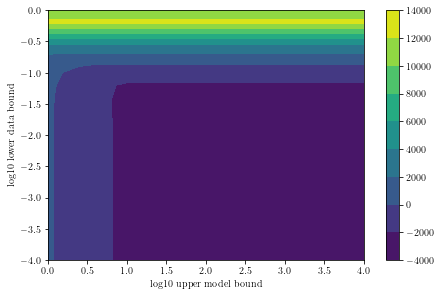

In [103]:
bnd_fs = np.array([float(s[0]['f']) for s in bnd_outs]).reshape((bnds_n, bnds_n))

fig = plt.figure()
ax = plt.axes()
cntr = ax.contourf(np.log10(MUB), np.log10(DLB), np.clip(bnd_fs, -1e5, 1e5))
ax.set_xlabel('log10 upper model bound')
ax.set_ylabel('log10 lower data bound')
plt.colorbar(cntr)

In [107]:
%matplotlib widget
fig = plt.figure()
ax = plt.axes(projection='3d')
ax.plot_wireframe(np.log10(MUB), np.log10(DLB), bnd_fs)
plt.title("Log likelihood as a function of bounds")
ax.set_zlim(-1e4, 1e4)
ax.set_xlabel('log10 upper model bound')
ax.set_ylabel('log10 lower data bound')

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Text(0.5, 0, 'log10 lower data bound')

In [105]:
def pvalid(s):
    return np.linalg.norm(np.array(p_true) - np.array(solver.get_parameters(s, model)).flatten())

bnds_verr_hist = [[validation(s) for s in out[2]] for out in bnd_outs]

bnds_verr_hist_best = [min([v for v in enumerate(verr_hist)], key=lambda x: x[1]) for verr_hist in bnds_verr_hist]

bnds_best_idx = np.array([x[0] for x in bnds_verr_hist_best])
bnds_best_verr = np.array([x[1] for x in bnds_verr_hist_best]).reshape((bnds_n, bnds_n))

In [116]:
final_iteration_validation = np.array([validation(out[0]) for out in bnd_outs]).reshape((bnds_n, bnds_n))
plt.figure()
ax = plt.axes(projection='3d')
ax.plot_wireframe(np.log10(MUB), np.log10(DLB), np.log10(final_iteration_validation))
# ax.set_zlim(-1e4, 1e4)
ax.set_xlabel('log10 upper model bound')
ax.set_ylabel('log10 lower data bound')

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Text(0.5, 0, 'log10 lower data bound')

In [118]:
fig = plt.figure()
ax = plt.axes()
cntr = ax.contourf(np.log10(MUB), np.log10(DLB), -np.log10(final_iteration_validation))


Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [108]:
f = plt.figure()
plt.title("Best iteration's validation error")
ax = plt.axes(projection='3d')
ax.plot_wireframe(np.log10(MUB), np.log10(DLB), bnds_best_verr)
ax.set_xlabel('log10 upper model bound')
ax.set_ylabel('log10 lower data bound')

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Text(0.5, 0, 'log10 lower data bound')

In [111]:
f = plt.figure()
ax = plt.axes(projection='3d')
ax.plot_surface(np.log10(MUB), np.log10(DLB), bnds_best_idx.reshape((bnds_n, bnds_n)), alpha=0.7)
ax.set_xlabel('log10 upper model bound')
ax.set_ylabel('log10 lower data bound')

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Text(0.5, 0, 'log10 lower data bound')

In [48]:
bnds_best_lik = [out[2][i]['f'] for i,out in zip(bnds_best_idx, bnd_outs)]

In [49]:
f = plt.figure()
ax = plt.axes(projection='3d')
ax.plot_wireframe(np.log10(MUB), np.log10(DLB), np.array(bnds_best_lik).reshape((bnds_n, bnds_n)))
ax.set_xlabel('log10 upper model bound')
ax.set_ylabel('log10 lower data bound')

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Text(0.5, 0, 'log10 lower data bound')

In [50]:
bnds_ll_hist = [[s['f'] for s in out[2]] for out in bnd_outs]

bnds_ll_hist_best = [min([ll for ll in enumerate(ll_hist)], key=lambda x: x[1]) for ll_hist in bnds_ll_hist]

bnds_ll_best_idx = np.array([x[0] for x in bnds_ll_hist_best])

In [51]:
f = plt.figure()
ax = plt.axes(projection='3d')
ax.plot_surface(np.log10(MUB), np.log10(DLB), bnds_ll_best_idx.reshape((bnds_n, bnds_n)), alpha=0.7)
ax.set_xlabel('log10 upper model bound')
ax.set_ylabel('log10 lower data bound')

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Text(0.5, 0, 'log10 lower data bound')

In [52]:
llbsx = np.array(bnds_ll_hist_best)[:, 1].reshape((bnds_n, bnds_n))
vebsx = np.array([x[1] for x in bnds_verr_hist_best]).reshape((bnds_n, bnds_n))
bbl = np.array(bnds_best_lik).reshape((bnds_n, bnds_n))


f = plt.figure()
ax = plt.axes(projection='3d')
ax.plot_surface(np.log10(MUB), np.log10(DLB), llbsx, alpha=0.7)
ax.set_xlabel('log10 upper model bound')
ax.set_ylabel('log10 lower data bound')
# ax.plot_wireframe(np.log10(MUB), np.log10(DLB), vebsx-np.min(vebsx), color='orange')
ax.plot_wireframe(np.log10(MUB), np.log10(DLB), bbl, color='green')

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [53]:
bnds_ll_best_verr = np.array([validation(out[2][i]) for i,out in zip(bnds_ll_best_idx, bnd_outs)]).reshape((bnds_n, bnds_n))

In [54]:
f = plt.figure()
ax = plt.axes(projection='3d')
ax.plot_wireframe(np.log10(MUB), np.log10(DLB), np.log10(bnds_ll_best_verr))
# ax.plot_wireframe(np.log10(MUB), np.log10(DLB), np.log10(bnds_best_lik), color='orange')
ax.set_xlabel('log10 upper model bound')
ax.set_ylabel('log10 lower data bound')
ax.set_zlabel('log10 validation error')
f.legend(['LL-based', 'Validation based'])

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [55]:
bnds_verr_iter1 = np.array([validation(out[2][1]) for out in bnd_outs]).reshape((bnds_n, bnds_n))

In [56]:
f = plt.figure()
ax = plt.axes(projection='3d')
ax.plot_wireframe(np.log10(MUB), np.log10(DLB), np.log10(bnds_best_verr))
ax.plot_wireframe(np.log10(MUB), np.log10(DLB), np.log10(bnds_verr_iter1), color='orange')
ax.set_zlim(5.25, 5.5)

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

(5.25, 5.5)

In [62]:
plt.figure()
for _,_,shist,*_ in bnd_outs:
    s = shist[1]
    states = solver.get_state(s, model)
    plt.plot(model.observation_times, states, color='k', alpha=0.75)
plt.plot(truth_ts, sol_true.sol(truth_ts).T, 'r')
plt.plot(model.observation_times, solver.get_state(cor_sol, model), color='green')

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [57]:
flat_min_valid_idxs = np.flatnonzero(DLB_flat == 0.1)
flat_min_valid_idx = flat_min_valid_idxs[0]
flat_min_valid_sol = bnd_outs[flat_min_valid_idx][2][1]
flat_min_valid_ws = bnd_outs[flat_min_valid_idx][3][1]

In [140]:
xvar = 0.25

r0profile_mv = []
for ii, lw in enumerate(data_lw_bnds):
    dlx_idx = ii*21
    flat_sol = bnd_outs[dlx_idx][2][1]
    flat_ws = bnd_outs[dlx_idx][3][1]
    r0mle = float(R0_profile_config['pidx'](flat_sol['x']))
    flat_r0pbounds = [r0solver.profilers[0].symmetric_bound_sets(flat_sol, variance=xvar)]
    wargs_fmv = {'n_obsv': [n_obsv, model_config['grid_size']],
                 'bounds': [(lw, np.inf), (-np.inf, np.inf)]}

    r0profile_mv.append(r0solver.profile(flat_sol, p=p, weight=huber_weight_function, w0=flat_ws, y=y_noisy, nit=2, weight_args=wargs_fmv, pbounds=flat_r0pbounds))

Iteration: 0
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        2
Number of nonzeros in inequality constraint Jacobian.:     2268
Number of nonzeros in Lagrangian Hessian.............:     1587

Total number of variables............................:      128
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        1
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.024463900950038784
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)
/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.024397642542478424
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)
/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.024302767788079487
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)
/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.02417522003901946
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)
/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.

Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   0.0000000000000000e+00    0.0000000000000000e+00
Overall NLP error.......:   1.1124257071060129e-10    1.1124257071060129e-10


Number of objective function evaluations             = 5
Number of objective gradient evaluations             = 5
Number of equality constraint evaluations            = 5
Number of inequality constraint evaluations          = 5
Number of equality constraint Jacobian evaluations   = 5
Number of inequality constraint Jacobian evaluations = 5
Number of Lagrangian Hessian evaluations             = 4
Total CPU secs in IPOPT (w/o function evaluations)   =      0.009
Total CPU secs in NLP function evaluations           =      0.003

EXIT: Optimal Solution Found.
      solver  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  | 232.00us ( 46.40us) 232.26us ( 46.45us)         5
       nlp_g  |  81.00us ( 16.20us)  80.00us ( 16.00us)         5
    nlp

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.023227286734851138
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)
/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.02284291209438174
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)
/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.022378865896014996
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)
/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.02182106834419255
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)
/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.0

Iteration: 0
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        2
Number of nonzeros in inequality constraint Jacobian.:     2268
Number of nonzeros in Lagrangian Hessian.............:     1587

Total number of variables............................:      128
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        1
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_

/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.024504312489820303
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)
/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.0244700055959089
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)
/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.02442155243859949
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)
/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.024360360585690778
  warnings.warn(f"Log-Likelihood is not improving: {err}", category=Solver.StepControlWarning)
/media/dwu402/Data/cashpack/pypei/irls_fitter.py:231: StepControlWarning: Log-Likelihood is not improving: 0.02

                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        1
Total number of inequality constraints...............:      600
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  3.9916820e+03 1.50e-01 5.98e-01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0 y

Number of Iterations....: 4

                                   (scaled)                 (unscaled)
Objective...............:   1.0639417243663215e+03    3.7698615611850046e+03
Dual infeasibility......:   5.4924953474255744e-11    1.9461542499030677e-10
Constraint violation....:   8.8817841970012523e-16    8.881784197001

In [145]:
def line_prof(sdict):
    ps = np.array(list(sdict.keys()))
    ll = np.array([float(v['s']['f']) for v in sdict.values()])
    ll_n = ll - np.min(ll)
    return ps, np.exp(-0.5 * ll_n)
    
profiles = [line_prof(s[0]) for s in r0profile_mv]

In [146]:
from matplotlib import cm, colors

def colour_over(vmin, vmax, cmstr='viridis'):
    """ Creates a colormap that can be used for defining plot colours """
    cNorm = colors.Normalize(vmin=vmin, vmax=vmax)
    cmap = plt.get_cmap(cmstr)
    sMap = cm.ScalarMappable(norm=cNorm, cmap=cmap)
    return sMap


In [179]:
plt.figure()
p_sMap = colour_over(np.log10(min(data_lw_bnds)), np.log10(max(data_lw_bnds)), 'plasma')
for dlb, px in zip(data_lw_bnds, profiles):
    if dlb == 0.1:
        cx = 'k'
    else:
        cx = p_sMap.to_rgba(np.log10(dlb))
    plt.plot(*px, color=cx)
cbar = plt.colorbar(p_sMap)
cbar.set_label(r"$\log_{10}$(lower bound on data)")
cbar.ax.axhline(np.log10(0.1), color='k')
plt.axvline(p_true[0]/p_true[1], color='r', linestyle='dashed')

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [178]:

def xtract_weight(sdict):
    weights = np.array([x['w'] for x in sdict.values()])
    return weights[:,0], weights[:,1]
    
wwwwww = np.array([xtract_weight(s[0]) for s in r0profile_mv])

plt.figure()
plt.loglog(data_lw_bnds, wwwwww[:,0,:], '.', color=dColours[0])
plt.loglog(data_lw_bnds, wwwwww[:,1,:], '.', color=dColours[1])
plt.xlabel("data lower bound")
plt.ylabel("estimated weight")
plt.loglog(data_lw_bnds, data_lw_bnds, color='k')
plt.loglog(data_lw_bnds, np.array([bnd_outs[21*ii][3][1] for ii in range(21)]), 'x')
# plt.legend()

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [192]:
plt.figure()
for dlb, s in zip(data_lw_bnds, r0profile_mv):
    c = p_sMap.to_rgba(np.log10(dlb))
    for v in s[0].values():
        sx = v['s']
        xx = solver.get_state(sx, model)
        plt.plot(model.observation_times, xx, alpha=0.25, linewidth=1, color=c)
plt.colorbar(p_sMap)
for tii in sol_true.sol(model.observation_times):
        plt.plot(model.observation_times, tii, label="Truth", color='k', alpha=0.7)
plt.plot(ts, y_noisy.T, 'ok', alpha=0.7)


Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [201]:
plt.figure()

ks = list(r0profile_mv[15][0].keys())
k_Map = colour_over(min(ks), max(ks), 'viridis')
for k, v in r0profile_mv[15][0].items():
    if k == ks[11]:
        c = 'red'
    else:
        c = k_Map.to_rgba(k)
    sx = v['s']
    xx = solver.get_state(sx, model)
    plt.plot(model.observation_times, xx, alpha=0.75, linewidth=1, color=c)
cbar = plt.colorbar(k_Map)
cbar.ax.axhline(ks[11], color='red')
cbar.set_label("R0 profile at bound=0.1")
for tii in sol_true.sol(model.observation_times):
        plt.plot(model.observation_times, tii, label="Truth", color='k', alpha=0.7)
plt.plot(ts, y_noisy.T, 'ok', alpha=0.7)


Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [211]:
# interval plot
plt.figure()
for dlb, s in zip(data_lw_bnds, r0profile_mv):
    c = p_sMap.to_rgba(np.log10(dlb))
    finals = [float(solver.get_state(v['s'], model)[-1, 2]) for v in s[0].values()]
    plt.plot(s[0].keys(), finals, color=c)
plt.colorbar(p_sMap)

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [110]:
plt.figure()
plt.plot(r0profile_mv[15][0].keys(), [float(solver.get_state(v['s'], model)[-1, 2]) for v in r0profile_mv[15][0].values()])


Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

NameError: name 'r0profile_mv' is not defined

In [214]:
1/(np.sqrt(np.diff(model.observation_times)[0]) * 1e-1)

31.543620591175006

In [219]:
np.std(y_noisy - ys) ** (-1) / np.sqrt(np.diff(model.observation_times)[0])

0.07501710250909042